In [1]:
#Astropy
import astropy
from astropy.io import fits
from astropy.table import Table
from astropy import units as u

# Dlnpyutils and ages
from dlnpyutils.utils import bspline,mad,interp
import dlnpyutils.robust as robust
import ages as ages

# dust_extinction
from dust_extinction.parameter_averages import CCM89,O94,F99,VCG04,GCC09,M14,F19,D22

# functools
from functools import partial

# Matplotlib
import matplotlib
import matplotlib.pyplot as plt
# %matplotlib inline
matplotlib.rcParams.update({'font.size': 25,'axes.facecolor':'w'})
from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=True)

#Numpy/Scipy
import numpy as np
import scipy
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

# pdb
import pdb

# tqdm 
from tqdm.notebook import tqdm

In [2]:
def closest(data,value):
    '''
    Find nearest value in array to given value

    Inputs:
    ------
        data:  array-like
               data to search through

        value: float or int
               value of interest

    Output:
    ------
        close: float or int
               value in data closest to given value
    '''

    data = np.asarray(data)

    return data[(np.abs(np.subtract(data,value))).argmin()]

def sfdebv_2_ext(ebv,wave):
    '''
    Convert Schlegel Reddening to extinction using Schlafly et al. 2010 and Fitzpatrick 1999
    
    Inputs:
    ------
        ebv:  float
              Schlegel E(B-V) value
              
        wave: float
              wavelength of band to calculate extinction in mircons
        
    Output:
    ------
        ext:  float
              extinction in the band with the effective wavelength of wave
    '''
    
    micron_ext = (0.78/1.32)*ebv # Schlafly et al. 2010
    ext = f99(wave)/f99(1)*micron_ext # Fitzpatrick 1999
    return ext

import astropy.units as u
def convert_sfdebv(wave,ebv,rv=3.1):
    '''
    Convert Schlegel Reddening to extinction using Schlafly et al. 2010
    
    Inputs:
    ------
        wave: wavelength of band to calculate extinction in mircons
        ebv: Schlegel E(B-V) value
        
    Output:
    ------
        new_extinction: extinction in the band with the effective wavelength of wave
    '''
    
    micron_extinction = (0.78/1.32)*ebv
    fitz = F99(Rv=rv)
    return fitz(1/(wave*u.micron))/fitz(1*u.micron)*micron_extinction

import astropy.units as u
from dust_extinction.parameter_averages import CCM89,O94,F99,VCG04,GCC09,M14,F19,D22

def extcoeff(wavelength,rv=3.1,law='CCM89',ref='G'):

    '''
    Calculate the relative extincion law coefficients for a given wavelength relative to the 
    BP, G, RP, J, H, K or user defined band

    Input:
    -----
        wavelength: float
                    Effective wavelength of band of interest in microns
        
        law:        str
                    extinction law to use
                         
                    Available Extinction Laws: 
                    -------------------------
                        
                    CCM89 - Cardelli, Clayton, & Mathis 1989
                    O94 - O'Donnell 1994
                    F99 - Fitzpatrick 1999
                    F04 - Fitzpatrick 2004
                    VCG04 - Valencic, Clayton, & Gordon 2004
                    GCC09 - Grodon, Cartledge, & Clayton 2009
                    M14 - Maiz Apellaniz et al 2014
                    F19 - Fitzpatrick, Massa, Gordon, Bohlin & Clayton 2019
                    D22 - Decleir et al. 2022

        rv:         float
                    Rv (=Av/E(B-V)) extinction law slope. Default is 3.1
        
        ref:        str or float
                    reference filter. Can be 'BP', 'G', 'RP', 'J', 'H', 'K' 
                    or user defined float that is the wavelength in microns of the band

    Output:
    ------
        ext_coeff:  float
                    calculated extinction coefficients for the BP, G, RP, J, H, and K bands 
                    relative to the Gaia G band

    '''

    leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
    
    # select the extinction model
    if law == 'CCM89':
        ext_model = CCM89(Rv=rv)

    elif law == 'O94':
        ext_model = O94(Rv=rv)

    elif law == 'F99':
        ext_model = F99(Rv=rv)

    elif law == 'F04':
        ext_model = F04(Rv=rv)

    elif law == 'VCG04':
        ext_model = VCG04(Rv=rv)

    elif law == 'GCC09':
        ext_model = GCC09(Rv=rv)

    elif law == 'M14':
        ext_model = M14(Rv=rv)

    elif law == 'F19':
        ext_model = F19(Rv=rv)

    elif law == 'D22':
        ext_model = D22(Rv=rv)   

    # Calculate the relative extinction coefficient
    if type(ref) == str:
        ext_coeff = ext_model(wavelength*u.micron)/ext_model(leff[ref]*u.micron)
    
    elif type(ref) == float:
        ext_coeff = ext_model(wavelength*u.micron)/ext_model(ref*u.micron)
    
    return ext_coeff

### Geometry

import MagellanicStream as MagellanicStream

def LMCdisk_cart(ra, dec):
    
    '''
    Calculate the position of stars in the LMC disk plane with 
    center at the LMC center in cartesian coordinates (x, y).
    This also calculates the distance to the individual stars.
    
    This follows van der Marel and Cioni 2001 with parameters from Choi et al. 2018 (SMASHing the LMC: 
    Mapping a Ring-like Stellar Overdensity in the LMC Disk)
    
    Input
    - ra: right ascension of stars
    - dec: declination of stars
    
    Output
    - x_m: x coordinate
    - y_m: y coordinate
    - dis: distance to LMC star
    '''
    alph0 = np.radians(82.25) #right ascension of center of LMC
    delt0 = np.radians(-69.50) #declination of center of LMC
    pa = np.radians(149.23+90.00) #146.37 #position angle of line of nodes
    io = np.radians(25.86) #27.81 #inclination of LMC disk
    d0 = 49.90 #distance to center of LMC
    
    #convert to radians
    ra = np.radians(ra)
    dec = np.radians(dec)
    sd = np.sin(delt0)
    cd = np.cos(delt0)
    
    cr = cd*np.cos(dec)*np.cos(ra-alph0)+sd*np.sin(dec)
    srcp = -np.cos(dec)*np.sin(ra-alph0)
    srsp = cd*np.sin(dec) - sd*np.cos(dec)*np.cos(ra-alph0)
    dis = d0*np.cos(io)/(np.cos(io)*cr - np.sin(io)*np.cos(pa)*srsp + np.sin(io)*np.sin(pa)*srcp)
    
    x_m = dis*srcp
    y_m = dis*(np.cos(io)*srsp + np.sin(io)*cr) - d0*np.sin(io)
    
    return x_m, y_m, dis

def elliptical_radius(x,y):
    '''
    Calculate elliptical radius from cartesian(x,y) using equation 6 form Choi et al. 2018 (SMASHing the LMC: 
    Mapping a Ring-like Stellar Overdensity in the LMC Disk)
    
    Parameters:
    ----------
        x: x cartesian coordinate
        y: y cartesian coordinate
        psi: semimajor axis position angle
    Returns:
    -------
        ell_r: elliptical radius
    '''
    
    
    b_a = 0.836 # disk axis ratio
    psi = 227.24 + 90 # position angle of semi major axis
    cpsi = np.cos(np.radians(psi)) 
    spsi = np.cos(np.radians(psi))
    
    ell_r = np.sqrt(np.square(x*cpsi-y*spsi) + np.square(b_a*(x*spsi + y*cpsi)))
    
    return ell_r

def superellipse_radius(x,y):
    b_a = 0.836 # disk axis ratio
    psi = 227.24 + 90 # position angle of semi major axis
    c0 = 2.999 # bar shape parameter
    cpsi = np.cos(np.radians(psi)) 
    spsi = np.cos(np.radians(psi))
    
    sell_r = (np.abs(x*cpsi-y*spsi)**c0 + np.abs(b_a*(x*spsi + y*cpsi))**c0)**(1/c0)
    
    return sell_r

# Gaia

In [3]:
mcs = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/lmc_josh.fits.gz')
mcs = mcs[(np.isfinite(mcs['ra'])==True)&(np.isfinite(mcs['dec'])==True)]

# SMASH

In [4]:
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord

smash_ext, smash_hdr = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/apjaae083f10/dbf10a.fits',header=True)

smash_ag = smash_ext/(extcoeff(0.472)-extcoeff(0.7835))

w = WCS(smash_hdr)

smash_hdr

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   89                                                  
NAXIS2  =                   92                                                  
WCSAXES =                    2 / Number of coordinate axes                      
CRPIX1  =                 50.5 / Pixel coordinate of reference point            
CRPIX2  =                 63.5 / Pixel coordinate of reference point            
CDELT1  =     0.17158643174113 / [deg] Coordinate increment at reference point  
CDELT2  =     0.17176791738885 / [deg] Coordinate increment at reference point  
CUNIT1  = 'deg'                / Units of coordinate increment and value        
CUNIT2  = 'deg'                / Units of coordinate increment and value        
CTYPE1  = 'RA---TAN'        

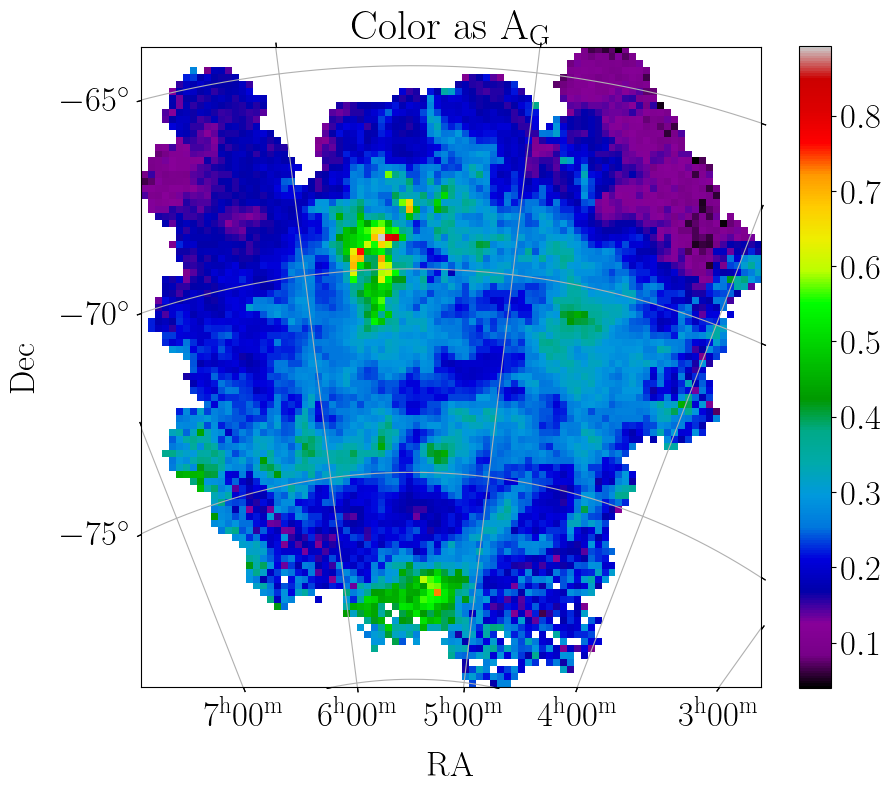

In [5]:
# plt.imshow(smash_ag,cmap='nipy_spectral')
# plt.colorbar()

fig = plt.figure(figsize=[10,10])
fig.add_subplot(111, projection=w)
plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral')
plt.colorbar(shrink=0.8345)
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()
plt.title(r'Color as A$_{\rm G}$')
plt.show()

# APOGEE LMC 

In [6]:
lmcdr17 = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/lmc_rgbmembers.dr17rev1_qacuts.fits.gz')

apoafe = lmcdr17['ALPHA_M']+lmcdr17['M_H']-lmcdr17['FE_H']
apoafe_err = np.sqrt(lmcdr17['ALPHA_M_ERR']**2+lmcdr17['M_H_ERR']**2+lmcdr17['FE_H']**2)

salfeh = lmcdr17['FE_H']+np.log10(0.659*(10**(apoafe))+0.341)
salfeh_err = np.sqrt(lmcdr17['FE_H_ERR']**2+((1-0.341/(0.659*(10**(apoafe))+0.341))*apoafe_err)**2)

diane = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/output_LMC_DR16_all.fits.gz')

_, diane_idx, me_idx = np.intersect1d(diane['APOGEE_ID'],lmcdr17['APOGEE_ID'], return_indices=True)

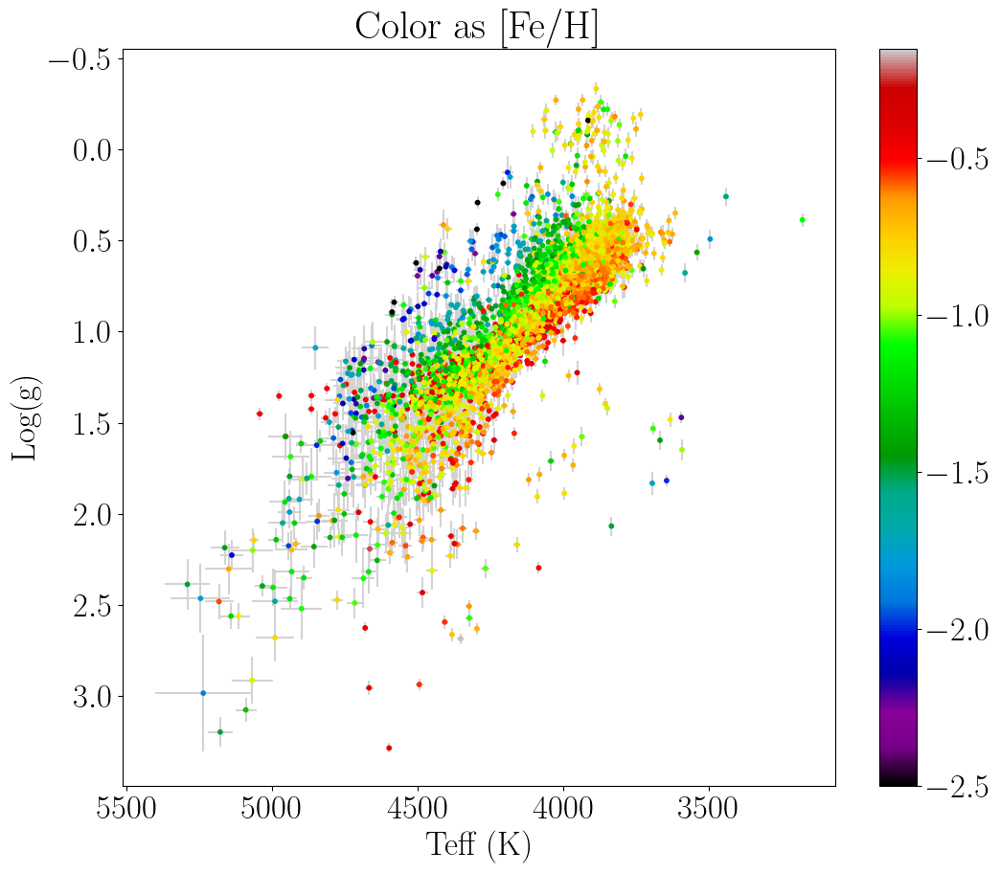

In [7]:
plt.figure(figsize=[12,10])
plt.scatter(lmcdr17['TEFF'],lmcdr17['LOGG'],c=lmcdr17['FE_H'],cmap='nipy_spectral',s=10)
plt.colorbar()
plt.errorbar(lmcdr17['TEFF'],lmcdr17['LOGG'],xerr=lmcdr17['TEFF_ERR'],yerr=lmcdr17['LOGG_ERR'],c='lightgrey',ls=' ',zorder=0)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Teff (K)')
plt.ylabel(r'Log(g)')
plt.savefig('LMC_HR.png',bbox_inches='tight')
plt.show()

In [8]:
### Position/Distances of the LMC stars

from dlnpyutils import coords
import astropy.units as u
from astropy.coordinates import SkyCoord

lmcx, lmcy, lmcdis = LMCdisk_cart(lmcdr17['RA'], lmcdr17['DEC'])
lmcr = elliptical_radius(lmcx,lmcy)
lmcsr = superellipse_radius(lmcx,lmcy)

### lmcdr17
gc = SkyCoord(ra=lmcdr17['RA']*u.degree, dec=lmcdr17['DEC']*u.degree, frame='icrs')
lms_lmc,bms_lmc = coords.gal2mag(gc.galactic.l.value,gc.galactic.b.value)

for i in range(len(lms_lmc)):
    if lms_lmc[i] > 180.:
        lms_lmc[i] = lms_lmc[i]-360
        
gaiax, gaiay, gaiadis = LMCdisk_cart(mcs['ra'], mcs['dec'])

gaiar = elliptical_radius(gaiax,gaiay)
gaiasr = superellipse_radius(gaiax,gaiay)

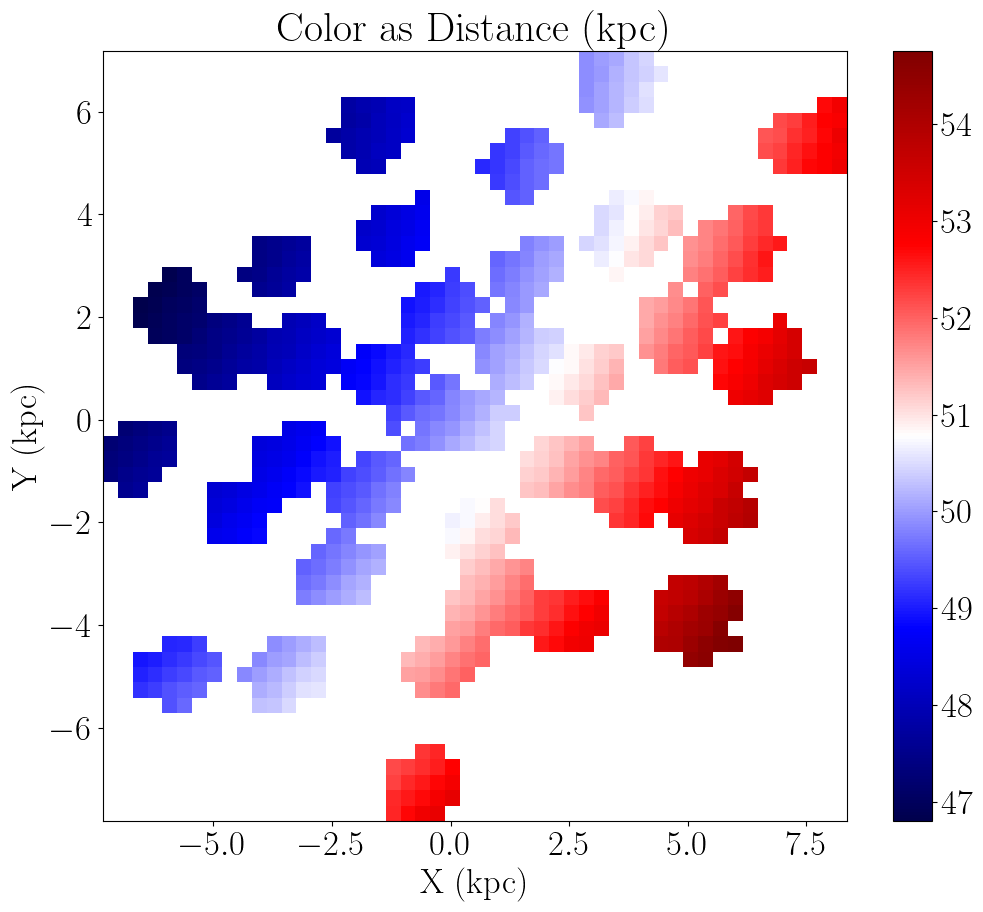

In [9]:
from scipy.stats import binned_statistic_2d

plt.figure(figsize=[12,10])
ret = binned_statistic_2d(lmcx,lmcy,lmcdis,'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='seismic')
plt.colorbar()

# plt.gca().invert_xaxis()

plt.title(r'Color as Distance (kpc)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('../plots/lmc_map_distance.png',dpi=300,bbox_inches='tight')
plt.show()

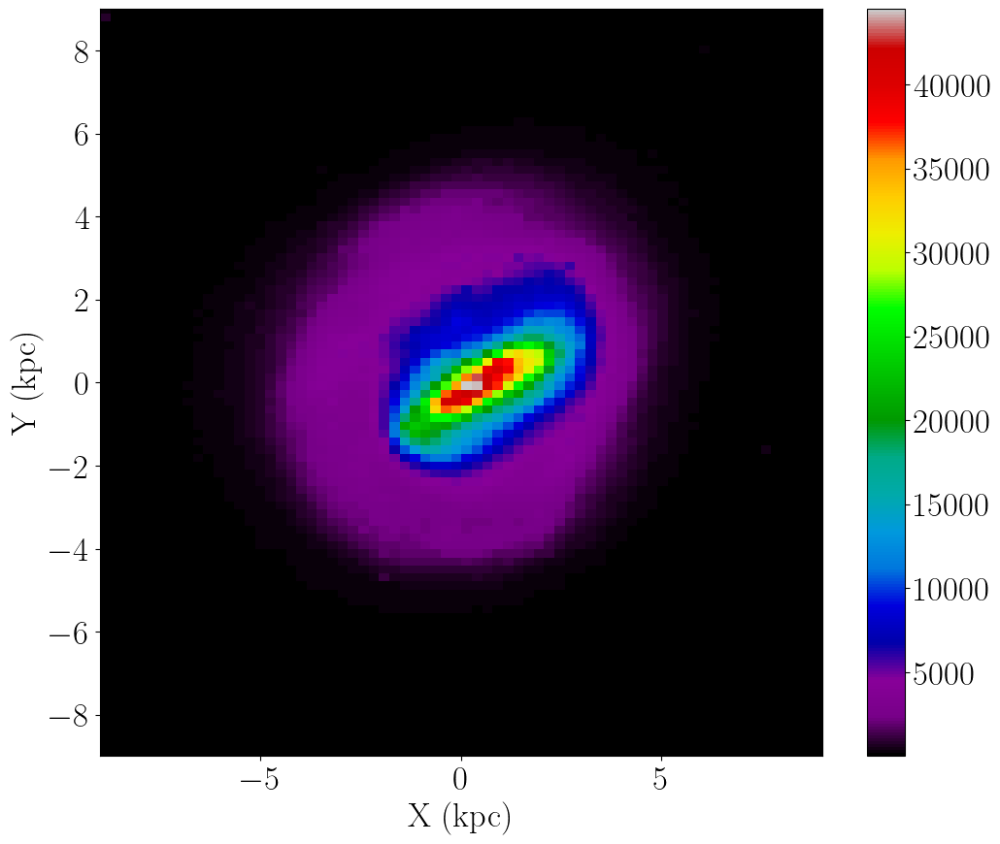

In [10]:
plt.figure(figsize=[12,10])
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=500)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',alpha=1)
plt.colorbar()

# plt.scatter(lmcx,lmcy,s=10)

plt.xlim(-9,9)
plt.ylim(-9,9)

# plt.gca().invert_xaxis()

# plt.title(r'Color as Distance (kpc)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('../plots/lmc_map_distance.png',dpi=300,bbox_inches='tight')
plt.show()

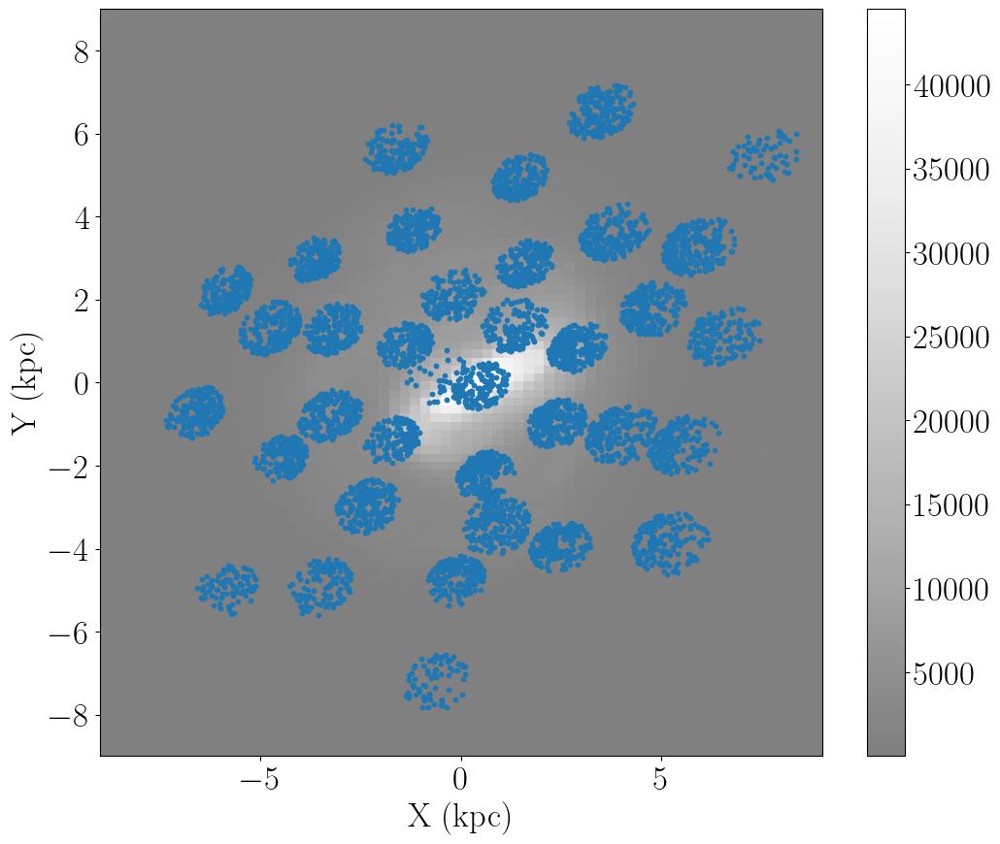

In [11]:
plt.figure(figsize=[12,10])
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=500)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='Greys_r',alpha=0.5)
plt.colorbar()

plt.scatter(lmcx,lmcy,s=10)

plt.xlim(-9,9)
plt.ylim(-9,9)

# plt.gca().invert_xaxis()

# plt.title(r'Color as Distance (kpc)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('../plots/lmc_map_distance.png',dpi=300,bbox_inches='tight')
plt.show()

# Calculated Age Read in 

In [12]:
agetab = Table.read('lmc_lm_wgtage_21OCT2022.fits')

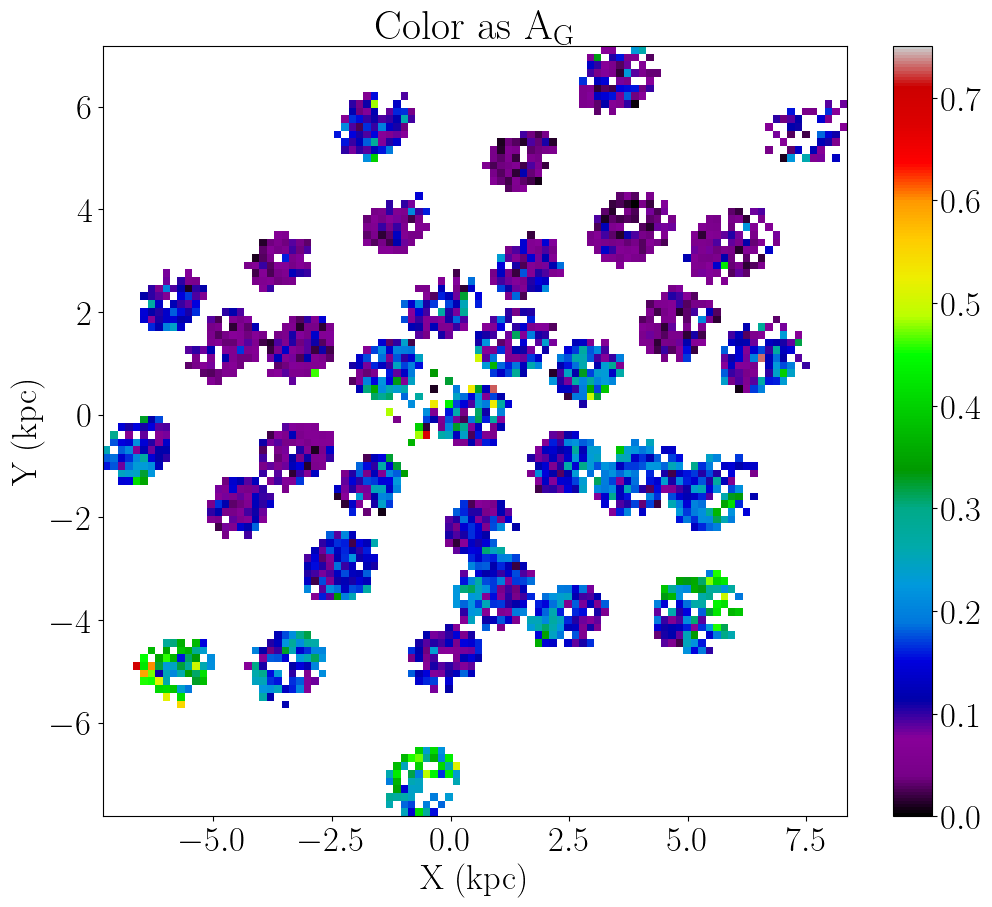

0.00029108675506595304


In [13]:
plt.figure(figsize=[12,10])
ret = binned_statistic_2d(lmcx[agetab['EXT'][:,1]!=999999.0],lmcy[agetab['EXT'][:,1]!=999999.0],agetab['EXT'][:,1][agetab['EXT'][:,1]!=999999.0],'median',bins=100)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=0.75)
plt.colorbar()

plt.title(r'Color as A$_{\rm G}$')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')
plt.show()

print(np.nanmin(ret.statistic))

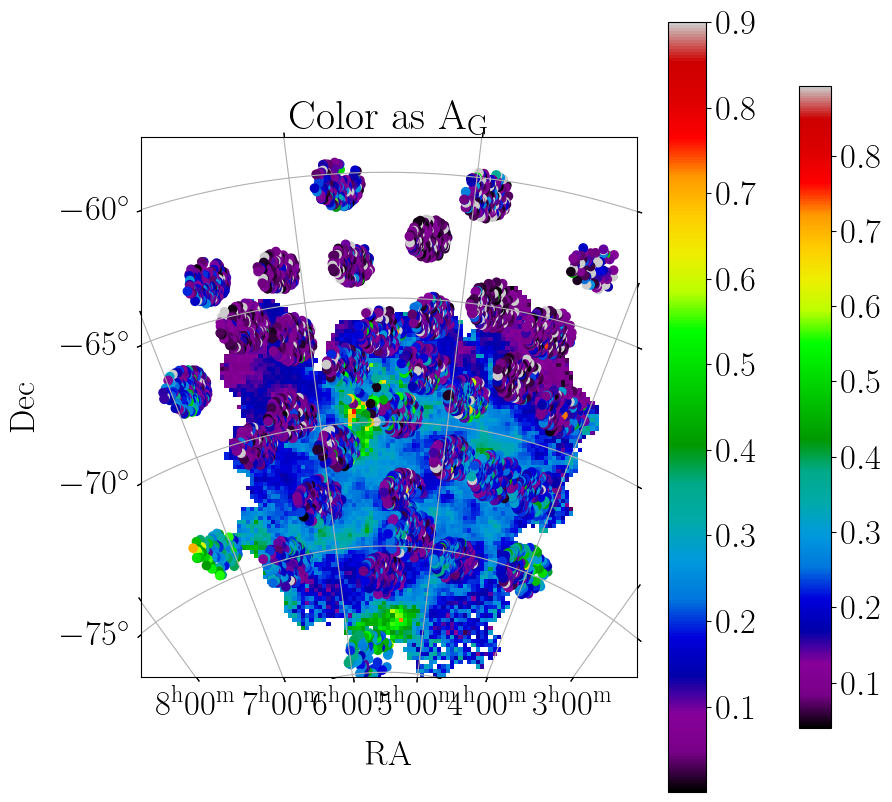

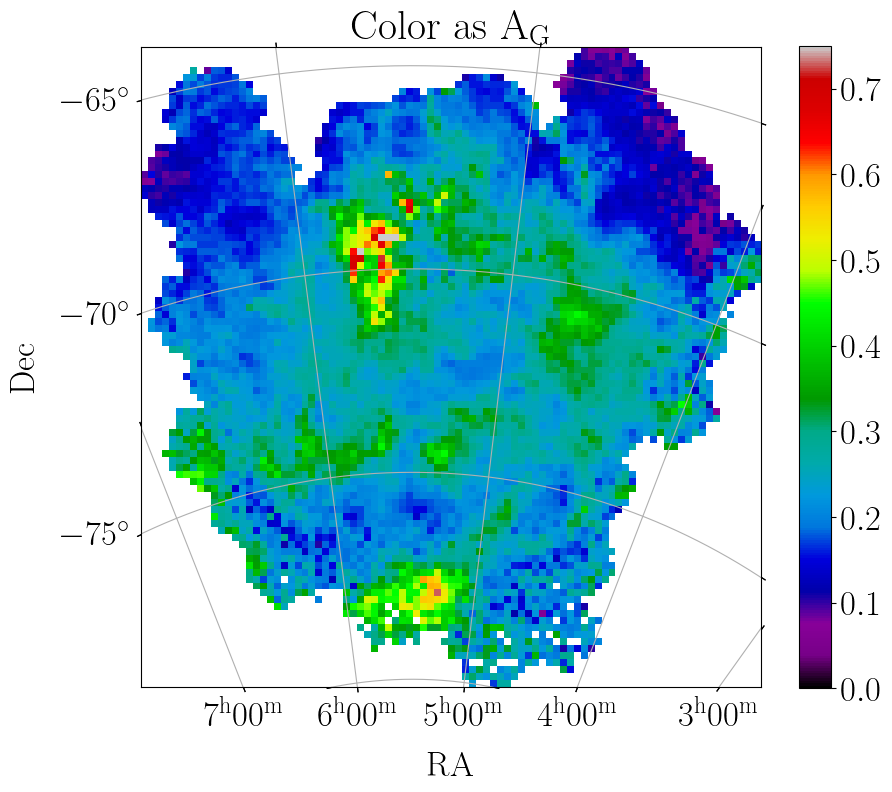

In [14]:
fig = plt.figure(figsize=[10,10])
fig.add_subplot(111, projection=w)
plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral')
plt.colorbar(shrink=0.8345)
plt.scatter(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0],w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1],c=agetab['EXT'][:,1],cmap='nipy_spectral',vmax=0.9)
plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()
plt.title(r'Color as A$_{\rm G}$')

fig = plt.figure(figsize=[10,10])
fig.add_subplot(111, projection=w)
plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral', vmin=0.0, vmax=0.75)
plt.colorbar(shrink=0.8345)
# plt.scatter(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0],w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1],c=agetab['EXT'][:,1],cmap='nipy_spectral',vmax=0.9)
# plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()
plt.title(r'Color as A$_{\rm G}$')
plt.show()

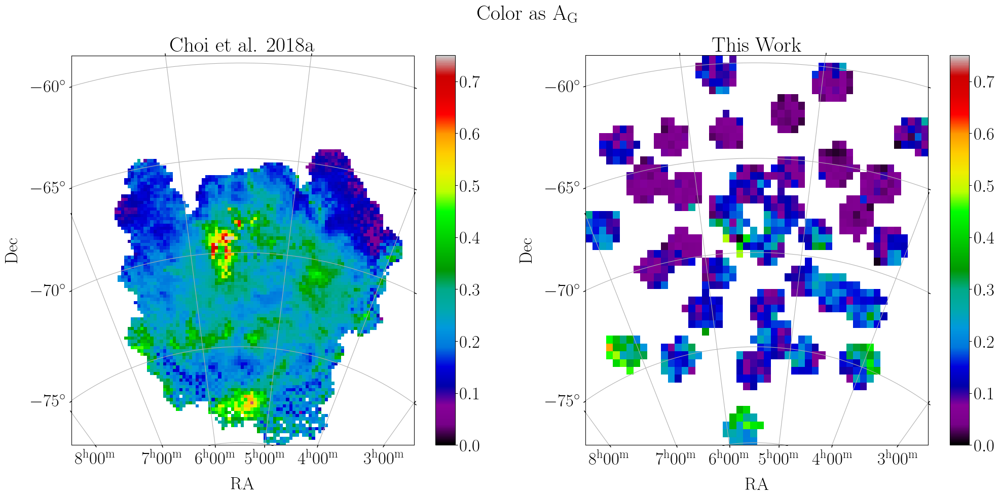

In [15]:
ret = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][agetab['EXT'][:,1]!=999999.0],
                          w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][agetab['EXT'][:,1]!=999999.0],
                          agetab['EXT'][:,1][agetab['EXT'][:,1]!=999999.0],'median',bins=50)

# fig, ax = plt.subplots(1,2,figsize=[24,10],projection=w)
fig = plt.figure(figsize=[24,10])
plt.suptitle(r'Color as A$_{\rm G}$')

plt.subplot(121,projection=w)
plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral',vmin=0,vmax=0.75)
plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.xlim(np.nanmin(ret.x_edge),np.nanmax(ret.x_edge))
plt.ylim(np.nanmin(ret.y_edge),np.nanmax(ret.y_edge))
plt.gca().invert_xaxis()
plt.title(r'Choi et al. 2018a')

plt.subplot(122,projection=w)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=0.75)
plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()
plt.title(r'This Work')
# plt.savefig('choi_ext_conmpare.png',bbox_inches='tight')
plt.show()

  0%|          | 0/6130 [00:00<?, ?it/s]

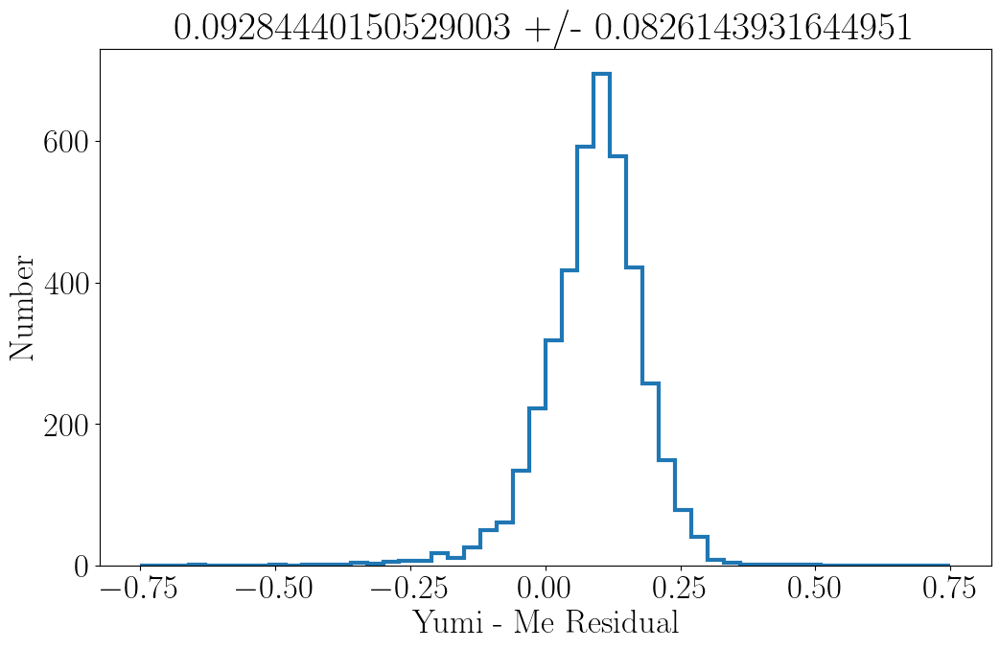

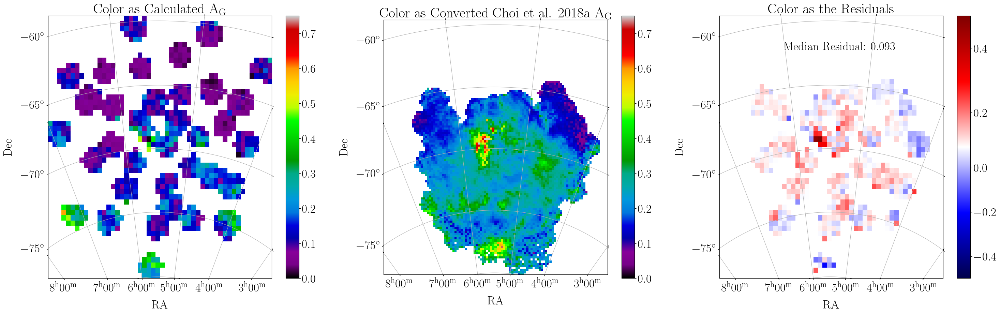

In [428]:
pix_coord_apogee = np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)).astype(int).T

yumi_near_val = 999999.0*np.ones(len(pix_coord_apogee))

for i in tqdm(range(len(lmcdr17))):
    
    # if (pix_coord_apogee[i,0]<np.shape(smash_ag)[0]-1) & (pix_coord_apogee[i,0]<np.shape(smash_ag)[1]-1):
    try:
        yumi_near_val[i] = smash_ag[pix_coord_apogee[i,1],pix_coord_apogee[i,0]] 
        
    except:
        yumi_near_val[i] = np.nan

yumi_mine_diff = yumi_near_val - agetab['EXT'][:,1]

plt.figure(figsize=[12,7])
plt.hist(yumi_mine_diff,range=(-0.75,0.75),bins=50,histtype='step',lw=3.0)
plt.title('{} +/- {}'.format(np.nanmedian(yumi_mine_diff),mad(yumi_mine_diff)))
plt.xlabel(r'Yumi - Me Residual')
plt.ylabel(r'Number')
plt.show()
    

ret = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][agetab['EXT'][:,1]!=999999.0],
                          w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][agetab['EXT'][:,1]!=999999.0],
                          agetab['EXT'][:,1][agetab['EXT'][:,1]!=999999.0],'median',bins=50)

fig = plt.figure(figsize=[36,10])
# plt.suptitle(r'Color as A$_{\rm G}$')

plt.subplot(132,projection=w)
plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral',vmin=0,vmax=0.75)
plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.xlim(np.nanmin(ret.x_edge),np.nanmax(ret.x_edge))
plt.ylim(np.nanmin(ret.y_edge),np.nanmax(ret.y_edge))
plt.gca().invert_xaxis()
plt.title(r'Color as Converted Choi et al. 2018a A$_{\rm G}$')

plt.subplot(131,projection=w)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=0.75)
plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()
plt.title(r'Color as Calculated A$_{\rm G}$')


good_diff, = np.where((agetab['EXT'][:,1]!=999999.0)&(np.isfinite(yumi_mine_diff)))
ret_diff = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][good_diff],
                               w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][good_diff],
                               yumi_mine_diff[good_diff],'median',bins=(ret.x_edge,ret.y_edge))

from matplotlib import colors
divnorm=colors.TwoSlopeNorm(vmin=-0.5, vcenter=np.nanmedian(yumi_mine_diff), vmax=0.5)
# pcolormesh(your_data, cmap="coolwarm", norm=divnorm)

plt.subplot(133,projection=w)
im = plt.imshow(ret_diff.statistic.T, origin='lower',
                    extent=[ret_diff.x_edge[0],ret_diff.x_edge[-1],ret_diff.y_edge[0],ret_diff.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='seismic',norm=divnorm)#,vmin=-0.5,vmax=0.5)
#
# plt.xlim(ret.x_edge[0],ret.x_edge[-1])
# plt.ylim(ret.y_edge[0],ret.y_edge[-1])

plt.colorbar()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()
plt.title(r'Color as the Residuals')
plt.text(45,105,'Median Residual: {:.3f}'.format(np.nanmedian(yumi_mine_diff)),fontsize='25',horizontalalignment='center')

plt.savefig('choi_ext_conmpare.png',bbox_inches='tight')
plt.show()

In [424]:
np.shape(smash_ag)
89/2

44.5

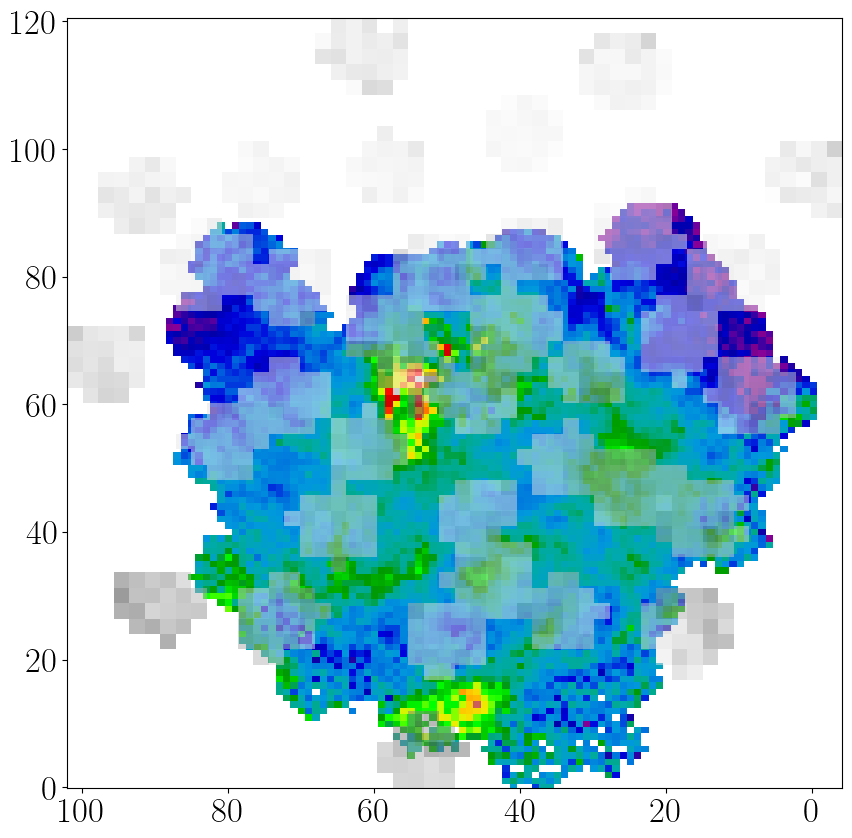

array([-6.13965290e-02,  2.35214670e+00,  4.76568993e+00,  7.17923316e+00,
        9.59277639e+00,  1.20063196e+01,  1.44198629e+01,  1.68334061e+01,
        1.92469493e+01,  2.16604925e+01,  2.40740358e+01,  2.64875790e+01,
        2.89011222e+01,  3.13146655e+01,  3.37282087e+01,  3.61417519e+01,
        3.85552952e+01,  4.09688384e+01,  4.33823816e+01,  4.57959248e+01,
        4.82094681e+01,  5.06230113e+01,  5.30365545e+01,  5.54500978e+01,
        5.78636410e+01,  6.02771842e+01,  6.26907275e+01,  6.51042707e+01,
        6.75178139e+01,  6.99313571e+01,  7.23449004e+01,  7.47584436e+01,
        7.71719868e+01,  7.95855301e+01,  8.19990733e+01,  8.44126165e+01,
        8.68261598e+01,  8.92397030e+01,  9.16532462e+01,  9.40667894e+01,
        9.64803327e+01,  9.88938759e+01,  1.01307419e+02,  1.03720962e+02,
        1.06134506e+02,  1.08548049e+02,  1.10961592e+02,  1.13375135e+02,
        1.15788679e+02,  1.18202222e+02,  1.20615765e+02])

In [17]:
plt.figure(figsize=[10,10])

ret = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][agetab['EXT'][:,1]!=999999.0],
                          w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][agetab['EXT'][:,1]!=999999.0],
                          agetab['EXT'][:,1][agetab['EXT'][:,1]!=999999.0],'median',bins=50)

plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral',vmin=0,vmax=0.75,zorder=0)
# plt.xlabel('Not Really RA')
# plt.ylabel('Dec')
plt.grid()
plt.xlim(np.nanmin(ret.x_edge),np.nanmax(ret.x_edge))
plt.ylim(np.nanmin(ret.y_edge),np.nanmax(ret.y_edge))

im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='binary',vmin=0,vmax=0.75,alpha=0.5)
# plt.colorbar()
# plt.xlabel('RA')
# plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()

plt.show()

ret.x_edge
ret.y_edge

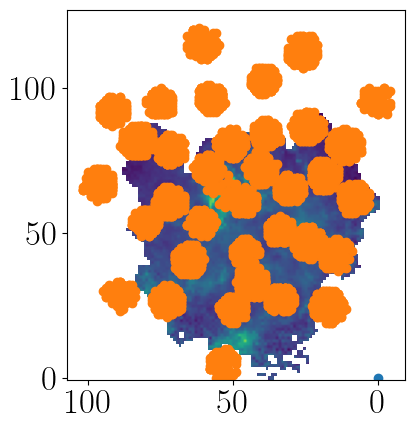

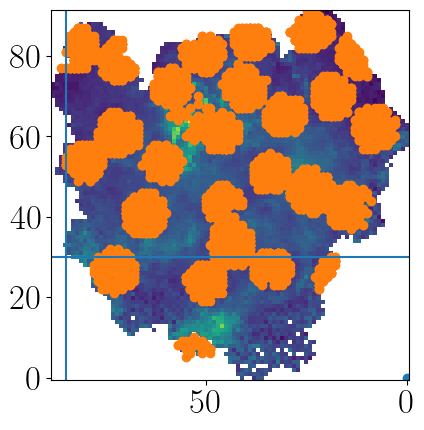

In [401]:
plt.imshow(smash_ag,origin='lower')
plt.gca().invert_xaxis()
plt.scatter(0,0)
plt.scatter(np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]).astype(int),
            np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]).astype(int))

plt.show()

ra_xvals = np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]).astype(int)
dec_yvals = np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]).astype(int)

yumi_val_ext = 999999.0*np.ones(len(lmcdr17))

for i in range(len(lmcdr17)):
    try:
        yumi_val_ext[i] = smash_ag[dec_yvals[i],ra_xvals[i]]
    except:
        yumi_val_ext[i] = np.nan
        
resid_yumi_mine_diff = yumi_val_ext - agetab['EXT'][:,1]

good_resid_ext, = np.where(np.isfinite(resid_yumi_mine_diff)==True)
plt.imshow(smash_ag,origin='lower')
plt.gca().invert_xaxis()
plt.scatter(0,0)
plt.scatter(np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]).astype(int)[good_resid_ext],
            np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]).astype(int)[good_resid_ext])

plt.axhline(30)

plt.axvline(85)
plt.show()

In [372]:
bad_stars, = np.where((w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][good_resid_ext]>85)&
                      (w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][good_resid_ext]<35))

bad_stars

array([3078, 3079, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088,
       3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097])

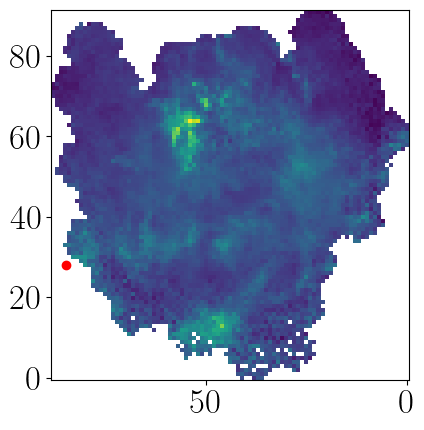

In [375]:
plt.imshow(smash_ag,origin='lower')
plt.gca().invert_xaxis()
# plt.scatter(,)
plt.scatter(np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]).astype(int)[good_resid_ext][3078],
            np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]).astype(int)[good_resid_ext][3078],c='r')

# plt.axhline(30)
# plt.axvline(85)
plt.show()

In [385]:
print(np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]).astype(int)[good_resid_ext][3078])
print(np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]).astype(int)[good_resid_ext][3078])

85
28


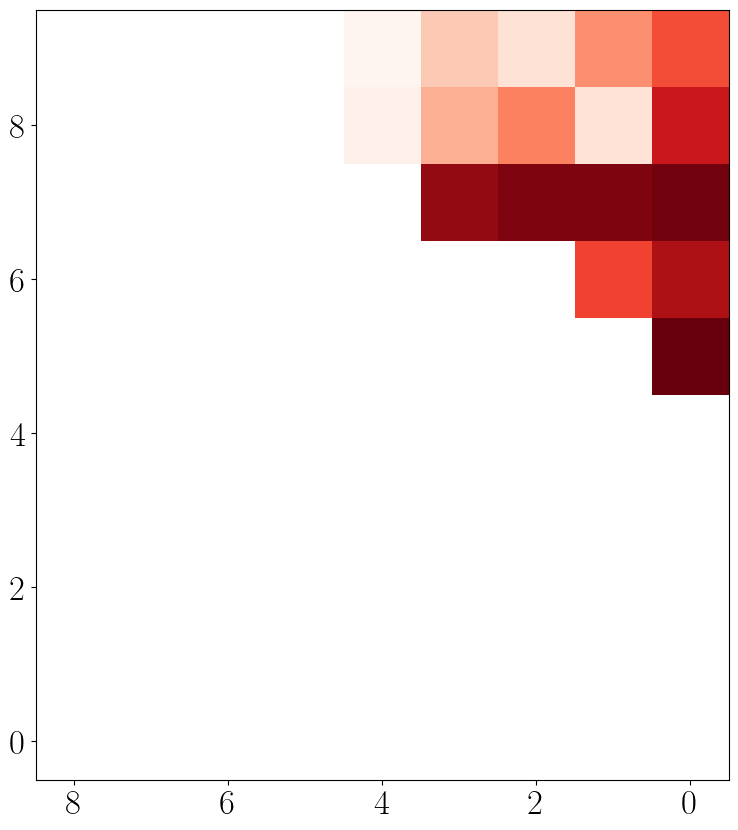

In [400]:
plt.figure(figsize=[10,10])
plt.scatter(85,28)
plt.imshow(smash_ag,origin='lower',cmap='Reds')
# plt.imshow(smash_ag[80:90,23:33],origin='lower',cmap='Reds',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]])
plt.imshow(smash_ag[23:33,80:90],origin='lower',cmap='Reds')
plt.gca().invert_xaxis()
# plt.scatter(0,0)
# plt.scatter(np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]).astype(int)[good_resid_ext],
#             np.round(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]).astype(int)[good_resid_ext])

# plt.axhline(30)

# plt.axvline(85)
plt.show()

In [377]:
10-np.arange(10)

array([10,  9,  8,  7,  6,  5,  4,  3,  2,  1])

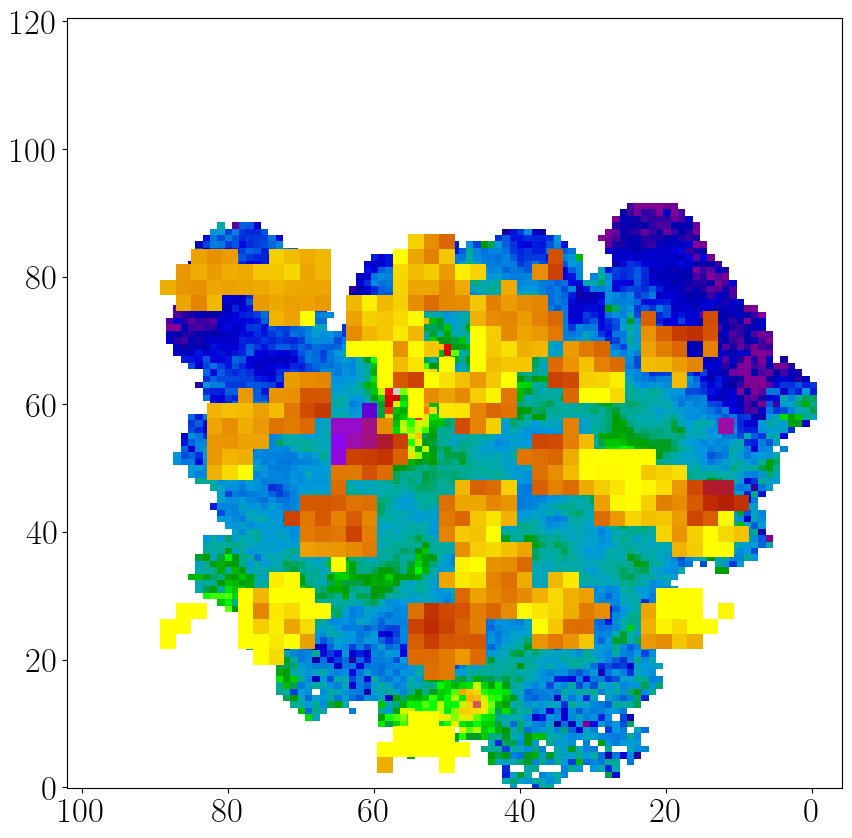

In [34]:
ret2 = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][agetab['EXT'][:,1]!=999999.0],
                          w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][agetab['EXT'][:,1]!=999999.0],
                          (yumi_val_ext-agetab['EXT'][:,1])[agetab['EXT'][:,1]!=999999.0],'median',bins=50)

plt.figure(figsize=[10,10])

# ret = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][agetab['EXT'][:,1]!=999999.0],
                          # w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][agetab['EXT'][:,1]!=999999.0],
                          # agetab['EXT'][:,1][agetab['EXT'][:,1]!=999999.0],'median',bins=50)

plt.imshow(smash_ag, origin='lower', cmap='nipy_spectral',vmin=0,vmax=0.75,zorder=0)
# plt.xlabel('Not Really RA')
# plt.ylabel('Dec')
plt.grid()
plt.xlim(np.nanmin(ret2.x_edge),np.nanmax(ret2.x_edge))
plt.ylim(np.nanmin(ret2.y_edge),np.nanmax(ret2.y_edge))

im = plt.imshow(ret2.statistic.T, origin='lower',
                    extent=[ret2.x_edge[0],ret2.x_edge[-1],ret2.y_edge[0],ret2.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='gnuplot_r',vmin=0,vmax=0.75)
# plt.colorbar()
# plt.xlabel('RA')
# plt.ylabel('Dec')
plt.grid()
plt.gca().invert_xaxis()

plt.show()

In [35]:
good_resid_ext

array([   0,    1,    2, ..., 6127, 6128, 6129])

In [36]:
np.array([np.round(ret.x_edge[:-1]+np.median(np.diff(ret.x_edge)/2)).astype(int),
          np.round(ret.y_edge[:-1]+np.median(np.diff(ret.y_edge)/2)).astype(int)]).T

array([[ -3,   1],
       [ -1,   4],
       [  1,   6],
       [  3,   8],
       [  5,  11],
       [  8,  13],
       [ 10,  16],
       [ 12,  18],
       [ 14,  20],
       [ 16,  23],
       [ 18,  25],
       [ 20,  28],
       [ 22,  30],
       [ 25,  33],
       [ 27,  35],
       [ 29,  37],
       [ 31,  40],
       [ 33,  42],
       [ 35,  45],
       [ 37,  47],
       [ 39,  49],
       [ 41,  52],
       [ 44,  54],
       [ 46,  57],
       [ 48,  59],
       [ 50,  61],
       [ 52,  64],
       [ 54,  66],
       [ 56,  69],
       [ 58,  71],
       [ 61,  74],
       [ 63,  76],
       [ 65,  78],
       [ 67,  81],
       [ 69,  83],
       [ 71,  86],
       [ 73,  88],
       [ 75,  90],
       [ 78,  93],
       [ 80,  95],
       [ 82,  98],
       [ 84, 100],
       [ 86, 103],
       [ 88, 105],
       [ 90, 107],
       [ 92, 110],
       [ 95, 112],
       [ 97, 115],
       [ 99, 117],
       [101, 119]])

In [37]:
# RectBivariateSpline(x,y,smash_ag)([2.2,3.2,3.8],[2.4,3.3,4.3],grid=False)

In [38]:
# scipy.interpolate.RectBivariateSpline(x, y, smash_ag, bbox=[None, None, None, None], kx=3, ky=3, s=0)[source]

In [39]:
ret.x_edge+np.median(np.diff(ret.x_edge)/2)

array([ -3.06994129,  -0.94791116,   1.17411897,   3.29614909,
         5.41817922,   7.54020935,   9.66223947,  11.7842696 ,
        13.90629973,  16.02832985,  18.15035998,  20.27239011,
        22.39442023,  24.51645036,  26.63848049,  28.76051061,
        30.88254074,  33.00457087,  35.126601  ,  37.24863112,
        39.37066125,  41.49269138,  43.6147215 ,  45.73675163,
        47.85878176,  49.98081188,  52.10284201,  54.22487214,
        56.34690226,  58.46893239,  60.59096252,  62.71299265,
        64.83502277,  66.9570529 ,  69.07908303,  71.20111315,
        73.32314328,  75.44517341,  77.56720353,  79.68923366,
        81.81126379,  83.93329391,  86.05532404,  88.17735417,
        90.29938429,  92.42141442,  94.54344455,  96.66547468,
        98.7875048 , 100.90953493, 103.03156506])

In [40]:
ret.y_edge+np.median(np.diff(ret.y_edge)/2)

array([  1.14537509,   3.55891832,   5.97246155,   8.38600478,
        10.79954801,  13.21309124,  15.62663447,  18.0401777 ,
        20.45372093,  22.86726416,  25.28080739,  27.69435062,
        30.10789385,  32.52143708,  34.93498031,  37.34852354,
        39.76206677,  42.17561   ,  44.58915323,  47.00269646,
        49.41623969,  51.82978292,  54.24332615,  56.65686938,
        59.07041261,  61.48395584,  63.89749907,  66.3110423 ,
        68.72458553,  71.13812876,  73.55167199,  75.96521522,
        78.37875845,  80.79230168,  83.20584491,  85.61938814,
        88.03293137,  90.4464746 ,  92.86001783,  95.27356106,
        97.68710429, 100.10064752, 102.51419075, 104.92773398,
       107.34127721, 109.75482044, 112.16836367, 114.5819069 ,
       116.99545013, 119.40899337, 121.8225366 ])

In [278]:
knee_line(np.linspace(-2.0,-0.25))

array([0.2       , 0.2       , 0.2       , 0.2       , 0.2       ,
       0.2       , 0.2       , 0.2       , 0.2       , 0.2       ,
       0.2       , 0.2       , 0.2       , 0.2       , 0.2       ,
       0.2       , 0.2       , 0.2       , 0.2       , 0.2       ,
       0.2       , 0.2       , 0.2       , 0.2       , 1.77135714,
       1.74516786, 1.71897857, 1.69278929, 1.6666    , 1.64041071,
       1.61422143, 1.58803214, 1.56184286, 1.53565357, 1.50946429,
       1.483275  , 1.45708571, 1.43089643, 1.40470714, 1.37851786,
       1.35232857, 1.32613929, 1.29995   , 1.27376071, 1.24757143,
       1.22138214, 1.19519286, 1.16900357, 1.14281429, 1.116625  ])

In [323]:
-0.7333*(-0.25)-0.5333

-0.34997500000000004

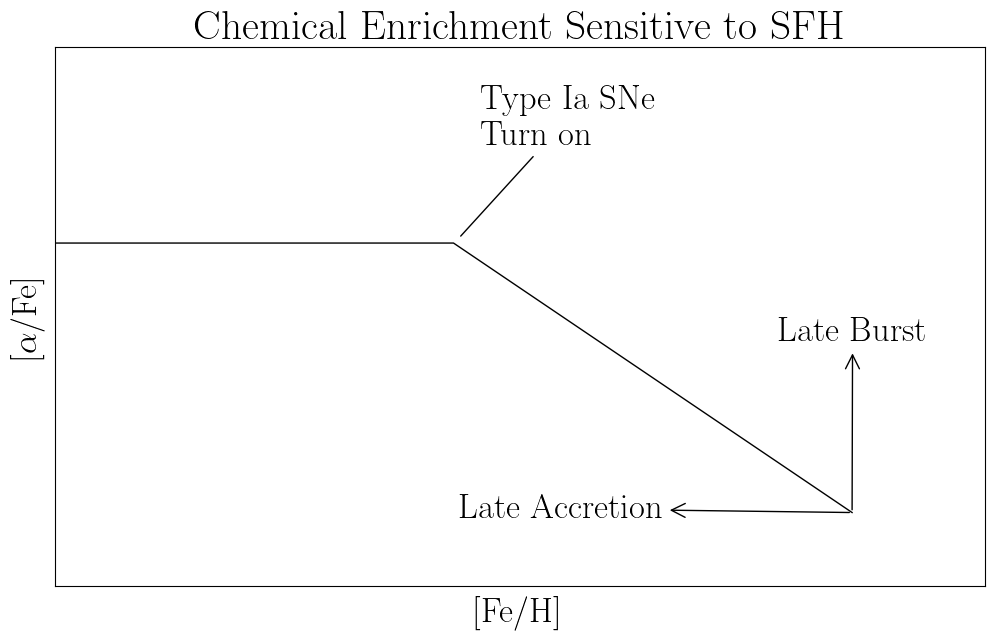

In [362]:
# Matplotlib
import matplotlib
import matplotlib.pyplot as plt
# %matplotlib inline
matplotlib.rcParams.update({'font.size': 25,'axes.facecolor':'w'})
from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=True)

#Numpy/Scipy
import numpy as np

def knee_line(x):
    out = np.ones(len(x))
    for i in range(len(x)):
        if x[i] < -1.0:
            out[i] = 0.2
        else:
            out[i] = -0.7333*x[i]-0.5333
    
    return out

plt.figure(figsize=[12,7])
plt.plot(np.linspace(-2.0,-0.25),knee_line(np.linspace(-2.0,-0.25)),c='k',lw=1.0)

plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[$\alpha$/Fe]')
plt.ylim(-0.5,0.6)
plt.xlim(-1.75,0.0)
plt.xticks([])
plt.yticks([])

plt.annotate("Type Ia SNe \n Turn on",xy=(-1.0+0.01, 0.2+0.01),
             xytext=(-0.95, 0.4),arrowprops=dict(arrowstyle="-"))

plt.annotate("Late Burst",xy=(-0.25,-0.34997), 
             xytext=(-0.39,0.0),arrowprops=dict(arrowstyle="<-"))

plt.annotate("Late Accretion",xy=(-0.25,-0.34997), 
             xytext=(-0.99,-0.36),arrowprops=dict(arrowstyle="<-"))

plt.title(r'Chemical Enrichment Sensitive to SFH')

plt.savefig('/Users/joshuapovick/Desktop/ChemEnrichSchematic/chem_enrich_schematic.png',bbox_inches='tight')

plt.show()

In [272]:
0.2-1*(-0.35-0.2)/(-0.25+1.0)

0.9333333333333333

In [41]:
len(ret.x_edge)

51

In [42]:
centers = np.array([np.round(ret.x_edge[:-1]+np.median(np.diff(ret.x_edge)/2)).astype(int),np.round(ret.y_edge[:-1]+np.median(np.diff(ret.y_edge)/2)).astype(int)]).T

yumi_near_val2 = 999999.0*np.ones(len(centers))

stat_val = 999999.0*np.ones(len(centers))

for i in tqdm(range(len(centers))):
    
    stat_val[i] = ret.statistic[centers[i,0],centers[i,1]] 
    
    # if (pix_coord_apogee[i,0]<np.shape(smash_ag)[0]-1) & (pix_coord_apogee[i,0]<np.shape(smash_ag)[1]-1):
    try:
        yumi_near_val2[i] = smash_ag[centers[i,0],centers[i,1]] 
        
    except:
        yumi_near_val2[i] = np.nan

# yumi_mine_diff = yumi_near_val2 - agetab['EXT'][:,1]

  0%|          | 0/50 [00:00<?, ?it/s]

IndexError: index 52 is out of bounds for axis 1 with size 50

(array([12.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 29.]),
 array([1.66805958e-01, 1.00000050e+05, 1.99999933e+05, 2.99999817e+05,
        3.99999700e+05, 4.99999583e+05, 5.99999467e+05, 6.99999350e+05,
        7.99999233e+05, 8.99999117e+05, 9.99999000e+05]),
 <BarContainer object of 10 artists>)

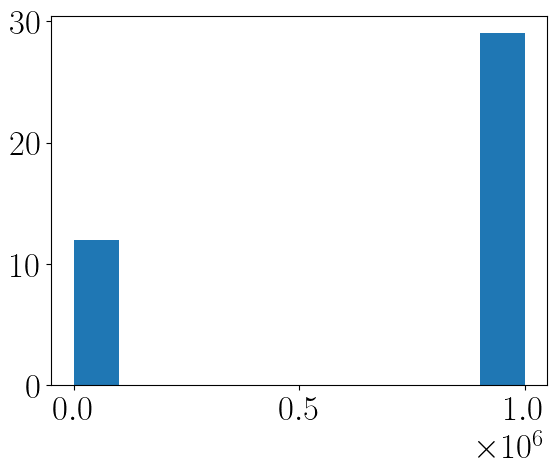

In [43]:
plt.hist(yumi_near_val2)

In [44]:
# np.where(np.isfinite(yumi_near_val2)==False)

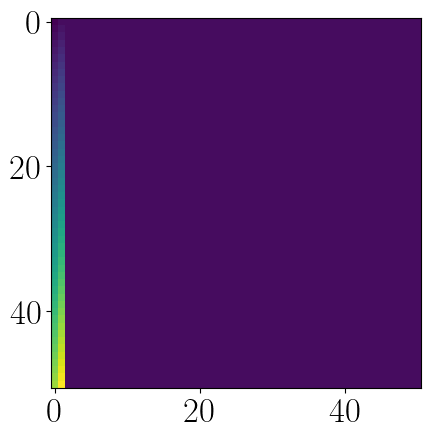

In [45]:
cen_bin_x = ret.x_edge+np.median(np.diff(ret.x_edge)/2)
cen_bin_y = ret.y_edge+np.median(np.diff(ret.y_edge)/2)

bin_centers = np.ones((len(ret.x_edge),len(ret.y_edge)))

bin_centers[:,0] = cen_bin_x
bin_centers[:,1] = cen_bin_y

plt.imshow(bin_centers)

In [46]:
imras = w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]
imdecs = w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]

In [47]:
X, Y = np.meshgrid(np.arange(0, 50, 1), np.arange(0, 50, 1))

X

array([[ 0,  1,  2, ..., 47, 48, 49],
       [ 0,  1,  2, ..., 47, 48, 49],
       [ 0,  1,  2, ..., 47, 48, 49],
       ...,
       [ 0,  1,  2, ..., 47, 48, 49],
       [ 0,  1,  2, ..., 47, 48, 49],
       [ 0,  1,  2, ..., 47, 48, 49]])

In [48]:
import cv2

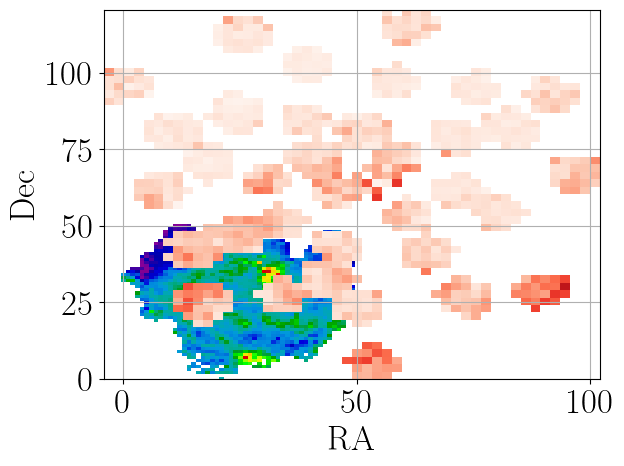

In [49]:
img = cv2.resize(smash_ag, (len(ret.x_edge), len(ret.y_edge)))
plt.imshow(img, origin='lower', cmap='nipy_spectral',vmin=0,vmax=0.75,zorder=0)
plt.xlabel('RA')
plt.ylabel('Dec')
plt.grid()

plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='Reds',vmin=0,vmax=0.75)

# plt.xlim(np.nanmin(ret.x_edge),np.nanmax(ret.x_edge))
# plt.ylim(np.nanmin(ret.y_edge),np.nanmax(ret.y_edge))

In [50]:
ret_diff = binned_statistic_2d(w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0][agetab['EXT'][:,1]!=999999.0],
                               w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1][agetab['EXT'][:,1]!=999999.0],
                               agetab['EXT'][:,1][agetab['EXT'][:,1]!=999999.0],'median',bins=50)

In [51]:
np.shape(smash_ag)

(92, 89)

In [52]:
np.where((pix_coord_apogee[0]<=92)&(pix_coord_apogee[1]<=89))

(array([0, 1]),)

In [53]:
# from scipy.interpolate import interp2d, BivariateSpline
# f = interp2d(range(89),range(92), smash_ag, kind='cubic')

from scipy.interpolate import griddata

xx,yy = np.meshgrid()

grid_z0 = griddata(points, values, (grid_x, grid_y), method='nearest')


ValueError: not enough values to unpack (expected 2, got 0)

In [54]:
import numpy as np

x = [0, 0, 1, 1, 2, 2]
y = [1, 2, 0, 1, 1, 2]
z = [14, 17, 15, 16, 18, 13]

z_array = np.nan * np.empty((3,3))
z_array[y, x] = z

print(z_array)

[[nan 15. nan]
 [14. 16. 18.]
 [17. nan 13.]]


In [55]:
ra_arr = w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[0]
dec_arr = w.wcs_world2pix(lmcdr17['RA'],lmcdr17['DEC'],0)[1]

# red_arr = np.nan * np.empty((len(ra_arr),len(dec_arr)))
# red_arr[ra_arr,dec_arr] = agetab['EXT'][:,1]

In [56]:
w.wcs_pix2world(lmcdr17['RA'],lmcdr17['DEC'],0)

[array([185.44463866, 186.01667787, 185.67370887, ..., 212.06805615,
        212.23504378, 211.4326639 ]),
 array([-85.25910143, -85.23814967, -85.23691404, ..., -87.01345292,
        -86.99722564, -87.01668045])]

In [57]:
# w.wcs_pix2world(smash_ag,0)

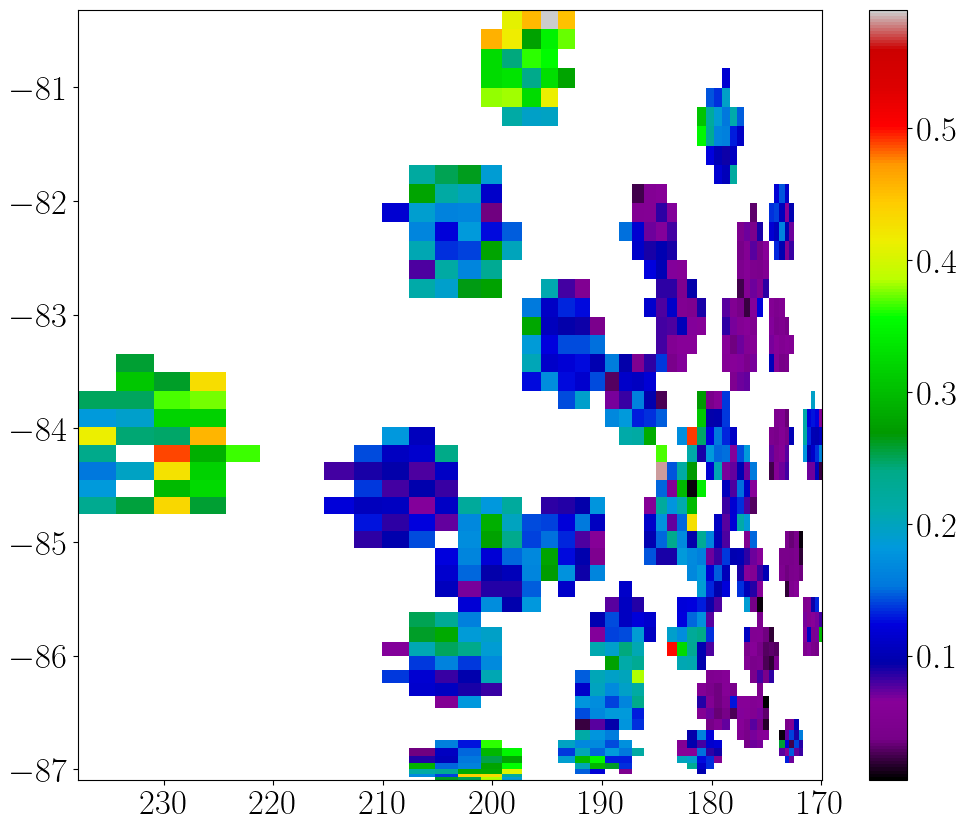

In [58]:
good_ext, = np.where(agetab['EXT'][:,1]!=999999.0) 

# zi, yi, xi = np.histogram2d(lmcdr17['DEC'][good_ext], lmcdr17['RA'][good_ext], bins=(50,50), weights=agetab['EXT'][:,1][good_ext], normed=False)
# zi = np.ma.masked_equal(zi, 0)

zi, xi, yi, _ = binned_statistic_2d(lmcdr17['RA'][good_ext],lmcdr17['DEC'][good_ext],agetab['EXT'][:,1][good_ext],statistic='median',bins=50)
zi = np.ma.masked_equal(zi, 0)

fig, ax = plt.subplots(figsize=[12,10])
pl = ax.pcolormesh(w.wcs_pix2world(xi,yi,0)[0], w.wcs_pix2world(xi,yi,0)[1], zi, cmap='nipy_spectral')#, edgecolors='black')
# scat = ax.scatter(lmcdr17['RA'][good_ext], lmcdr17['DEC'][good_ext], c=agetab['EXT'][:,1][good_ext], s=10, vmax=0.6, cmap='nipy_spectral')
fig.colorbar(pl)
ax.margins(0.05)
ax.invert_xaxis()
plt.show()

In [59]:
xi

array([ 57.139737  ,  58.19963376,  59.25953052,  60.31942728,
        61.37932404,  62.4392208 ,  63.49911756,  64.55901432,
        65.61891108,  66.67880784,  67.7387046 ,  68.79860136,
        69.85849812,  70.91839488,  71.97829164,  73.0381884 ,
        74.09808516,  75.15798192,  76.21787868,  77.27777544,
        78.3376722 ,  79.39756896,  80.45746572,  81.51736248,
        82.57725924,  83.637156  ,  84.69705276,  85.75694952,
        86.81684628,  87.87674304,  88.9366398 ,  89.99653656,
        91.05643332,  92.11633008,  93.17622684,  94.2361236 ,
        95.29602036,  96.35591712,  97.41581388,  98.47571064,
        99.5356074 , 100.59550416, 101.65540092, 102.71529768,
       103.77519444, 104.8350912 , 105.89498796, 106.95488472,
       108.01478148, 109.07467824, 110.134575  ])

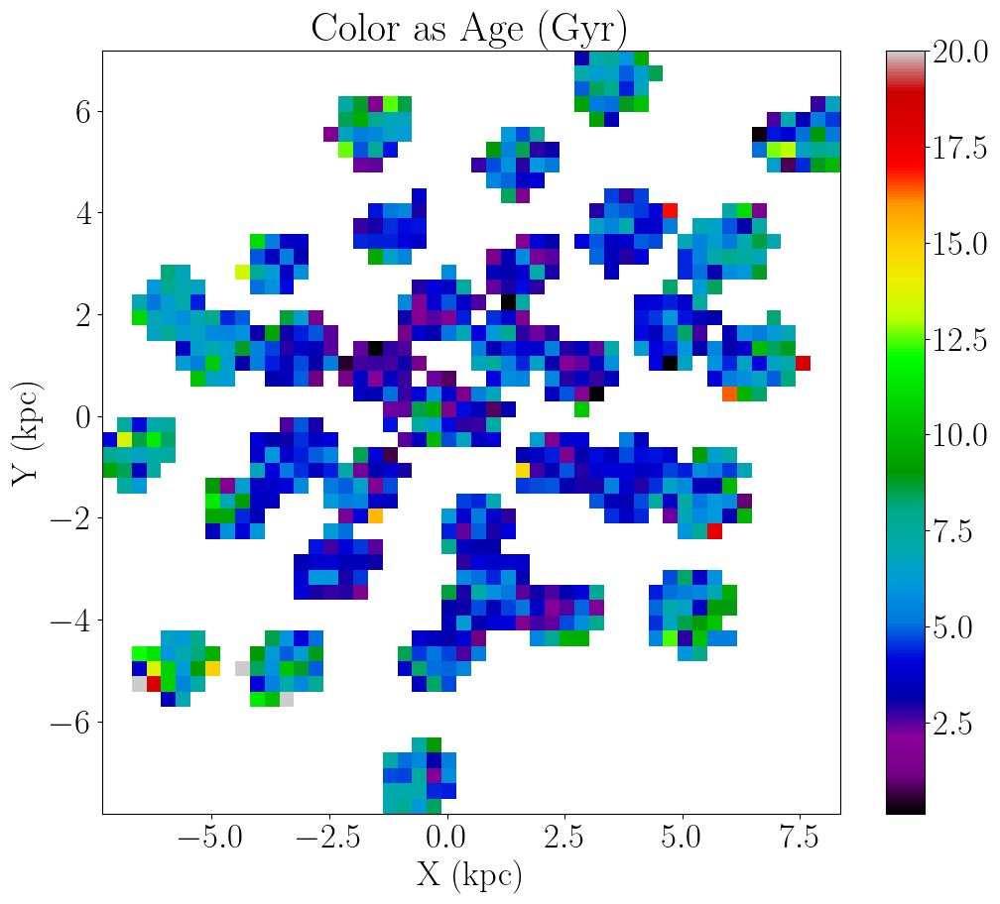

In [60]:
plt.figure(figsize=[12,10])
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=20)
plt.colorbar()

plt.title(r'Color as Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
plt.savefig('../plots/lmc_map_age.png',bbox_inches='tight')
plt.show()

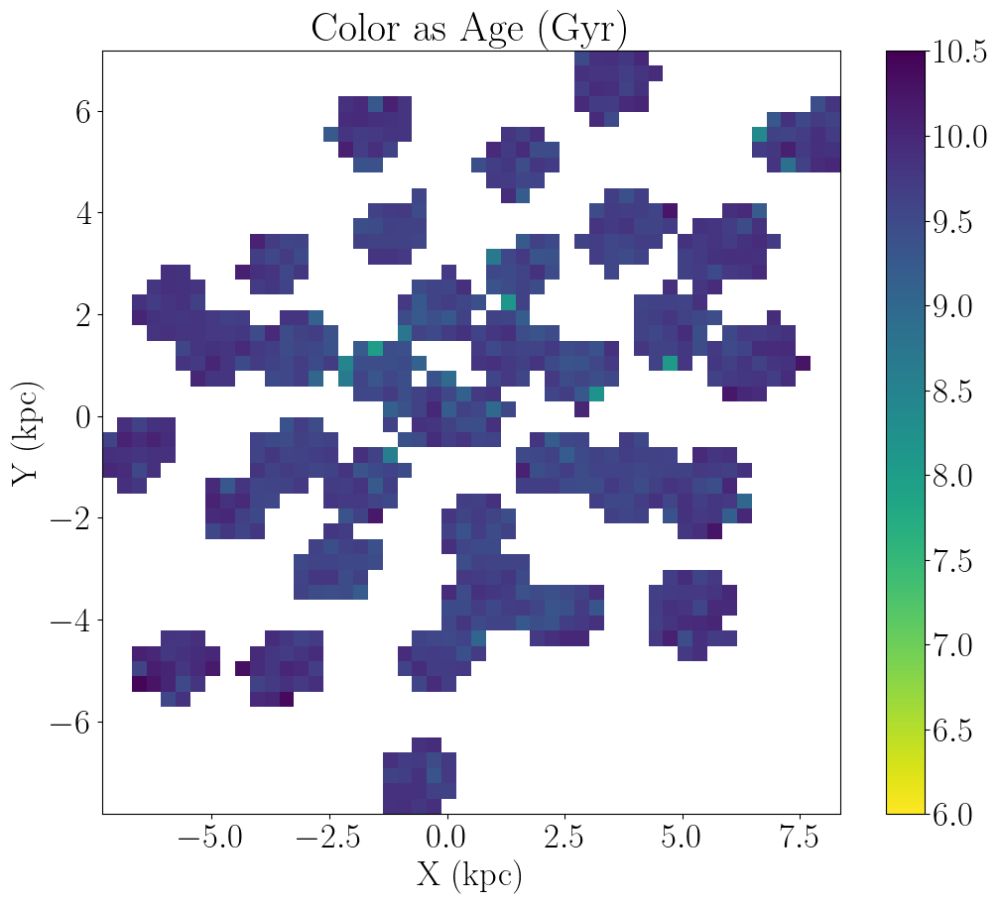

In [492]:
plt.figure(figsize=[12,10])
ret = binned_statistic_2d(lmcx,lmcy,np.log10(agetab['AGE']*10**9),'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='viridis_r',vmin=6,vmax=10.5)
plt.colorbar()

plt.title(r'Color as Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('../plots/lmc_map_age.png',bbox_inches='tight')
plt.show()

In [61]:
med_fld_age = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))
mad_fld_age = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))

fld_centers = 999999.0*np.ones((len(np.unique(lmcdr17['FIELD'])),2))

fld_radius = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))

fld_feh = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))
fld_feh_mad = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))

fld_pa = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))

for i in range(len(np.unique(lmcdr17['FIELD']))):
    fld, = np.where(lmcdr17['FIELD']==np.unique(lmcdr17['FIELD'])[i])
    
    med_fld_age[i] = np.nanmedian(agetab['AGE'][fld])
    mad_fld_age[i] = mad(agetab['AGE'][fld])
    
    medx = np.nanmedian(lmcx[fld])
    medy = np.nanmedian(lmcy[fld])
    
    fld_centers[i,0] = medx
    fld_centers[i,1] = medy
    
    fld_radius[i] = np.nanmedian(lmcr[fld])
    
    fld_feh[i] = np.nanmedian(lmcdr17['FE_H'][fld]) 
    fld_feh_mad[i] = mad(lmcdr17['FE_H'][fld]) 
    fld_pa[i] = np.nanmedian(lmcdr17['LMCPA'][fld]) 

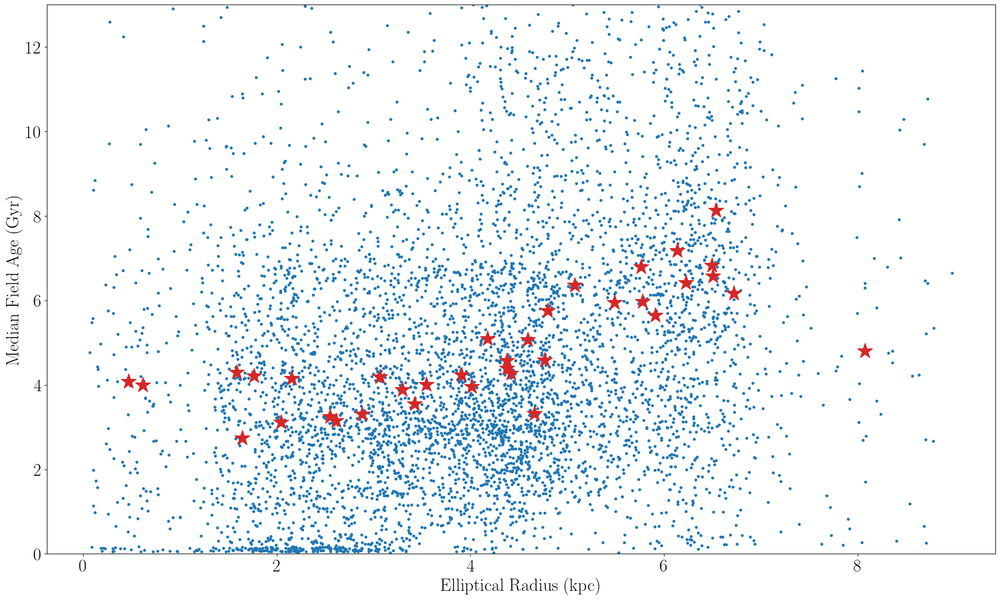

In [62]:
plt.figure(figsize=[24,14])
plt.scatter(lmcr,agetab['AGE'],c='tab:blue',s=10)
plt.scatter(fld_radius,med_fld_age,c='tab:red',marker='*',s=500)
# plt.plot(center_rad_bins,bin_stats,c='k',lw=3)
plt.ylim(0,13)
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Median Field Age (Gyr)')
# plt.savefig('lmc_fld_age_radius.png',bbox_inches='tight')
plt.show()

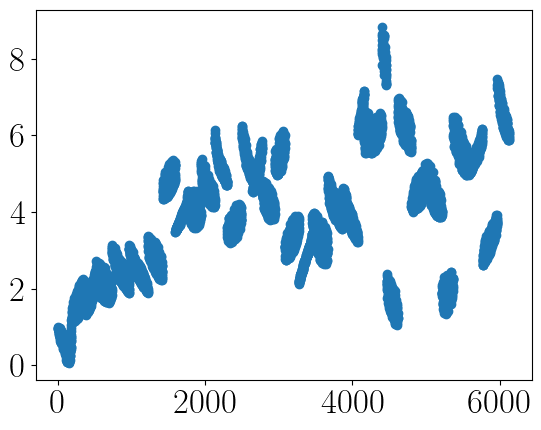

In [63]:
plt.scatter(range(len(lmcsr)),lmcsr)

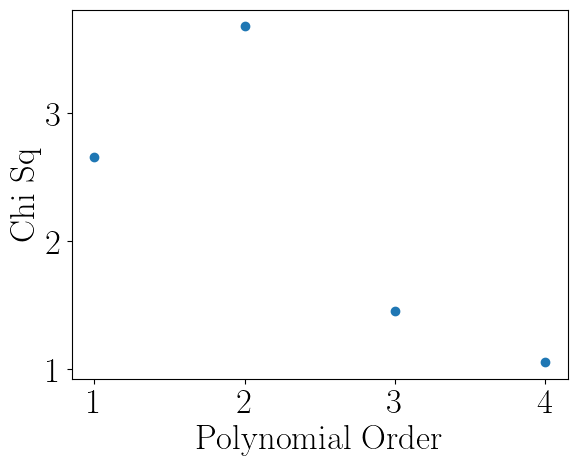

In [64]:
chi_sq = []

sidx = np.argsort(fld_radius)
for i in range(5)[1:]:
    
    p = np.poly1d(robust.polyfit(fld_radius[sidx],med_fld_age[sidx],i))
    
    chi_sq.append(sum(np.square(np.divide(med_fld_age[sidx]-p(fld_radius[sidx]),mad_fld_age[sidx])))) #/(len(fld_radius[:-1]-(i+1))))
    
chi_sq = np.array(chi_sq)
    
plt.scatter(np.arange(len(chi_sq))+1,chi_sq)
plt.xlabel(r'Polynomial Order')
plt.ylabel(r'Chi Sq')
# plt.savefig(r'chisq_age_radius_polyfit.png',bbox_inches='tight')
plt.show()

         4          3         2
-0.0221 x + 0.2865 x - 1.009 x + 0.9739 x + 3.778


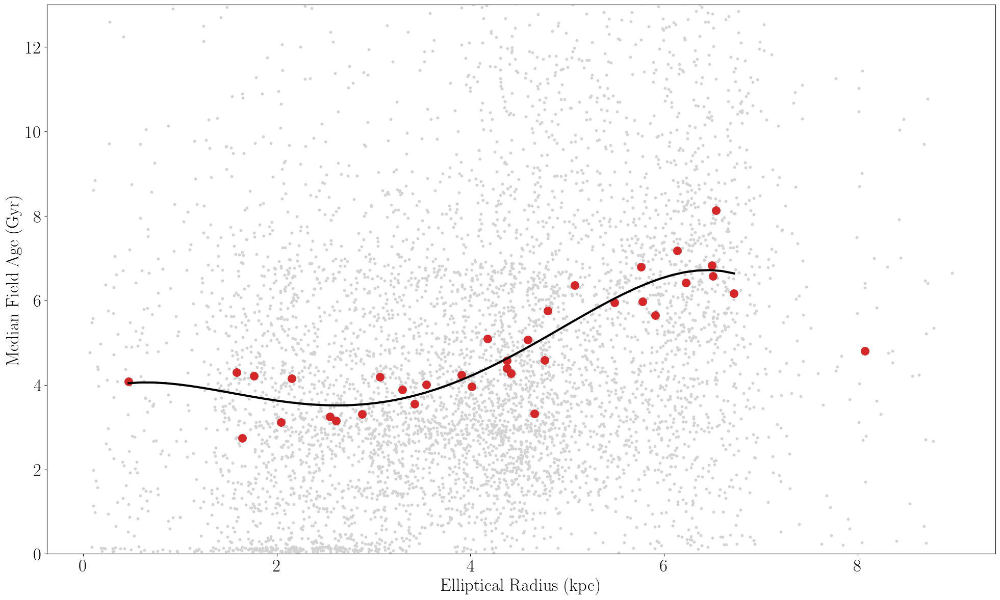

In [65]:
p_raw = np.poly1d(robust.polyfit(fld_radius[fld_radius<8],med_fld_age[fld_radius<8],4))
print(p_raw)

plt.figure(figsize=[24,14])
plt.scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
plt.scatter(fld_radius[:-1],med_fld_age[:-1],c='tab:red',marker='.',s=500)
xs_rads = np.linspace(min(fld_radius[np.argsort(fld_radius)][:-1]),max(fld_radius[np.argsort(fld_radius)][:-1]))
plt.plot(xs_rads,p_raw(xs_rads),c='k',lw=3)
plt.ylim(0,13)
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Median Field Age (Gyr)')
# plt.savefig('lmc_fld_age_radius_w_poly.png',bbox_inches='tight')
plt.show()

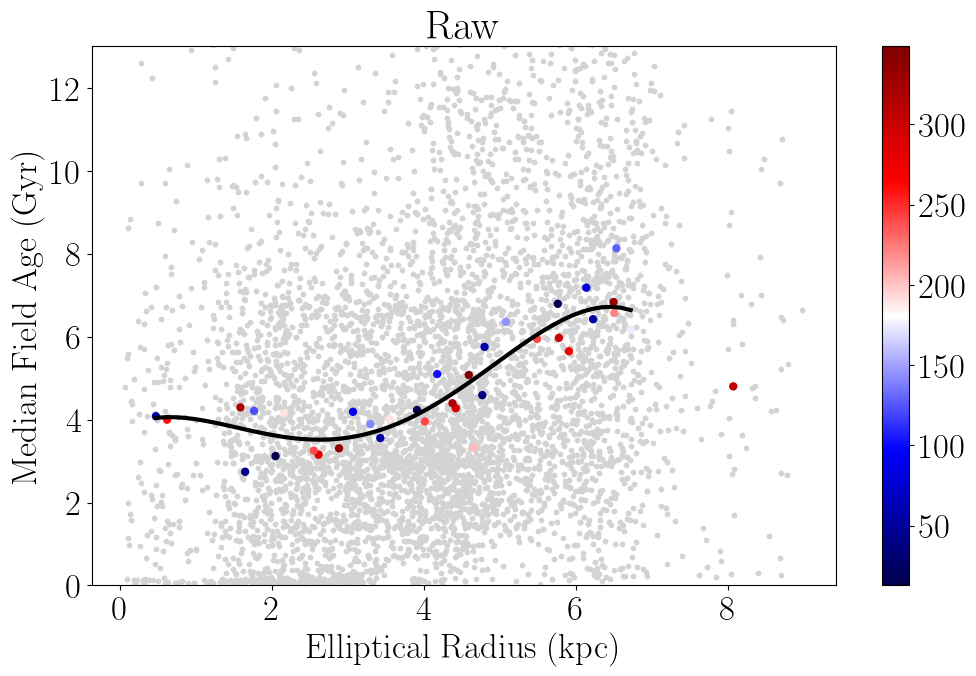

In [66]:
plt.figure(figsize=[12,7])
plt.scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
plt.scatter(fld_radius,med_fld_age,c=fld_pa,marker='.',s=100,cmap='seismic')
# plt.scatter(fld_radius[south_fld],med_fld_age[south_fld],c=fld_pa[south_fld],marker='v',s=100,cmap='twilight_shifted',label='South')
plt.colorbar()
# plt.legend()
xs_rads = np.linspace(min(fld_radius[np.argsort(fld_radius)][:-1]),max(fld_radius[np.argsort(fld_radius)][:-1]))
plt.plot(xs_rads,p_raw(xs_rads),c='k',lw=3)
plt.ylim(0,13)
plt.title(r'Raw')
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Median Field Age (Gyr)')
# plt.savefig('lmc_fld_age_radius_w_poly.png',bbox_inches='tight')
plt.show()

# subract poly from points and plot on sky or you could plot res vs pa color coded by radius

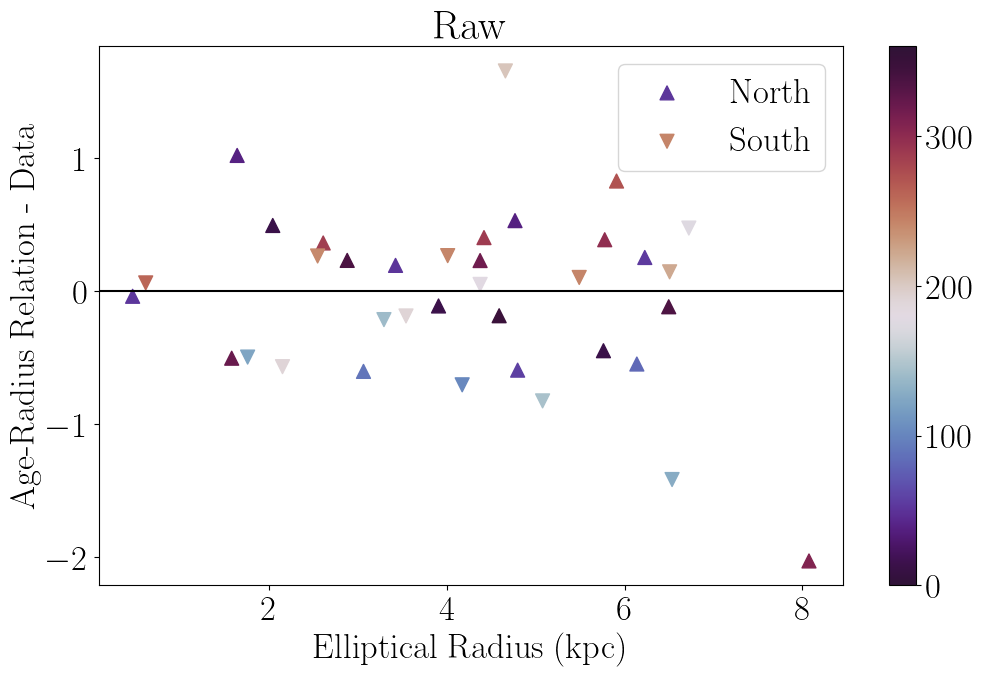

In [67]:
north_fld, = np.where((fld_pa<=90.)|(fld_pa>=270.))
south_fld, = np.where((fld_pa>90.)&(fld_pa<270.))

raw_res_fld_age = p_raw(fld_radius)-med_fld_age

plt.figure(figsize=[12,7])
plt.scatter(fld_radius[north_fld],raw_res_fld_age[north_fld],c=fld_pa[north_fld],marker='^',s=100,cmap='twilight_shifted',vmin=0,vmax=360,label='North')
plt.scatter(fld_radius[south_fld],raw_res_fld_age[south_fld],c=fld_pa[south_fld],marker='v',s=100,cmap='twilight_shifted',vmin=0,vmax=360,label='South')
plt.colorbar()
plt.legend()
plt.axhline(0.0,c='k')

plt.title(r'Raw')
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Age-Radius Relation - Data')
plt.show()

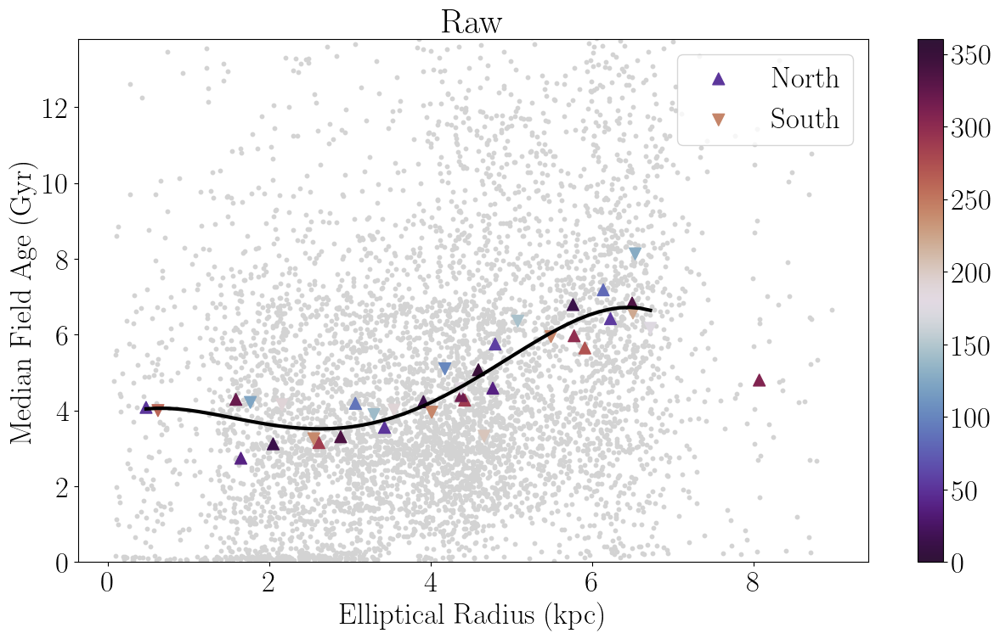

In [68]:
plt.figure(figsize=[15,8])
plt.scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
plt.scatter(fld_radius[north_fld],med_fld_age[north_fld],marker='^',c=fld_pa[north_fld],s=100,label='North',cmap='twilight_shifted',vmin=0,vmax=360)
plt.scatter(fld_radius[south_fld],med_fld_age[south_fld],marker='v',c=fld_pa[south_fld],s=100,label='South',cmap='twilight_shifted',vmin=0,vmax=360)
plt.colorbar()
plt.legend()
xs_rads = np.linspace(min(fld_radius[np.argsort(fld_radius)][:-1]),max(fld_radius[np.argsort(fld_radius)][:-1]))
plt.plot(xs_rads,p_raw(xs_rads),c='k',lw=3)
plt.ylim(0,13.787)
plt.title(r'Raw')
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Median Field Age (Gyr)')
# plt.savefig('lmc_fld_age_radius_w_poly.png',bbox_inches='tight')
plt.show()

0.29801465472178545


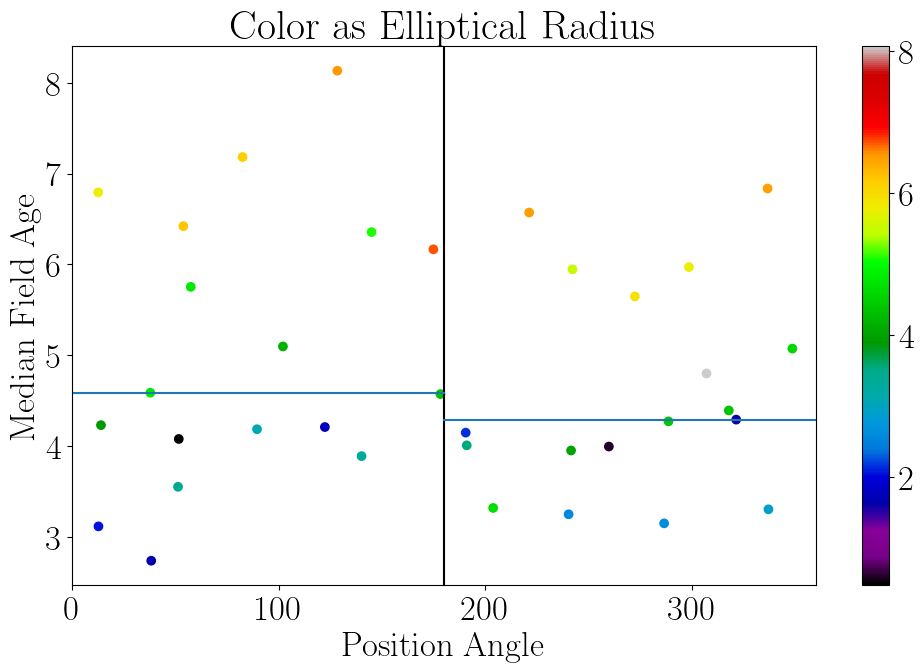

In [69]:
print(np.median(med_fld_age[fld_pa<180])-np.median(med_fld_age[fld_pa>180]))
plt.figure(figsize=[12,7])
plt.scatter(fld_pa,med_fld_age,c=fld_radius,cmap='nipy_spectral')
plt.colorbar()
plt.axvline(180,c='k')

plt.plot([0,180],[np.median(med_fld_age[fld_pa<180]),np.median(med_fld_age[fld_pa<180])],c='tab:blue')
plt.plot([180,360],[np.median(med_fld_age[fld_pa>180]),np.median(med_fld_age[fld_pa>180])],c='tab:blue')

plt.xlim(0,360)
plt.title(r'Color as Elliptical Radius')
plt.xlabel(r'Position Angle')
plt.ylabel(r'Median Field Age')
plt.show()

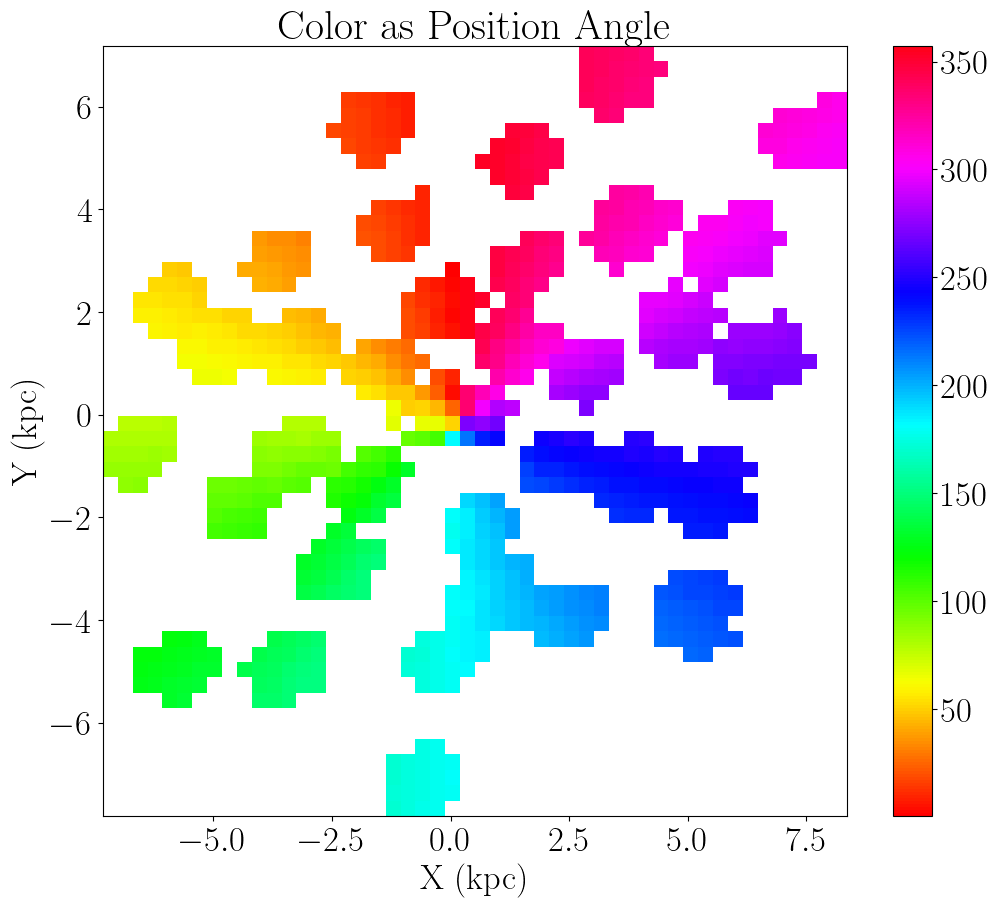

In [70]:
lmc_pa2 = 999999.0*np.ones(len(lmcdr17))

for i in range(len(lmcdr17)):
    rot_pa = lmcdr17['LMCPA'][i]+90.
    
    if rot_pa>360:
        lmc_pa2[i] = rot_pa-360
    else:
        lmc_pa2[i] = rot_pa

plt.figure(figsize=[12,10])
ret = binned_statistic_2d(lmcx,lmcy,lmcdr17['LMCPA'],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='hsv')
plt.colorbar()

plt.title(r'Color as Position Angle')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')
plt.show()

In [71]:
# p2.deriv().roots

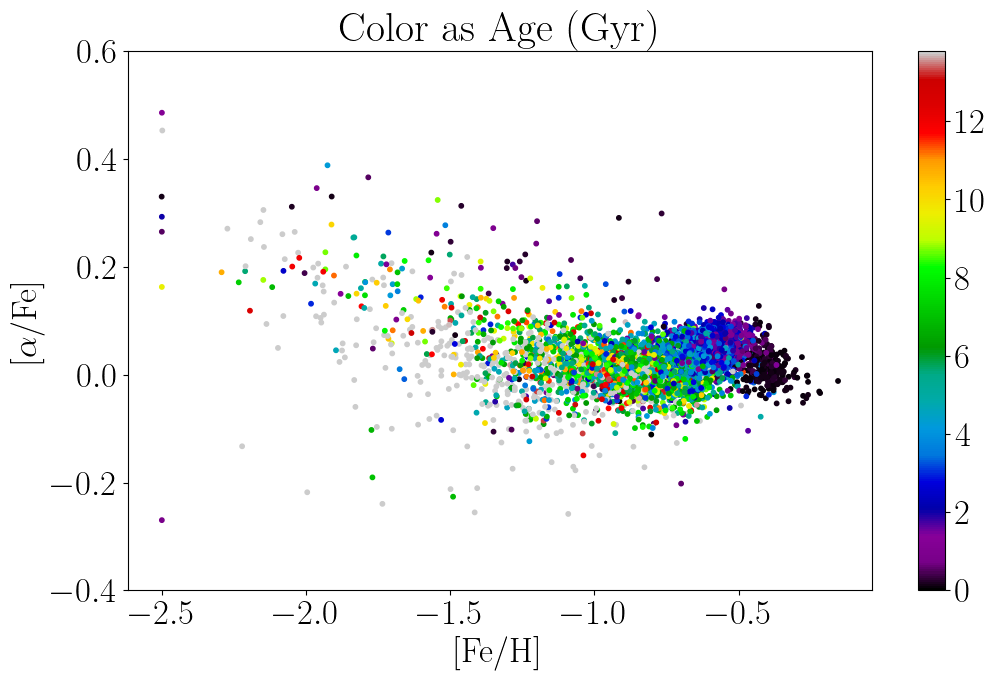

In [72]:
snrcut, = np.where(lmcdr17['SNR']>=40) 
plt.figure(figsize=[12,7])
plt.scatter(lmcdr17['FE_H'][snrcut],apoafe[snrcut],c=agetab['AGE'][snrcut],vmin=0.0,vmax=13.787,cmap='nipy_spectral',s=10)
plt.colorbar()
plt.ylim(-0.4,0.6)
plt.title(r'Color as Age (Gyr)')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[$\alpha$/Fe]')
plt.savefig('lmc_alphafe_feh_age.png',bbox_inches='tight')
plt.show()

Median Field Age Map

In [73]:
fld_number_stars

NameError: name 'fld_number_stars' is not defined

In [74]:
np.size(np.squeeze(np.where(lmcdr17['TARGET_NAME'][clus]=='BrtRGB')))

NameError: name 'clus' is not defined

In [75]:
from astropy import units as u
from astropy.coordinates import SkyCoord

cen_xy = 999999.0*np.ones((len(np.unique(lmcdr17['FIELD'])),2))
fld_number_stars = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))

cen_ra = np.empty(len(np.unique(lmcdr17['FIELD']))).astype(str)
cen_dec = np.empty(len(np.unique(lmcdr17['FIELD']))).astype(str)
cen_rpa = 999999.0*np.ones((len(np.unique(lmcdr17['FIELD'])),2))

brt_type = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))
fnt_type = 999999.0*np.ones(len(np.unique(lmcdr17['FIELD'])))

for i in range(len(np.unique(lmcdr17['FIELD']))):
    clus, = np.where(lmcdr17['FIELD']==np.unique(lmcdr17['FIELD'])[i])
    
    radec = SkyCoord(np.nanmedian(lmcdr17['RA'][clus])*u.deg,np.nanmedian(lmcdr17['DEC'][clus])*u.deg,frame='icrs')
    
    listra = list(radec.ra.hms)
    listdec = list(radec.dec.dms)
    
    # print(listdec)
    
    if int(listra[0]) <=10:
        ra_str = '0{}:'.format(int(listra[0]))+'{}:'.format(int(listra[1]))+'{:.1f}'.format(listra[2])
    else:
        ra_str = '{}:'.format(int(listra[0]))+'{}:'.format(int(listra[1]))+'{:.1f}'.format(listra[2])
    dec_str = '{}:'.format(int(listdec[0]))+'{}:'.format(int(np.abs(listdec[1])))+'{:.1f}'.format(np.abs(listdec[2]))
    
    # print(radec.dec)
    print(ra_str)
    print(dec_str)

    # print(type(radec.ra))
    
    cen_ra[i] = ra_str
    cen_dec[i] = dec_str
    
    cen_xy[i,0] = np.nanmedian(lmcx[clus])
    cen_xy[i,1] = np.nanmedian(lmcy[clus])
    fld_number_stars[i] = int(len(clus))
    
    cen_rpa[i,0] = np.round(np.nanmedian(lmcdr17['LMCRAD'][clus]),1)
    cen_rpa[i,1] = int(np.round(np.nanmedian(lmcdr17['LMCPA'][clus])))
    
    brt_type[i] = np.size(np.squeeze(np.where(lmcdr17['TARGET_NAME'][clus]=='BrtRGB')))
    fnt_type[i] = np.size(np.squeeze(np.where(lmcdr17['TARGET_NAME'][clus]=='FntRGB')))

05:34:3.3
-69:21:6.4
04:14:32.0
-71:59:22.2
05:30:28.3
-75:53:11.2
05:41:49.0
-63:37:17.1
05:44:9.9
-60:38:40.1
05:44:24.1
-67:41:59.7
05:50:34.4
-70:58:29.1
06:8:2.8
-63:47:24.5
06:29:7.5
-75:4:58.8
06:29:59.5
-70:17:23.1
06:6:28.4
-66:26:29.5
06:12:35.8
-69:27:47.4
04:13:14.9
-68:28:21.6
05:14:31.3
-74:25:36.5
04:35:3.8
-67:39:8.4
04:35:47.4
-71:37:2.2
07:7:56.0
-73:45:55.5
05:44:24.8
-79:6:12.0
06:33:14.1
-63:39:58.6
04:15:7.1
-62:35:31.7
05:12:55.0
-67:59:33.1
04:56:36.5
-60:48:53.1
06:23:21.8
-65:40:18.9
04:49:10.2
-75:11:48.9
04:50:5.4
-65:11:22.6
05:31:58.7
-66:27:10.7
04:27:18.9
-65:41:49.5
06:51:56.5
-67:24:9.5
06:5:43.3
-72:55:21.2
04:6:26.5
-74:54:2.8
04:54:54.6
-68:48:6.8
04:57:10.3
-71:8:54.2
05:10:55.5
-65:46:21.7
05:14:46.4
-62:43:22.3
05:20:48.5
-72:32:48.2
05:22:15.7
-69:48:1.3


In [76]:
fnt_type

array([  0., 159., 136.,  67., 121.,   0.,   0., 128., 118., 132.,   0.,
         0., 139.,   0.,  87.,  38.,  82.,  66., 155.,  61.,   0., 174.,
       131., 162.,  80.,   0., 197., 168.,   0., 153.,   0.,   0.,   0.,
       109.,   0.,   0.])

In [77]:
from astropy.table import Table, Column
from astropy.io import ascii

cname = Column(np.unique(lmcdr17['FIELD']), name='NAME')#

cra = Column(cen_ra,name='R.A.')#
cdec = Column(cen_dec,name='Decl.')#

crad = Column(cen_rpa[:,0],name='R')#
cpa = Column(cen_rpa[:,1],name='PA')#

cnumber = Column(fld_number_stars,name='N')

cfnt = Column(fnt_type,name='N_FNT')
cbrt = Column(brt_type,name='N_BRT')


# cchi = Column(kasc_chi,name='AGE_CHI')#
# crms = Column(kasc_rms,name='AGE_RMSE')#

# cpage = Column(parsec_age,name='PARSEC_AGE')#

# cmass = Column(kasc_mass,name='MASS')#
# cmass_err = Column(kasc_mass,name='MASS_ERR')#

# cd_int_IMF = Column(kasc_d_int_IMF,name='DELTA_INT_IMF')#

# cjage = Column(k674['A3P_AGEMOD_JT'],name='A3P_AGE_JT')#
# cjmass = Column(k674['APOKASC3P_MASS'],name='APOKASC3P_MASS')#

# cphases = Column(kasc_phases,name='PHASES')

fld_tab = Table([cname,cra,cdec,crad,cpa,cnumber,cbrt,cfnt])
# agetable.write('apokasc_lm_wgtage_20OCT2022_davidguess.fits',format='fits', overwrite=True)

fld_tab

ascii.write(fld_tab, format='latex') 

\begin{table}
\begin{tabular}{cccccccc}
NAME & R.A. & Decl. & R & PA & N & N_BRT & N_FNT \\
30Dor & 05:34:3.3 & -69:21:6.4 & 0.800000011920929 & 52.0 & 41.0 & 41.0 & 0.0 \\
LMC1 & 04:14:32.0 & -71:59:22.2 & 6.300000190734863 & 242.0 & 169.0 & 10.0 & 159.0 \\
LMC10 & 05:30:28.3 & -75:53:11.2 & 6.099999904632568 & 178.0 & 171.0 & 35.0 & 136.0 \\
LMC11 & 05:41:49.0 & -63:37:17.1 & 6.400000095367432 & 14.0 & 195.0 & 128.0 & 67.0 \\
LMC12 & 05:44:9.9 & -60:38:40.1 & 9.399999618530273 & 13.0 & 138.0 & 17.0 & 121.0 \\
LMC13 & 05:44:24.1 & -67:41:59.7 & 2.700000047683716 & 38.0 & 173.0 & 173.0 & 0.0 \\
LMC14 & 05:50:34.4 & -70:58:29.1 & 2.200000047683716 & 122.0 & 152.0 & 152.0 & 0.0 \\
LMC15 & 06:8:2.8 & -63:47:24.5 & 7.300000190734863 & 38.0 & 175.0 & 47.0 & 128.0 \\
LMC16 & 06:29:7.5 & -75:4:58.8 & 6.900000095367432 & 145.0 & 131.0 & 13.0 & 118.0 \\
LMC17 & 06:29:59.5 & -70:17:23.1 & 5.300000190734863 & 102.0 & 176.0 & 44.0 & 132.0 \\
LMC18 & 06:6:28.4 & -66:26:29.5 & 5.0 & 51.0 & 192.0 & 1

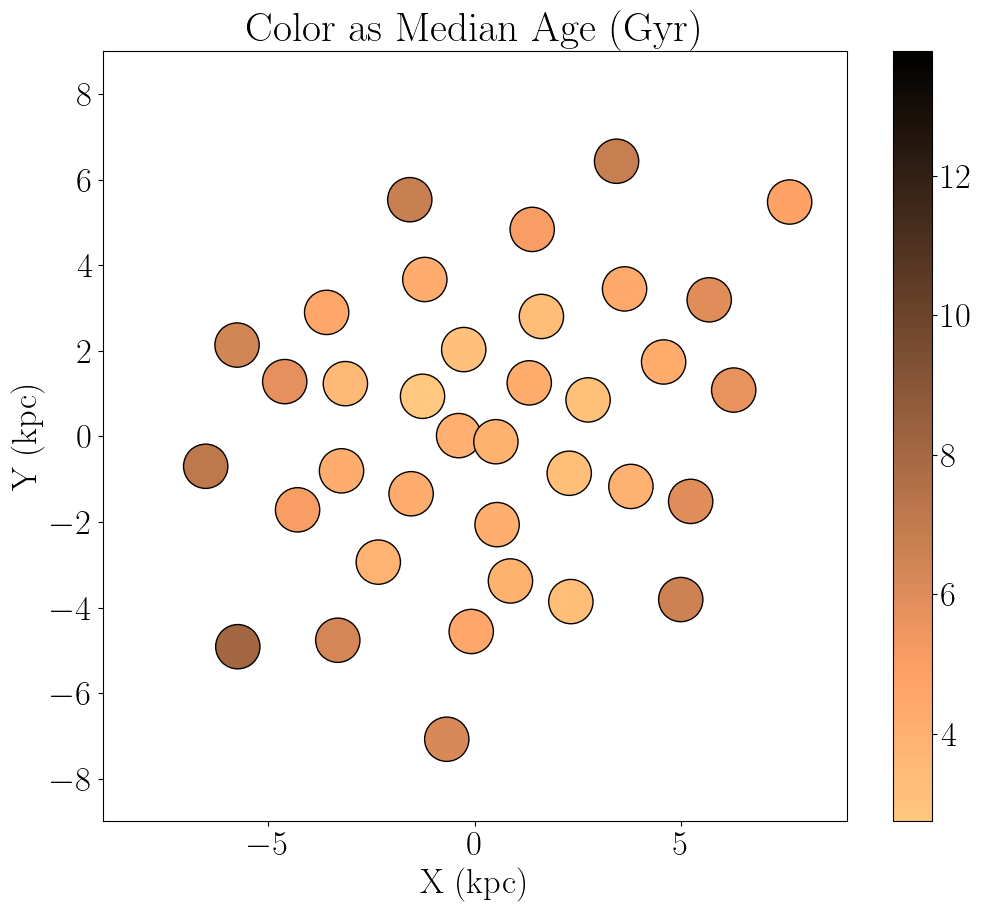

In [78]:
fig, ax = plt.subplots(1,1,figsize=[12,10])
plt.title(r'Color as Median Age (Gyr)')

# set bounds for the plot
ax.set_xlim(-9,9)
ax.set_ylim(-9,9)

# convert 0.8 deg diameter to points and calculate the marker size
r = 49.9*np.tan(np.radians(0.8/2)) #0.8
r_ = ax.transData.transform([r,0])[0] - ax.transData.transform([0,0])[0]
marker_size = np.pi * r_**2

pl = ax.scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=med_fld_age,edgecolors='k',cmap='copper_r',vmax=13.787)
plt.colorbar(pl,ax=ax)

ax.set_xlabel(r'X (kpc)')
ax.set_ylabel(r'Y (kpc)')

# ax.scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,facecolors='none',edgecolors='k')
plt.show()

In [79]:
fld_number_stars

array([ 41., 169., 171., 195., 138., 173., 152., 175., 131., 176., 192.,
       182., 148., 208., 205., 205.,  86.,  70., 170.,  65., 152., 185.,
       210., 188., 205., 152., 221., 180., 201., 160., 254., 236., 200.,
       171., 220., 143.])

In [80]:
cen_ra

array(['05:34:3.3', '04:14:32.0', '05:30:28.3', '05:41:49.0', '05:44:9.9',
       '05:44:24.1', '05:50:34.4', '06:8:2.8', '06:29:7.5', '06:29:59.5',
       '06:6:28.4', '06:12:35.8', '04:13:14.9', '05:14:31.3', '04:35:3.8',
       '04:35:47.4', '07:7:56.0', '05:44:24.8', '06:33:14.1', '04:15:7.1',
       '05:12:55.0', '04:56:36.5', '06:23:21.8', '04:49:10.2',
       '04:50:5.4', '05:31:58.7', '04:27:18.9', '06:51:56.5', '06:5:43.3',
       '04:6:26.5', '04:54:54.6', '04:57:10.3', '05:10:55.5',
       '05:14:46.4', '05:20:48.5', '05:22:15.7'], dtype='<U32')

In [81]:
select_results = Table.read('lmc_rgbmembers_selectfunc2.fits.gz')

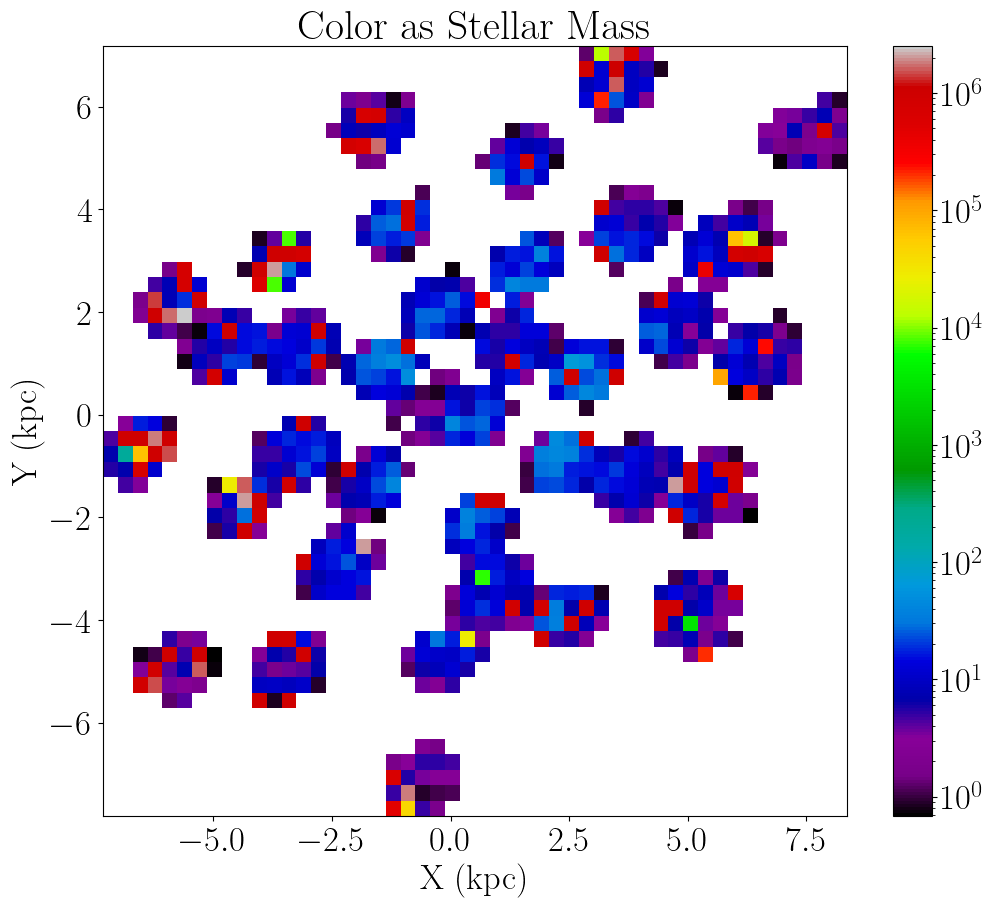

In [82]:
from matplotlib.colors import LogNorm
plt.figure(figsize=[12,10])
raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
ret = binned_statistic_2d(lmcx[raw_mass],lmcy[raw_mass],agetab['MASS'][raw_mass],'sum',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',norm=LogNorm())
plt.colorbar()

plt.title(r'Color as Stellar Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')
plt.show()

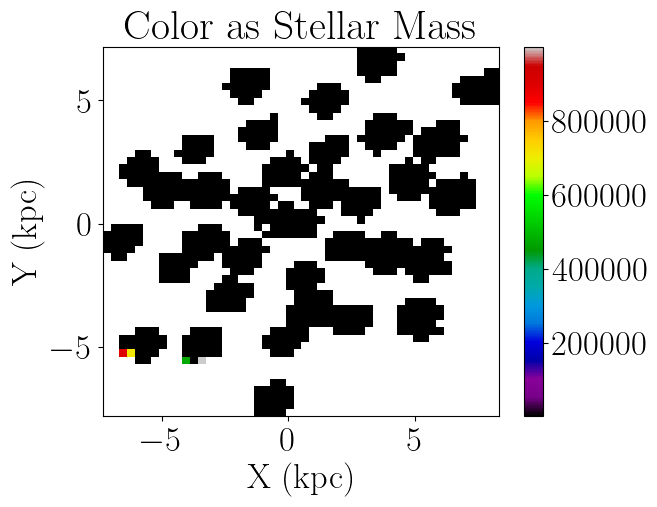

In [472]:
# plt.figure(figsize=[12,10])
# raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
# ret = binned_statistic_2d(lmcx[raw_mass],lmcy[raw_mass],agetab['MASS'][raw_mass],'median',bins=50)
# im = plt.imshow(ret.statistic.T, origin='lower',
#                 extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#                 aspect='auto',interpolation='nearest',cmap='nipy_spectral',)
# plt.colorbar()

# plt.title(r'Color as Stellar Mass')
# plt.xlabel(r'X (kpc)')
# plt.ylabel(r'Y (kpc)')
# # plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')
# plt.show()

Text(4, 1750, 'Median Mass: 1.122 $\\pm$ 0.388')

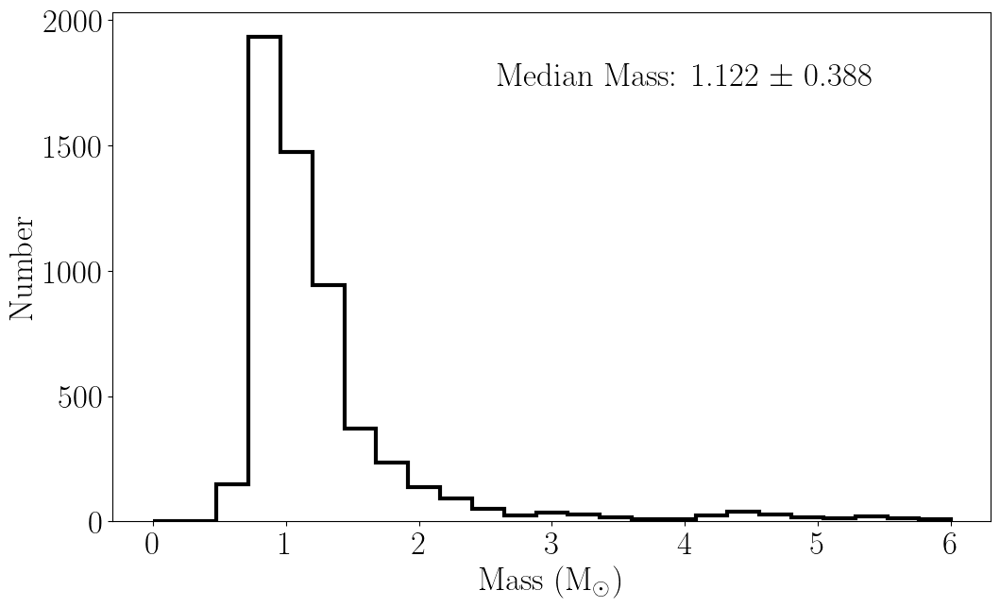

In [488]:
plt.figure(figsize=[12,7])
plt.hist(agetab['MASS'],range=(0,6),bins=25,histtype='step',lw=3.0,color='k')
plt.xlabel(r'Mass (M$_{\odot}$)')
plt.ylabel(r'Number')
plt.text(4,1750,'Median Mass: {:.3f} $\pm$ {:.3f}'.format(np.nanmedian(agetab['MASS']),mad(agetab['MASS'])),
         horizontalalignment='center')

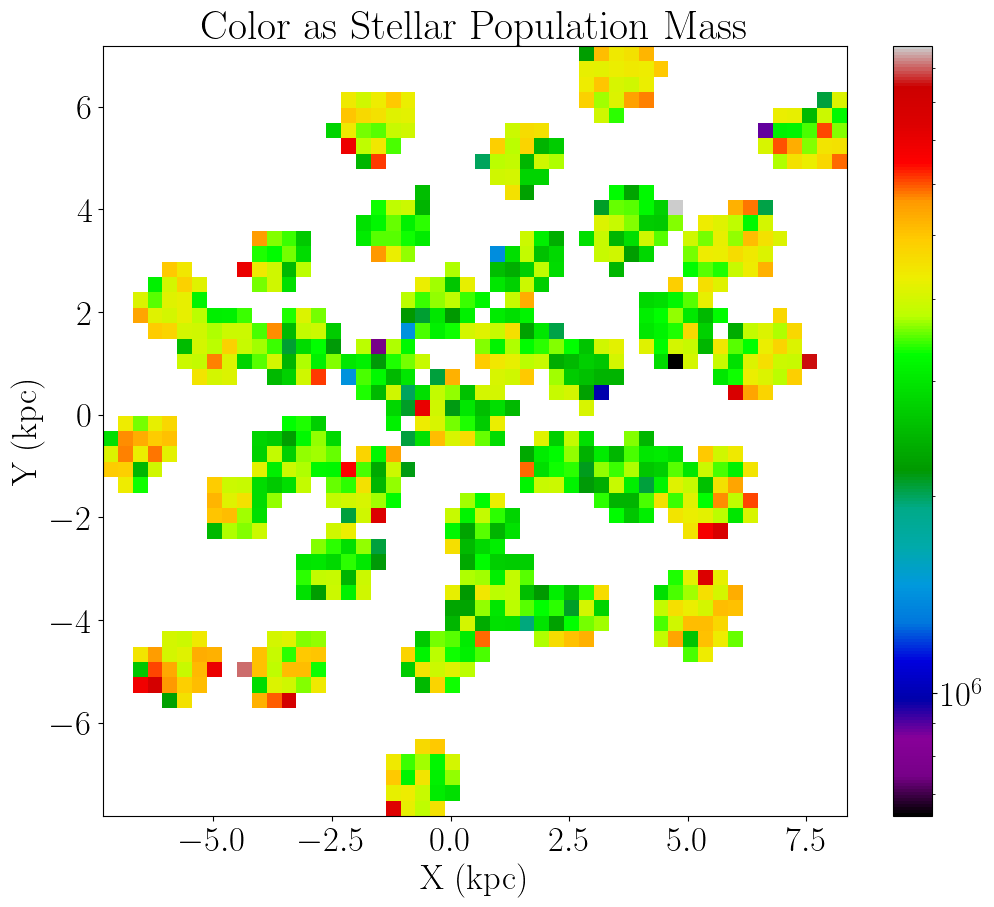

In [83]:
from matplotlib.colors import LogNorm
plt.figure(figsize=[12,10])
unmasked_mass, = np.where(select_results['stellarmass']!=select_results['stellarmass'][6])
ret = binned_statistic_2d(lmcx[unmasked_mass],lmcy[unmasked_mass],select_results['stellarmass'][unmasked_mass],
                          'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',norm=LogNorm())
plt.colorbar()

plt.title(r'Color as Stellar Population Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')
plt.show()

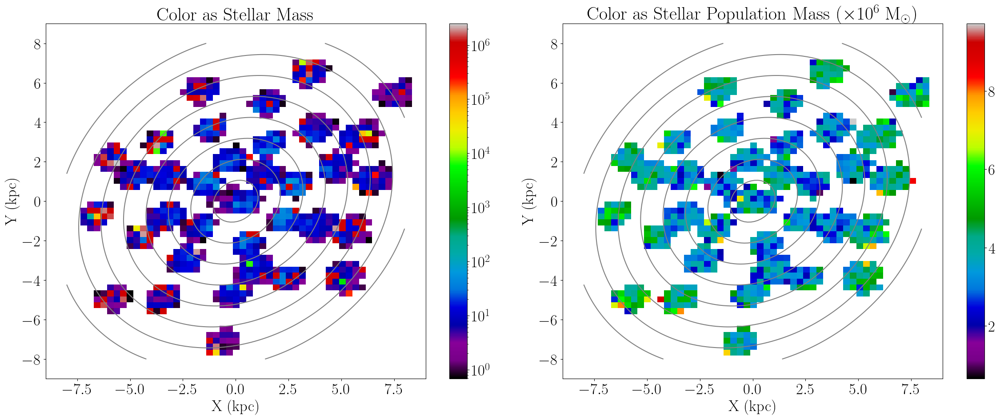

In [84]:
plt.figure(figsize=[24,10])

plt.subplot(121)
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
ret = binned_statistic_2d(lmcx[raw_mass],lmcy[raw_mass],agetab['MASS'][raw_mass],'sum',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',norm=LogNorm())
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')

plt.subplot(122)
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
unmasked_mass, = np.where(select_results['stellarmass']!=select_results['stellarmass'][6])
ret = binned_statistic_2d(lmcx[unmasked_mass],lmcy[unmasked_mass],select_results['stellarmass'][unmasked_mass],
                          'median',bins=50)
im = plt.imshow(ret.statistic.T/10**6, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral')#,norm=LogNorm())
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Population Mass ($\times 10^6$ M$_{\odot}$)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()
# plt.savefig('lmc_mass_map_sf2.png',bbox_inches='tight')
plt.show()

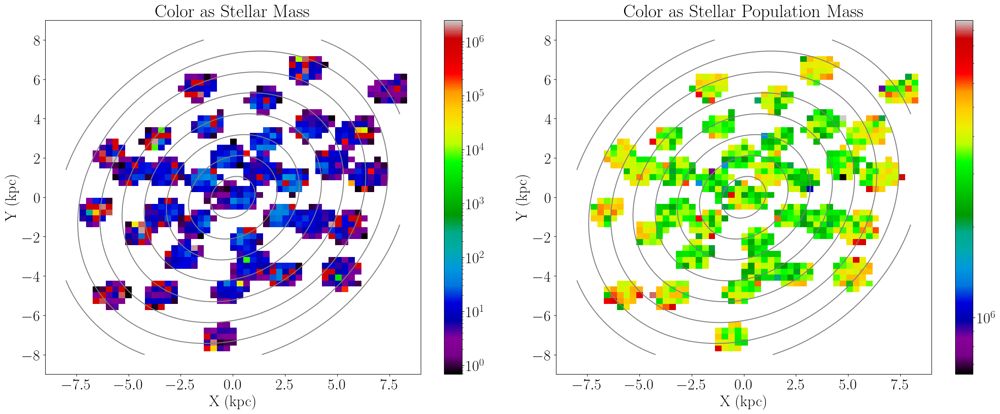

In [85]:
plt.figure(figsize=[24,10])

plt.subplot(121)
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
ret = binned_statistic_2d(lmcx[raw_mass],lmcy[raw_mass],agetab['MASS'][raw_mass],'sum',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',norm=LogNorm())
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')

plt.subplot(122)
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
unmasked_mass, = np.where(select_results['stellarmass']!=select_results['stellarmass'][6])
ret = binned_statistic_2d(lmcx[unmasked_mass],lmcy[unmasked_mass],select_results['stellarmass'][unmasked_mass],
                          'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',norm=LogNorm())
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Population Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()
plt.savefig('lmc_mass_map_sf2.png',bbox_inches='tight')
plt.show()

In [86]:
np.sum(select_results['stellarmass'][unmasked_mass])/10**10

2.3535812066211848

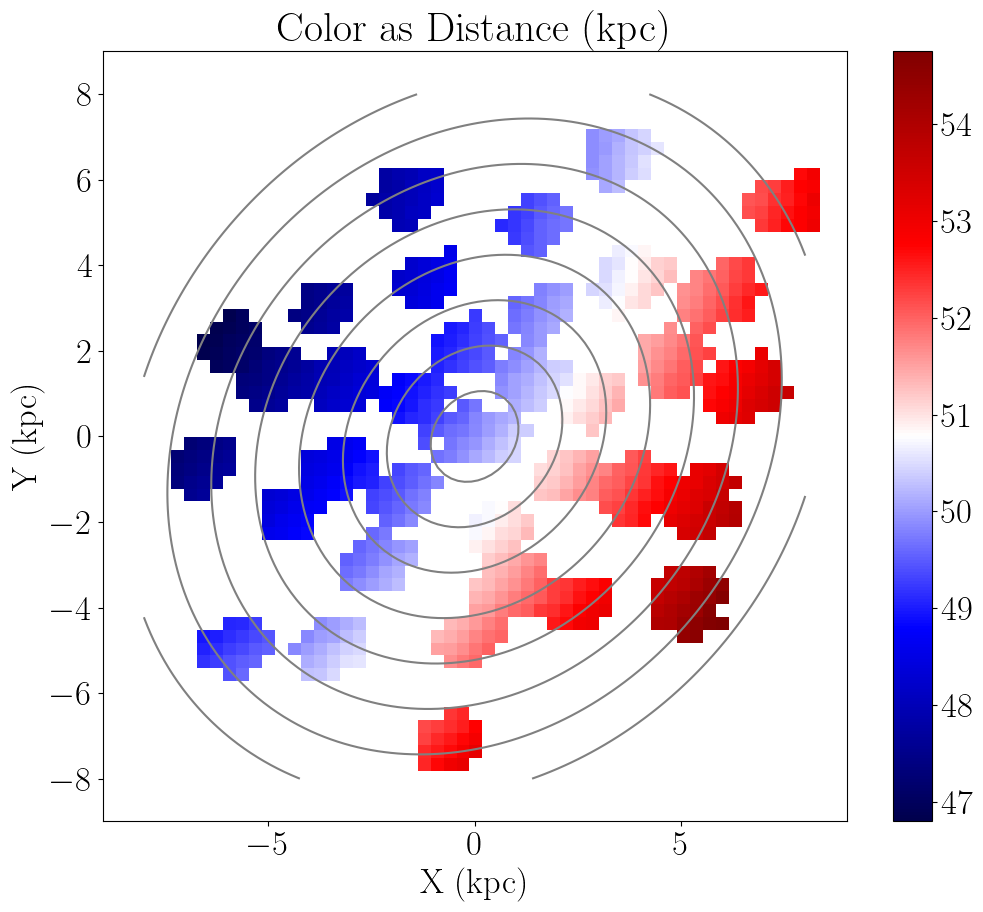

In [87]:
plt.figure(figsize=[12,10])
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

# raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
ret = binned_statistic_2d(lmcx,lmcy,lmcdis,'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='seismic')
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Distance (kpc)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
plt.savefig('ftabl',bbox_inches='tight')
plt.show()

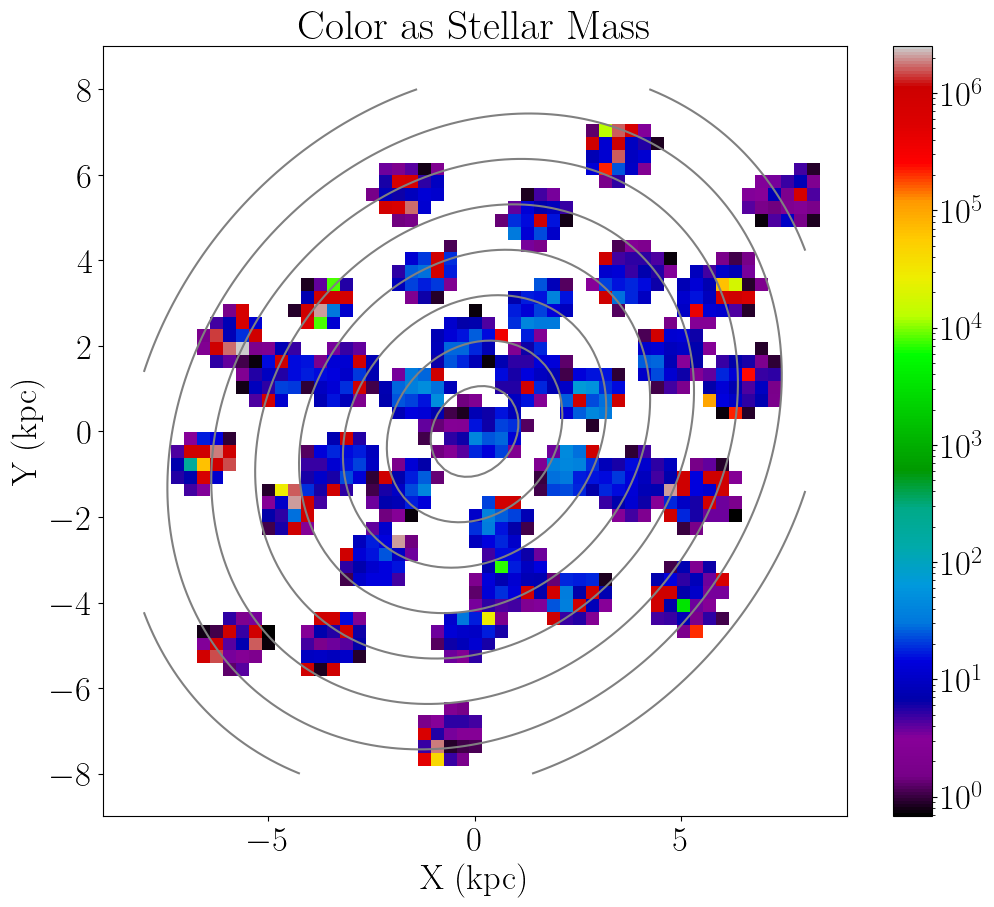

In [88]:
plt.figure(figsize=[12,10])
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
ret = binned_statistic_2d(lmcx[raw_mass],lmcy[raw_mass],agetab['MASS'][raw_mass],'sum',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',norm=LogNorm())
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_mass_map_raw.png')
plt.show()

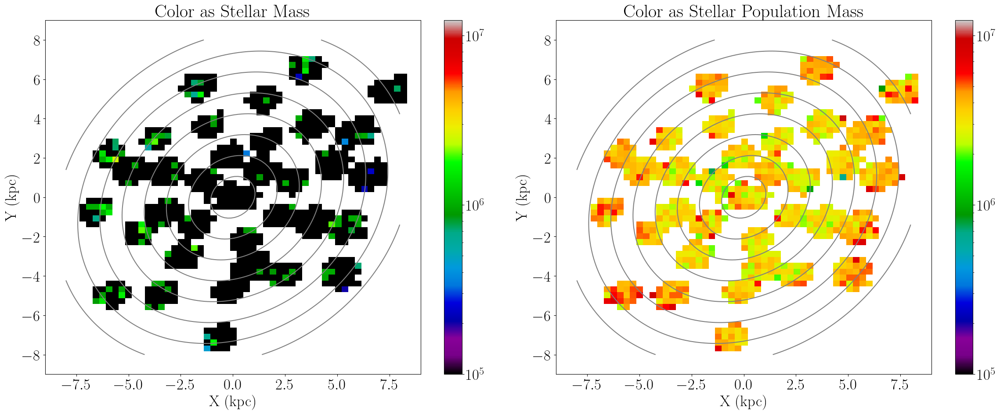

In [89]:
plt.figure(figsize=[24,10])

plt.subplot(121)
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

raw_mass, = np.where((agetab['MASS']!=999999.0)&(np.isfinite(agetab['MASS'])==True))
ret = binned_statistic_2d(lmcx[raw_mass],lmcy[raw_mass],agetab['MASS'][raw_mass],'sum',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',
                norm=LogNorm(vmin=10**5,vmax=max(select_results['stellarmass'][unmasked_mass])))
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_ag.png',dpi=300,bbox_inches='tight')

plt.subplot(122)
xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
unmasked_mass, = np.where(select_results['stellarmass']!=select_results['stellarmass'][6])
ret = binned_statistic_2d(lmcx[unmasked_mass],lmcy[unmasked_mass],select_results['stellarmass'][unmasked_mass],
                          'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',
                norm=LogNorm(vmin=10**5,vmax=max(select_results['stellarmass'][unmasked_mass])))
plt.colorbar()

plt.xlim(-9,9)
plt.ylim(-9,9)

plt.title(r'Color as Stellar Population Mass')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()
# plt.savefig('lmc_mass_map.png',bbox_inches='tight')
plt.show()

In [90]:
def bloop(j_k):
    '''
    Function used to cut the bloop using apparent 2Mass colors. The return is the K on the boundary as a function
    of J - K color.
    
    Inputs:
    ------
    j_k: J - K 2Mass color
    
    Outputs:
    -------
    k: apparent 2Mass K of bloop cut 
    '''
    
    j_k = np.asarray(j_k)
    
    bloop_bound = np.ones(len(j_k))
    
    for i in range(len(j_k)):
        if j_k[i] <= 0.85:
            bloop_bound[i] = 12.75
#             return 12.75 #k
        else:
            bloop_bound[i] = -4.25*j_k[i] + 16.36
#             return -4.25*j_k + 16.36
        
    return bloop_bound


bloop_cut, = np.where(lmcdr17['K']>bloop(lmcdr17['J']-lmcdr17['K'])) 

bloop_only = np.where(lmcdr17['K']<bloop(lmcdr17['J']-lmcdr17['K']))

  0%|          | 0/5828 [00:00<?, ?it/s]

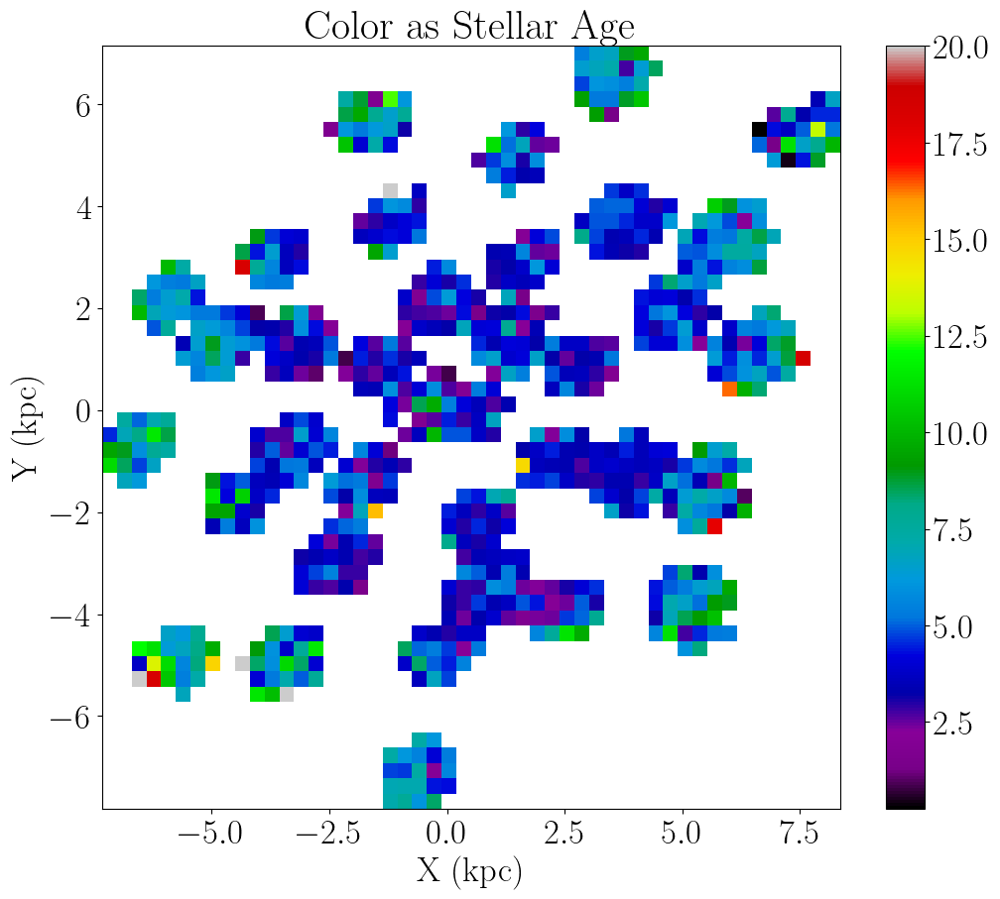

In [91]:
new_num_nobloop = 1/(agetab['DELTA_INT_IMF'][bloop_cut]*select_results['stellarmass'][bloop_cut])

age_num_norm2_nobloop = np.array([])
num_norm2_nobloop_x = np.array([])
num_norm2_nobloop_y = np.array([])

unmasked_mass_nobloop, = np.where(np.isfinite(new_num_nobloop)==True) 

for i in tqdm(range(len(agetab[unmasked_mass_nobloop]))):
    age_num_norm2_nobloop = np.append(age_num_norm2_nobloop,(agetab['AGE'][bloop_cut][unmasked_mass_nobloop][i]*np.ones(int(np.ceil(new_num_nobloop[unmasked_mass_nobloop][i])))).tolist())
    num_norm2_nobloop_x = np.append(num_norm2_nobloop_x,(lmcx[bloop_cut][unmasked_mass_nobloop][i]*np.ones(int(np.ceil(new_num_nobloop[unmasked_mass_nobloop][i])))).tolist())
    num_norm2_nobloop_y = np.append(num_norm2_nobloop_y,(lmcy[bloop_cut][unmasked_mass_nobloop][i]*np.ones(int(np.ceil(new_num_nobloop[unmasked_mass_nobloop][i])))).tolist())
    
plt.figure(figsize=[12,10])
ret = binned_statistic_2d(num_norm2_nobloop_x,num_norm2_nobloop_y,age_num_norm2_nobloop,'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=20)
plt.colorbar()

plt.title(r'Color as Stellar Age')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
plt.savefig('lmc_map_age.png',dpi=300,bbox_inches='tight')
plt.show()

In [92]:
# stellar mass wgt feh by fld
# AMR

In [93]:
fld_wgt_avg = np.ones(len(np.unique(lmcdr17['FIELD'][bloop_cut])))
fld_disp = np.ones(len(np.unique(lmcdr17['FIELD'][bloop_cut])))

for i in range(len(np.unique(lmcdr17['FIELD'][bloop_cut]))):
    
    # fld, = np.where((lmcdr17[bloop_cut]['FIELD']==np.unique(lmcdr17['FIELD'][bloop_cut])[i])&(agetab['AGE'][bloop_cut]!=999999.0))
    
    fld, = np.where((lmcdr17['FIELD']==np.unique(lmcdr17['FIELD'])[i])&(agetab['AGE']<=20.0))
    
    fld_wgt_avg[i] = np.dot(agetab['AGE'][fld],select_results[fld]['stellarmass'])/np.sum(select_results[fld]['stellarmass'])
    fld_disp[i] = mad(np.multiply(agetab['AGE'][fld],select_results[fld]['stellarmass'])/np.sum(select_results[fld]['stellarmass']))
    #np.dot(agetab['AGE'][fld],select_results[fld]['stellarmass'])/np.sum(select_results[fld]['stellarmass'])
    
#     corr_fld_ages = np.array([])
    
#     for j in range(len(fld)):
#         corr_fld_ages = np.append(corr_fld_ages,(agetab['AGE'][bloop_cut][fld][i]*np.ones(int(np.ceil(new_num_nobloop[fld][i])))).tolist())
    
#     corrected_fld_medians[i] = np.nanmedian(corr_fld_ages)

In [94]:
fld_wgt_avg

array([5.60198094, 8.34918714, 7.16448258, 6.14509696, 9.19094601,
       4.7306475 , 6.14168256, 7.27217579, 8.91424423, 8.55757277,
       5.93349798, 6.06717851, 7.28047163, 5.35668148, 6.12761353,
       5.53641911, 9.98647121, 8.11126017, 9.4050656 , 6.55262537,
       6.14895806, 8.48044356, 8.55952693, 5.52326006, 7.22253014,
       4.7589326 , 7.62508544, 9.66726425, 5.64521558, 8.54549489,
       4.73070959, 5.72980234, 5.78742276, 7.6559293 , 6.48358238,
       6.40454964])

In [95]:
fld_disp

array([0.07029768, 0.03326093, 0.02428189, 0.01728772, 0.04674488,
       0.01769812, 0.02041794, 0.021813  , 0.04585502, 0.02310676,
       0.01174637, 0.01769605, 0.03207713, 0.01372516, 0.01703818,
       0.01214606, 0.08700945, 0.06911121, 0.04054436, 0.06462087,
       0.02580326, 0.03569003, 0.02649145, 0.01085825, 0.01590426,
       0.02039295, 0.02266034, 0.03682094, 0.01143125, 0.03723156,
       0.01239814, 0.01059559, 0.01489263, 0.02682885, 0.01458798,
       0.02715008])

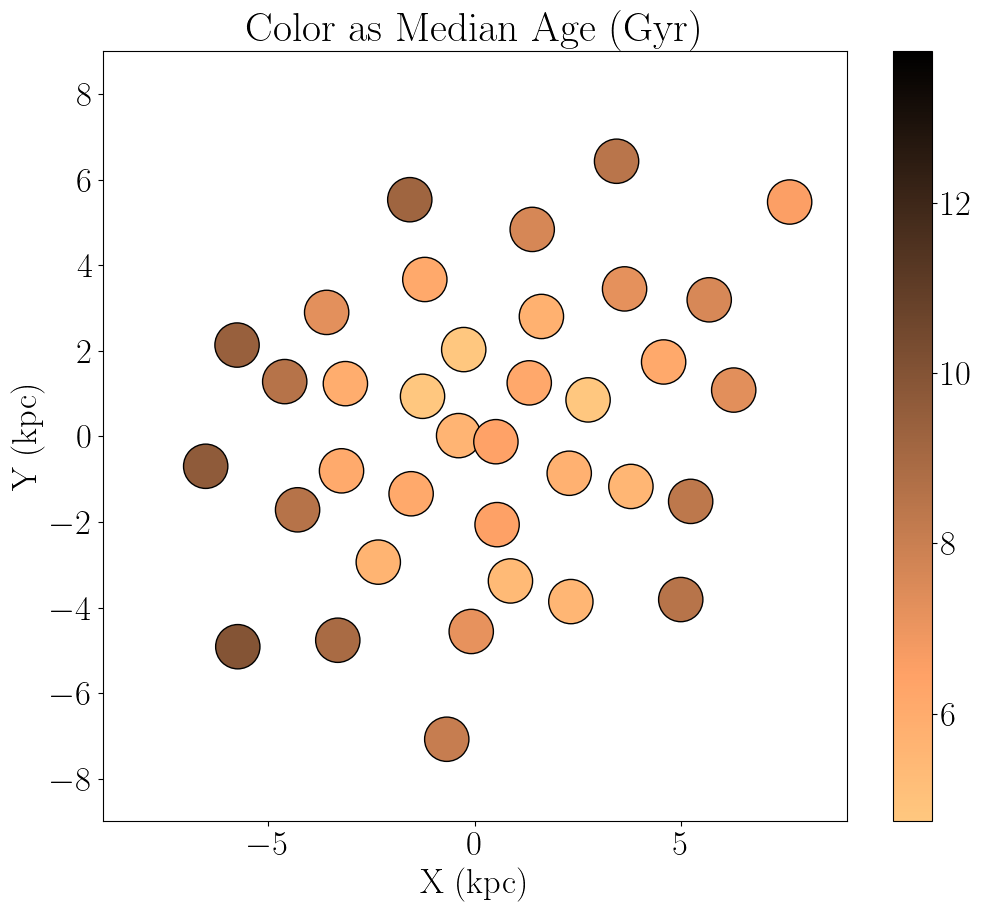

In [96]:
fig, ax = plt.subplots(1,1,figsize=[12,10])
plt.title(r'Color as Median Age (Gyr)')

# set bounds for the plot
ax.set_xlim(-9,9)
ax.set_ylim(-9,9)

# convert 0.8 deg diameter to points and calculate the marker size
r = 49.9*np.tan(np.radians(0.8/2)) #0.8
r_ = ax.transData.transform([r,0])[0] - ax.transData.transform([0,0])[0]
marker_size = np.pi * r_**2

pl = ax.scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=fld_wgt_avg,edgecolors='k',cmap='copper_r',vmax=13.787)
plt.colorbar(pl,ax=ax)

ax.set_xlabel(r'X (kpc)')
ax.set_ylabel(r'Y (kpc)')

# ax.scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,facecolors='none',edgecolors='k')
plt.show()

#####################################
#### Make ellipses for this plot ####
#####################################

# side by side raw + corrected map


In [97]:
fin, = np.where(np.isfinite(gaiax)==False)
fin

array([], dtype=int64)

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/2575631115.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<function matplotlib.pyplot.show(close=None, block=None)>

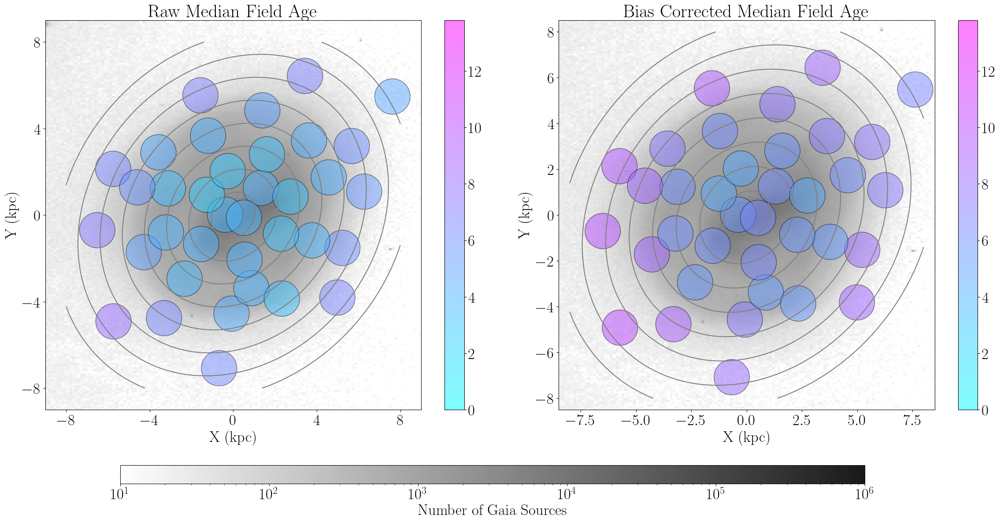

In [98]:
# psi = np.radians(227.24+90.0)
# b_a = 0.839

# clabx = (np.arange(7)+1)*np.sqrt(1/(np.cos(psi)**2+np.sin(psi)**2/b_a))

# locations = []
# for i in range(len(clabx)):
#     locations.append([clabx[i],0.0])

from matplotlib.colors import LogNorm
    
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

fig, ax = plt.subplots(1,2,figsize=[24,14])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = ax[0].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
#ax[0].clabel(CS,colors='k',fontsize=25,manual=locations)

# fmt = {}
# strs = ['1', '2', '3', '4', '5', '6', '7']
# for l, s in zip(CS.levels, strs):
#     fmt[l] = s
# ax[0].clabel(CS, CS.levels[::2], inline=True, fmt=fmt, fontsize=10, manual=locations)

CS = ax[1].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
#ax[1].clabel(CS,colors='k',fontsize=25,manual=locations)

# for i in range(len(clabx)):
#     ax[0].text(clabx[i]*(1+0.01),0.0,'{}'.format(i+1))

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

# set bounds for the plot
for i in range(1):
    ax[i].set_xlim(-9,9)
    ax[i].set_ylim(-9,9)
    ax[i].set_xlabel(r'X (kpc)')
    ax[i].set_ylabel(r'Y (kpc)')

    ax[i].set_xticks([-8,-4.0,0,4.0,8])
    ax[i].set_yticks([-8,-4.0,0,4.0,8])
    
# convert 0.8 deg diameter to points and calculate the marker size
r = 49.9*np.tan(np.radians(0.8)) #0.8
r_ = ax[0].transData.transform([r,0])[0] - ax[0].transData.transform([0,0])[0]
marker_size = np.pi * r_**2

ax[0].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

im = ax[1].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

alpha = 0.5
pl = ax[0].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=med_fld_age,edgecolors='k',cmap='cool',vmin=0,vmax=13.787,alpha=alpha)
plt.colorbar(pl,ax=ax[0])
pl = ax[1].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=fld_wgt_avg,edgecolors='k',cmap='cool',vmin=0,vmax=13.787,alpha=alpha)
plt.colorbar(pl,ax=ax[1])

plt.colorbar(im,ax=[ax[0],ax[1]],location='bottom',pad=-0.45,aspect=40,label='Number of Gaia Sources')
ax[0].set_title(r'Raw Median Field Age')
ax[1].set_title(r'Bias Corrected Median Field Age')

ax[1].set_xlabel(r'X (kpc)')
ax[1].set_ylabel(r'Y (kpc)')

plt.tight_layout()

plt.savefig(r'lmc_median_field_age_map_sf2.png',bbox_inches='tight')
plt.show

In [99]:
cen_xy

array([[-0.3865499 ,  0.01917942],
       [ 5.22773099, -1.5180705 ],
       [-0.08089229, -4.55926933],
       [-1.20365112,  3.66911501],
       [-1.56776558,  5.53411829],
       [-1.25936032,  0.93829823],
       [-1.53540728, -1.33998152],
       [-3.57894995,  2.89958551],
       [-3.30962356, -4.76419881],
       [-4.28234624, -1.71555455],
       [-3.12546807,  1.23415711],
       [-3.21913165, -0.80389847],
       [ 6.2693485 ,  1.08422578],
       [ 0.8676355 , -3.37799978],
       [ 4.5735249 ,  1.74094124],
       [ 3.78228448, -1.16884401],
       [-5.72859563, -4.9154034 ],
       [-0.67307837, -7.07849725],
       [-5.74684179,  2.13610988],
       [ 7.6227926 ,  5.48021445],
       [ 1.32260859,  1.25230627],
       [ 3.43510653,  6.43340633],
       [-4.59349745,  1.28200578],
       [ 2.32934539, -3.86047053],
       [ 3.62872068,  3.4489863 ],
       [-0.26252468,  2.03058938],
       [ 5.67668901,  3.19378773],
       [-6.50538605, -0.69734639],
       [-2.32976803,

In [100]:
headers = ["R.A.","Decl.","X","Y","R","PA","N"]
data = dict()
data["R.A."] = 
data["Decl."] =
data["R"] = list(cen_rpa[:,0])
data["PA"] = list(cen_rpa[:,1])
data["X"] = list(cen_xy[:,0])
data["Y"] = list(cen_xy[:,1])
data["N"] = list(fld_number_stars)

textabular = f"l|{'r'*len(headers)}"
texheader = " & " + " & ".join(headers) + "\\\\"
texdata = "\\hline\n"
for label in sorted(data):
    if label == "z":
        texdata += "\\hline\n"
    texdata += f"{label} & {' & '.join(map(str,data[label]))} \\\\\n"

print("\\begin{tabular}{"+textabular+"}")
print(texheader)
print(texdata,end="")
print("\\end{tabular}")

SyntaxError: invalid syntax (862350318.py, line 3)

In [101]:
list(cen_xy[:,0])

[-0.3865498997168248,
 5.227730988385461,
 -0.08089229247654407,
 -1.2036511221155202,
 -1.567765578507861,
 -1.259360320217214,
 -1.5354072781357404,
 -3.578949950194082,
 -3.3096235647784247,
 -4.282346236741931,
 -3.1254680729467186,
 -3.2191316538121972,
 6.269348496124337,
 0.8676354972419933,
 4.5735249023871,
 3.7822844849255914,
 -5.728595630592378,
 -0.6730783712762096,
 -5.746841791333468,
 7.622792597789566,
 1.3226085947240325,
 3.435106531640993,
 -4.593497451309789,
 2.3293453902529118,
 3.6287206829001613,
 -0.26252467690847847,
 5.67668901431125,
 -6.505386054212634,
 -2.329768030024881,
 4.987838170092612,
 2.745783116109198,
 2.289929884247494,
 1.6168299036239677,
 1.3945627642590819,
 0.5445117203792893,
 0.5159043072626629]

In [102]:
len(cen_xy)

36

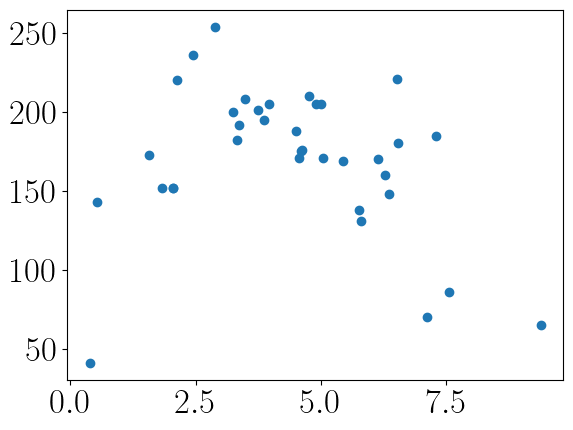

In [103]:
plt.scatter(np.sqrt(cen_xy[:,0]**2+cen_xy[:,1]**2),fld_number_stars)

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/878062196.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


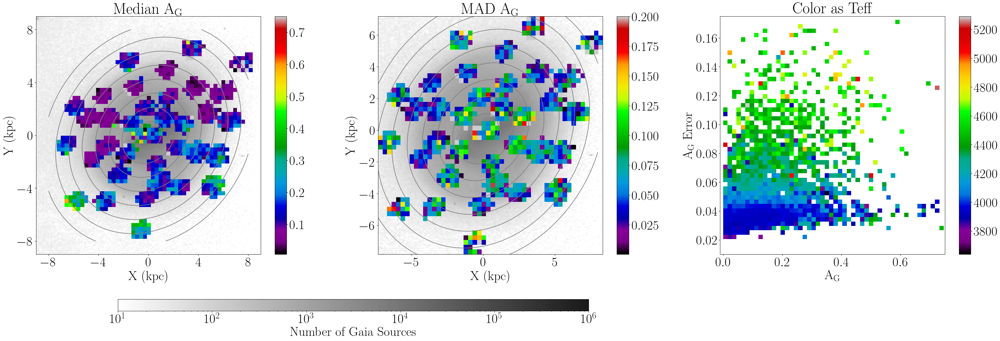

In [499]:
matplotlib.rcParams.update({'font.size': 32.5,'axes.facecolor':'w'})
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

fig, ax = plt.subplots(1,3,figsize=[36,14])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = ax[0].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[1].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
# CS = ax[2].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

# set bounds for the plot
for i in range(1):
    ax[i].set_xlim(-9,9)
    ax[i].set_ylim(-9,9)
    ax[i].set_xlabel(r'X (kpc)')
    ax[i].set_ylabel(r'Y (kpc)')

    ax[i].set_xticks([-8,-4.0,0,4.0,8])
    ax[i].set_yticks([-8,-4.0,0,4.0,8])
    
    im = ax[i].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

# ax[0].imshow(ret.statistic.T, origin='lower',
#              extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#              aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

# ax[1].imshow(ret.statistic.T, origin='lower',
#              extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#              aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

im = ax[1].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ret = binned_statistic_2d(lmcx,lmcy,agetab['EXT'][:,1],'median',bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[0].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=0.75)
plt.colorbar(pl,ax=ax[0])
ax[0].set_title(r'Median A$_{\rm G}$')

ret = binned_statistic_2d(lmcx,lmcy,agetab['EXT'][:,1],mad,bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[1].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=0.2)
plt.colorbar(pl,ax=ax[1])
ax[1].set_title(r'MAD A$_{\rm G}$')

ext_cut, = np.where((agetab['EXT'][:,1]<=0.75)&(agetab['EXT_ERR'][:,1]<=0.175))
ret = binned_statistic_2d(agetab['EXT'][:,1][ext_cut],agetab['EXT_ERR'][:,1][ext_cut],
                          lmcdr17['TEFF'][ext_cut],'median',bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[2].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')
plt.colorbar(pl,ax=ax[2])
ax[2].set_title(r'Color as Teff')

plt.colorbar(im,ax=[ax[0],ax[1]],location='bottom',pad=-0.45,aspect=40,label='Number of Gaia Sources')

ax[1].set_xlabel(r'X (kpc)')
ax[1].set_ylabel(r'Y (kpc)')

ax[2].set_xlim(-0.01,0.75)
ax[2].set_ylim(0.01,0.175)

ax[2].set_ylabel(r'A$_{\rm G}$ Error',x=2)
ax[2].set_xlabel(r'A$_{\rm G}$')

plt.tight_layout()

# plt.savefig(r'lmc_median_field_age_map_sf2.png',bbox_inches='tight')
plt.savefig(r'lmc_ext_map_fld_sf2.png',bbox_inches='tight')
plt.show()

matplotlib.rcParams.update({'font.size': 25,'axes.facecolor':'w'})

(array([5752.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         378.]),
 array([1.95573052e-04, 9.99999002e+04, 1.99999800e+05, 2.99999700e+05,
        3.99999600e+05, 4.99999500e+05, 5.99999400e+05, 6.99999300e+05,
        7.99999200e+05, 8.99999100e+05, 9.99999000e+05]),
 <BarContainer object of 10 artists>)

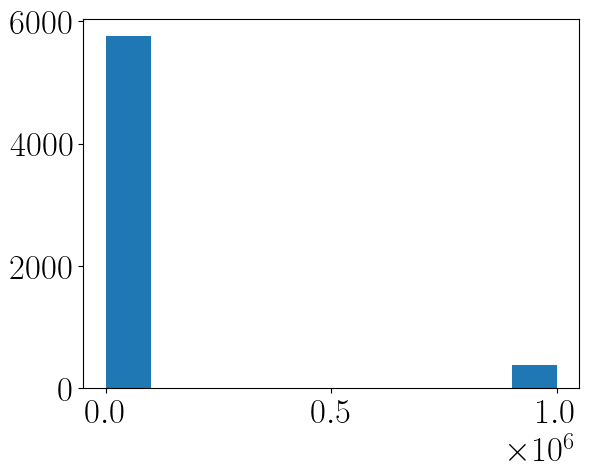

In [105]:
plt.hist(agetab['EXT'][:,1])

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/3599657556.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


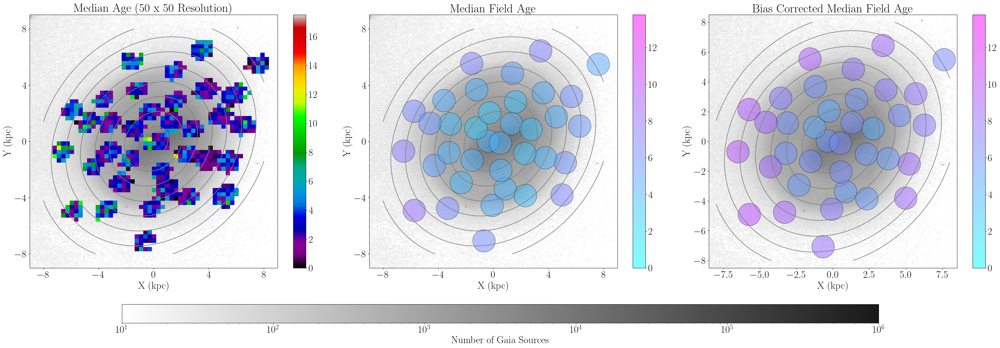

In [106]:
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

fig, ax = plt.subplots(1,3,figsize=[36,14])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = ax[0].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[1].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[2].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

# set bounds for the plot
for i in range(2):
    ax[i].set_xlim(-9,9)
    ax[i].set_ylim(-9,9)
    ax[i].set_xlabel(r'X (kpc)')
    ax[i].set_ylabel(r'Y (kpc)')

    ax[i].set_xticks([-8,-4.0,0,4.0,8])
    ax[i].set_yticks([-8,-4.0,0,4.0,8])
    
# convert 0.8 deg diameter to points and calculate the marker size
r = 49.9*np.tan(np.radians(0.8)) #0.8
r_ = ax[0].transData.transform([r,0])[0] - ax[0].transData.transform([0,0])[0]
marker_size = np.pi * r_**2

ax[0].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ax[1].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

im = ax[2].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],mad,bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[0].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=17.5)
plt.colorbar(pl,ax=ax[0])
ax[0].set_title(r'Median Age (50 x 50 Resolution)')

alpha = 0.5

pl = ax[1].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=med_fld_age,edgecolors='k',cmap='cool',vmin=0,vmax=13.787,alpha=alpha)
plt.colorbar(pl,ax=ax[1])
pl = ax[2].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=fld_wgt_avg,edgecolors='k',cmap='cool',vmin=0,vmax=13.787,alpha=alpha)
plt.colorbar(pl,ax=ax[2])

plt.colorbar(im,ax=[ax[0],ax[1],ax[2]],location='bottom',pad=-0.45,aspect=40,label='Number of Gaia Sources')
ax[1].set_title(r'Median Field Age')
ax[2].set_title(r'Bias Corrected Median Field Age')

ax[2].set_xlabel(r'X (kpc)')
ax[2].set_ylabel(r'Y (kpc)')

plt.tight_layout()

# plt.savefig(r'lmc_median_field_age_map_sf2.png',bbox_inches='tight')
plt.savefig(r'lmc_age_map_fld_sf2.png',bbox_inches='tight')
plt.show()

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/185627798.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


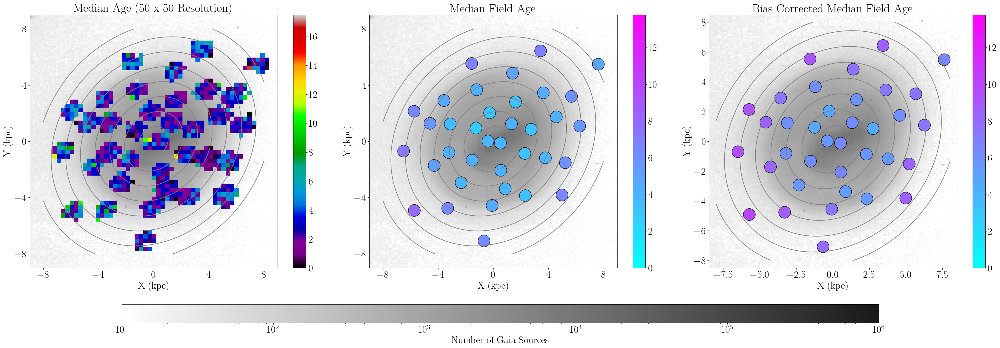

In [107]:
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

fig, ax = plt.subplots(1,3,figsize=[36,14])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = ax[0].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[1].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[2].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

# set bounds for the plot
for i in range(2):
    ax[i].set_xlim(-9,9)
    ax[i].set_ylim(-9,9)
    ax[i].set_xlabel(r'X (kpc)')
    ax[i].set_ylabel(r'Y (kpc)')

    ax[i].set_xticks([-8,-4.0,0,4.0,8])
    ax[i].set_yticks([-8,-4.0,0,4.0,8])
    
# convert 0.8 deg diameter to points and calculate the marker size
r = 49.9*np.tan(np.radians(0.85/2)) #0.8
r_ = ax[0].transData.transform([r,0])[0] - ax[0].transData.transform([0,0])[0]
marker_size = np.pi * r_**2

ax[0].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ax[1].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

im = ax[2].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ret = binned_statistic_2d(lmcx[bloop_cut],lmcy[bloop_cut],agetab['AGE'][bloop_cut],mad,bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[0].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=17.5)
plt.colorbar(pl,ax=ax[0])
ax[0].set_title(r'Median Age (50 x 50 Resolution)')

pl = ax[1].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=med_fld_age,edgecolors='k',cmap='cool',vmin=0,vmax=13.787)
plt.colorbar(pl,ax=ax[1])
pl = ax[2].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=fld_wgt_avg,edgecolors='k',cmap='cool',vmin=0,vmax=13.787)
plt.colorbar(pl,ax=ax[2])

plt.colorbar(im,ax=[ax[0],ax[1],ax[2]],location='bottom',pad=-0.45,aspect=40,label='Number of Gaia Sources')
ax[1].set_title(r'Median Field Age')
ax[2].set_title(r'Bias Corrected Median Field Age')

ax[2].set_xlabel(r'X (kpc)')
ax[2].set_ylabel(r'Y (kpc)')

plt.tight_layout()

plt.savefig(r'lmc_age_map_fld_sf2_nobloop.png',bbox_inches='tight')
plt.show()

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/3883734935.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


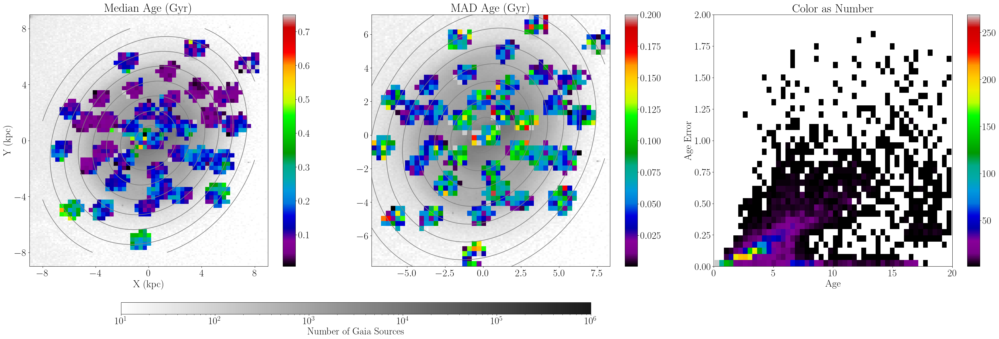

In [108]:
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

fig, ax = plt.subplots(1,3,figsize=[36,14])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = ax[0].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[1].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

# set bounds for the plot
for i in range(1):
    ax[i].set_xlim(-9,9)
    ax[i].set_ylim(-9,9)
    ax[i].set_xlabel(r'X (kpc)')
    ax[i].set_ylabel(r'Y (kpc)')

    ax[i].set_xticks([-8,-4.0,0,4.0,8])
    ax[i].set_yticks([-8,-4.0,0,4.0,8])
    
    im = ax[i].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

im = ax[1].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ret = binned_statistic_2d(lmcx,lmcy,agetab['EXT'][:,1],'median',bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[0].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=0.75)
plt.colorbar(pl,ax=ax[0])
ax[0].set_title(r'Median Age (Gyr)')

ret = binned_statistic_2d(lmcx,lmcy,agetab['EXT'][:,1],mad,bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[1].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=0.2)
plt.colorbar(pl,ax=ax[1])
ax[1].set_title(r'MAD Age (Gyr)')

age_cut, = np.where((agetab['AGE']<=20.)&(agetab['AGE_ERR']<=2.5))
ret = binned_statistic_2d(agetab['AGE'][age_cut],agetab['AGE_ERR'][age_cut],agetab['AGE'][age_cut],'count',bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[2].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')
plt.colorbar(pl,ax=ax[2])
ax[2].set_title(r'Color as Number')

plt.colorbar(im,ax=[ax[0],ax[1]],location='bottom',pad=-0.45,aspect=40,label='Number of Gaia Sources')

ax[2].set_xlim(0.0,20)
ax[2].set_ylim(0.0,2.0)

ax[2].set_ylabel(r'Age Error')
ax[2].set_xlabel(r'Age')

plt.tight_layout()

# plt.savefig(r'lmc_median_field_age_map_sf2.png',bbox_inches='tight')
# plt.savefig(r'lmc_ext_map_fld_sf2.png',bbox_inches='tight')
plt.show()

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/3034855696.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


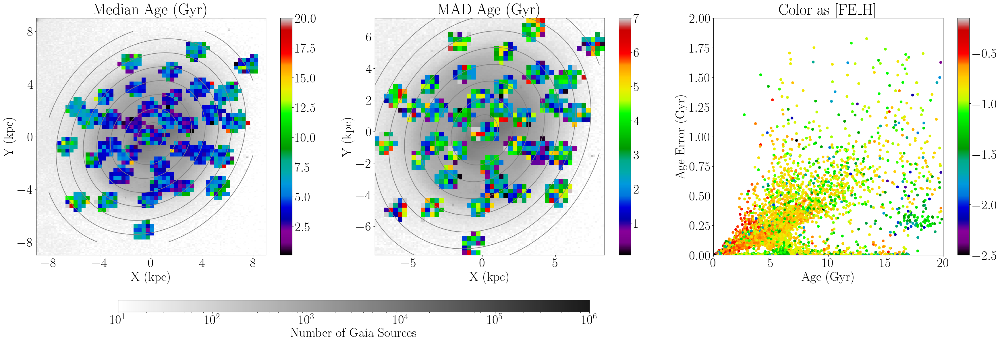

In [500]:
matplotlib.rcParams.update({'font.size': 32.5,'axes.facecolor':'w'})
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

fig, ax = plt.subplots(1,3,figsize=[36,14])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = ax[0].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')
CS = ax[1].contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='grey')

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

# set bounds for the plot
for i in range(1):
    ax[i].set_xlim(-9,9)
    ax[i].set_ylim(-9,9)
    ax[i].set_xlabel(r'X (kpc)')
    ax[i].set_ylabel(r'Y (kpc)')

    ax[i].set_xticks([-8,-4.0,0,4.0,8])
    ax[i].set_yticks([-8,-4.0,0,4.0,8])
    
    im = ax[i].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

im = ax[1].imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='binary',alpha=0.9,norm=LogNorm(vmin=10**1,vmax=10**6))

ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[0].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=20)
plt.colorbar(pl,ax=ax[0])
ax[0].set_title(r'Median Age (Gyr)')

ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],mad,bins=50)
ret.statistic[ret.statistic==0] = np.nan
pl = ax[1].imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmax=7)
plt.colorbar(pl,ax=ax[1])
ax[1].set_title(r'MAD Age (Gyr)')

age_cut, = np.where((agetab['AGE']<=20.)&(agetab['AGE_ERR']<=2.5))
# ret = binned_statistic_2d(agetab['AGE'][age_cut],agetab['AGE_ERR'][age_cut],agetab['FE_H'][age_cut],'median',bins=50)
# ret.statistic[ret.statistic==0] = np.nan
# pl = ax[2].imshow(ret.statistic.T, origin='lower',
#                     extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#                     aspect='auto',interpolation='nearest',cmap='nipy_spectral')
pl = ax[2].scatter(agetab['AGE'][age_cut],agetab['AGE_ERR'][age_cut],c=lmcdr17['FE_H'][age_cut],cmap='nipy_spectral')
plt.colorbar(pl,ax=ax[2])
ax[2].set_title(r'Color as [FE_H]')

plt.colorbar(im,ax=[ax[0],ax[1]],location='bottom',pad=-0.45,aspect=40,label='Number of Gaia Sources')

ax[2].set_xlim(0.0,20)
ax[2].set_ylim(0.0,2.0)

ax[1].set_xlabel(r'X (kpc)')
ax[1].set_ylabel(r'Y (kpc)')

ax[2].set_ylabel(r'Age Error (Gyr)')
ax[2].set_xlabel(r'Age (Gyr)')

plt.tight_layout()

# plt.savefig(r'lmc_median_field_age_map_sf2.png',bbox_inches='tight')
# plt.savefig(r'lmc_ext_map_fld_sf2.png',bbox_inches='tight')
plt.savefig(r'lmc_age_map_sf2.png',bbox_inches='tight')
plt.show()
matplotlib.rcParams.update({'font.size': 25,'axes.facecolor':'w'})

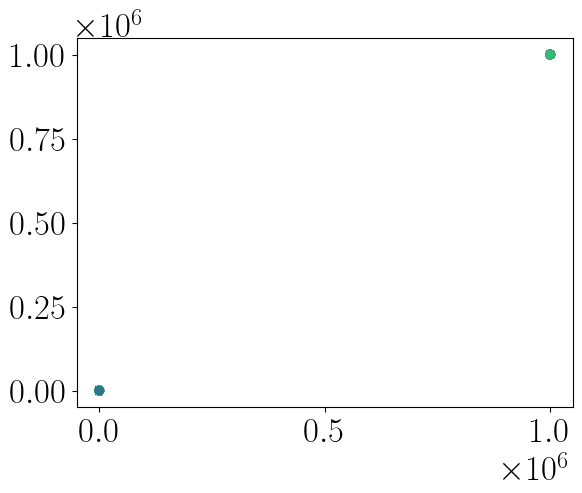

In [110]:
plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c=agetab['FE_H'])

In [111]:
# plt.figure(figsize=[12,10])

# xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
# CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')

# ret = binned_statistic_2d(lmcx,lmcy,lmcdis,'median',bins=50)
# im = plt.imshow(ret.statistic.T, origin='lower',
#                     extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#                     aspect='auto',interpolation='nearest',cmap='seismic')
# plt.colorbar()

# plt.xlim(-8.5,8.5)
# plt.ylim(-8.5,8.5)

# plt.title(r'Color as Distance (kpc)')
# plt.xlabel(r'X (kpc)')
# plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_distance.png',dpi=300,bbox_inches='tight')
# plt.show()

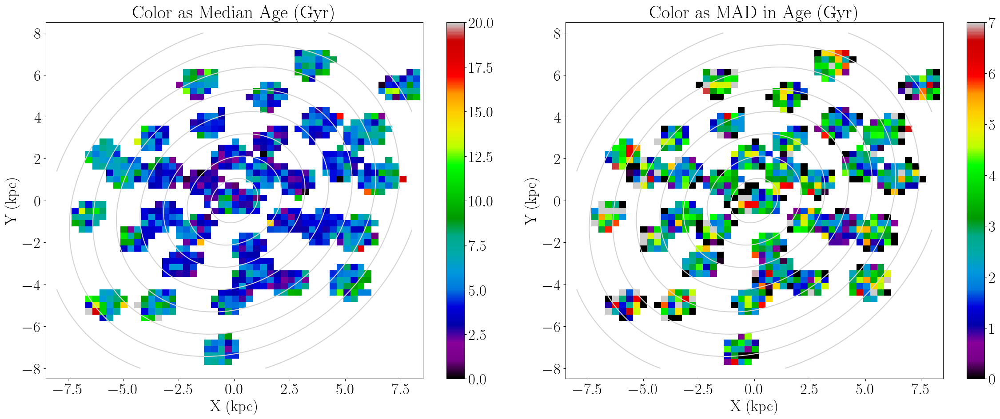

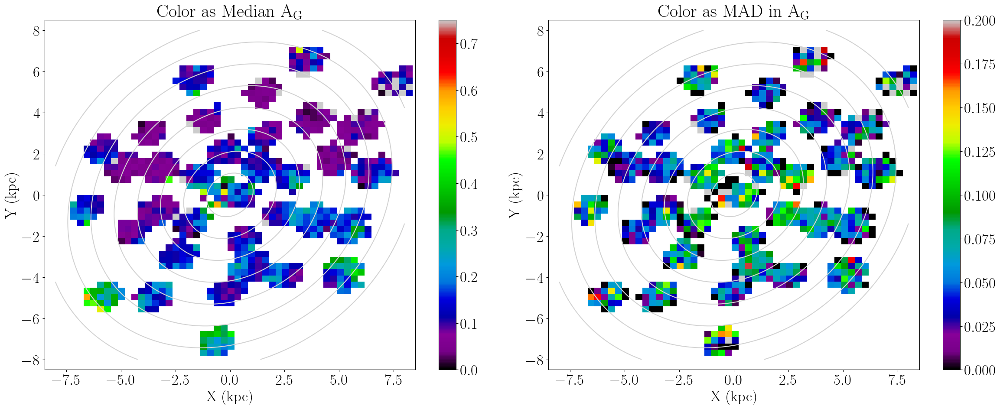

In [112]:
# plt.figure(figsize=[12,10])

# xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
# CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')

# ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
# im = plt.imshow(ret.statistic.T, origin='lower',
#                     extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#                     aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20.)
# plt.colorbar()

# plt.xlim(-8.5,8.5)
# plt.ylim(-8.5,8.5)

# plt.title(r'Color as Median Age (Gyr)')
# plt.xlabel(r'X (kpc)')
# plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_raw_age_map.png',dpi=300,bbox_inches='tight')
# plt.show()

plt.figure(figsize=[24,10])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))

plt.subplot(121)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20.)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Median Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.subplot(122)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],mad,bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=7)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as MAD in Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()
plt.savefig('lmc_raw_age_map_sf2.png',dpi=300,bbox_inches='tight')
plt.show()

plt.figure(figsize=[24,10])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))

plt.subplot(121)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['EXT'][:,1],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=0.75)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Median A$_{\rm G}$')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.subplot(122)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['EXT'][:,1],mad,bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=0.2)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as MAD in A$_{\rm G}$')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()
plt.savefig('lmc_g_ext_map_sf2.png',dpi=300,bbox_inches='tight')
plt.show()

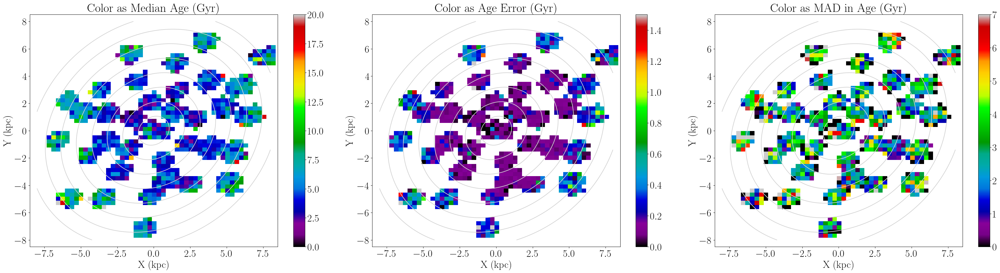

In [113]:
plt.figure(figsize=[36,10])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))

plt.subplot(131)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20.)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Median Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.subplot(133)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],mad,bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=7)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as MAD in Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.subplot(132)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE_ERR'],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=1.5)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Age Error (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()
# plt.savefig('lmc_raw_age_map_sf2.png',dpi=300,bbox_inches='tight')
plt.show()

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/2488839188.py:39: RuntimeWarning: invalid value encountered in true_divide
  im = plt.imshow(age_mass_wgt.statistic.T/mass_wgt.statistic.T, origin='lower',


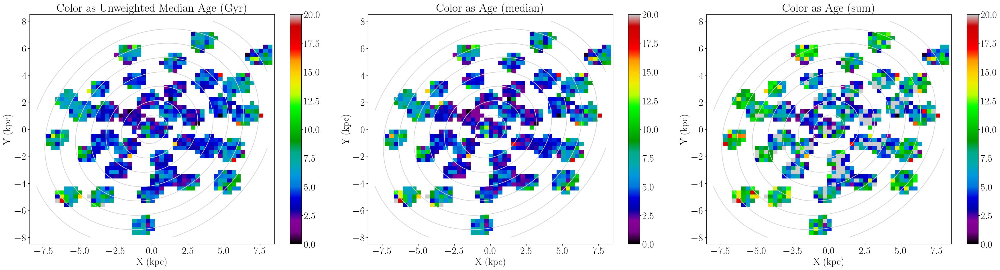

In [114]:
plt.figure(figsize=[36,10])
plt.subplot(131)
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20.)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Unweighted Median Age (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.subplot(132)
age_mass_wgt = binned_statistic_2d(lmcx, lmcy, np.multiply(agetab['AGE'],select_results['stellarmass']),'median',bins=50)
mass_wgt = binned_statistic_2d(lmcx, lmcy, select_results['stellarmass'],'median',bins=50)

CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
im = plt.imshow(age_mass_wgt.statistic.T/mass_wgt.statistic.T, origin='lower',
                    extent=[age_mass_wgt.x_edge[0],age_mass_wgt.x_edge[-1],age_mass_wgt.y_edge[0],age_mass_wgt.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Age (median)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.subplot(133)
age_mass_wgt = binned_statistic_2d(lmcx, lmcy, np.multiply(agetab['AGE'],select_results['stellarmass']),'sum',bins=50)
mass_wgt = binned_statistic_2d(lmcx, lmcy, select_results['stellarmass'],'sum',bins=50)

CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
im = plt.imshow(age_mass_wgt.statistic.T/mass_wgt.statistic.T, origin='lower',
                    extent=[age_mass_wgt.x_edge[0],age_mass_wgt.x_edge[-1],age_mass_wgt.y_edge[0],age_mass_wgt.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Age (sum)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')

plt.tight_layout()

In [115]:
# plt.figure(figsize=[24,10])

# xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))

# plt.subplot(121)
# CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
# ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],'median',bins=50)
# im = plt.imshow(ret.statistic.T, origin='lower',
#                     extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#                     aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=20.)
# plt.colorbar()

# plt.xlim(-8.5,8.5)
# plt.ylim(-8.5,8.5)

# plt.title(r'Color as Median Age (Gyr)')
# plt.xlabel(r'X (kpc)')
# plt.ylabel(r'Y (kpc)')

# plt.subplot(122)
# CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')
# ret = binned_statistic_2d(lmcx,lmcy,agetab['AGE'],mad,bins=50)
# im = plt.imshow(ret.statistic.T, origin='lower',
#                     extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#                     aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=7)
# plt.colorbar()

# # H, xedges, yedges = np.histogram2d(lmcx,lmcy,agetab['AGE'],bins=(xedges, yedges))

# plt.xlim(-8.5,8.5)
# plt.ylim(-8.5,8.5)

# plt.title(r'Color as Age (Gyr)')
# plt.xlabel(r'X (kpc)')
# plt.ylabel(r'Y (kpc)')

# plt.tight_layout()
# # plt.savefig('lmc_raw_age_map.png',dpi=300,bbox_inches='tight')
# plt.show()

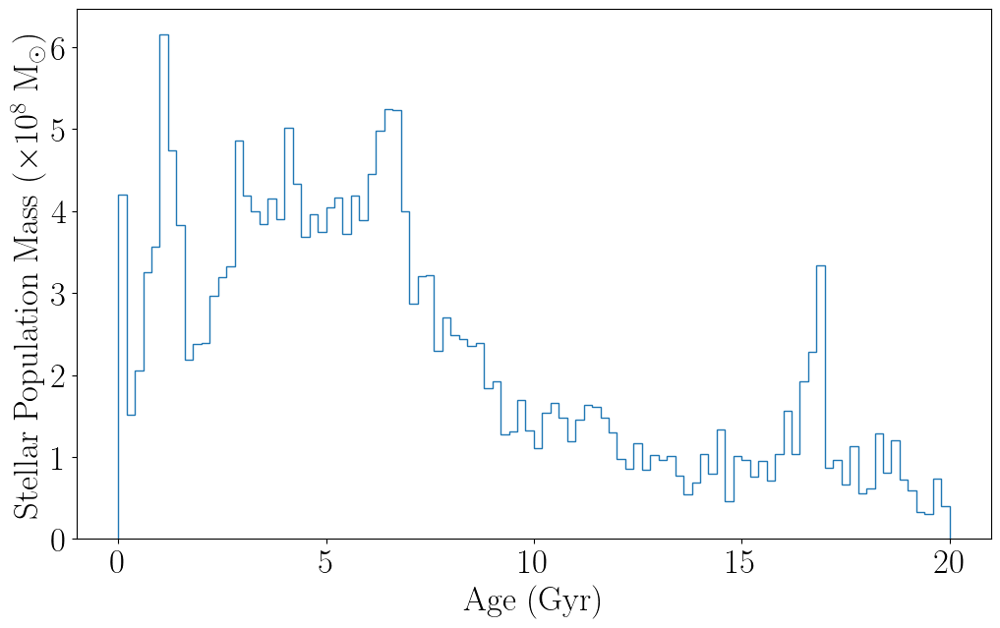

In [116]:
plt.figure(figsize=[12,7])
plt.hist(agetab['AGE'],weights=select_results['stellarmass']/10**8,range=(0,20),bins=100,histtype='step')
# plt.yscale('log')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Stellar Population Mass ($\times 10^8$ M$_\odot$)')
plt.savefig('age_stellarpopmass_sf2.png',bbox_inches='tight')
plt.show()

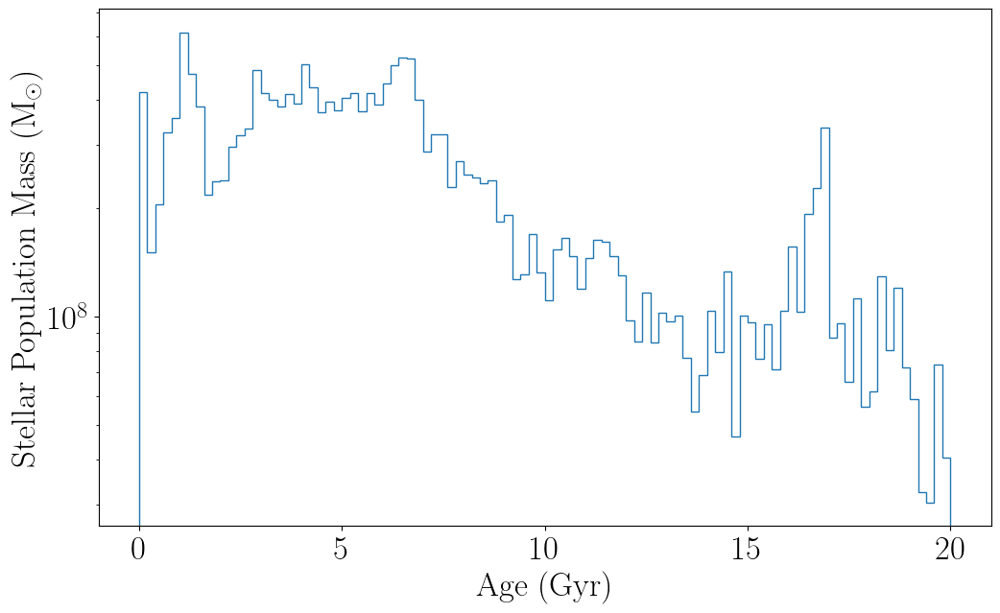

In [117]:
plt.figure(figsize=[12,7])
plt.hist(agetab['AGE'],weights=select_results['stellarmass'],range=(0,20),bins=100,histtype='step')
plt.yscale('log')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Stellar Population Mass (M$_\odot$)')
plt.savefig('age_stellarpopmass_sf2.png',bbox_inches='tight')
plt.show()

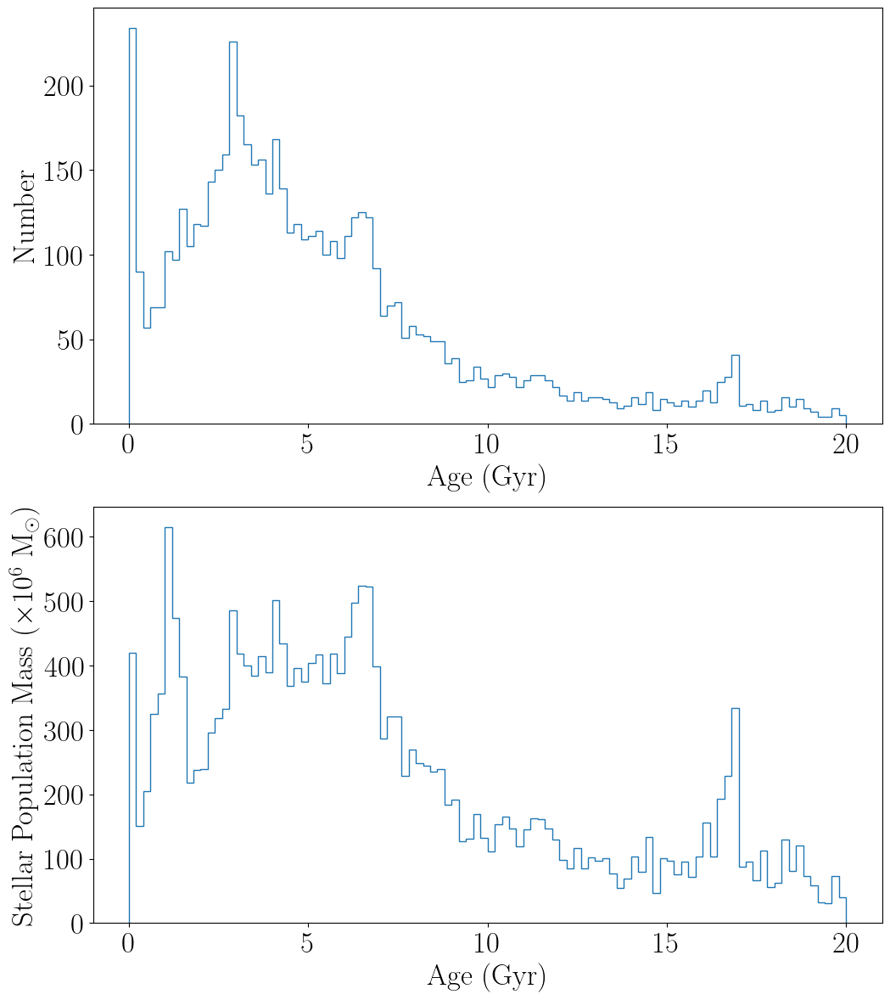

In [118]:
plt.figure(figsize=[12,14])
plt.subplot(211)
plt.hist(agetab['AGE'],range=(0,20),bins=100,histtype='step')
# plt.yscale('log')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Number')

plt.subplot(212)
plt.hist(agetab['AGE'],weights=select_results['stellarmass']/10**6,range=(0,20),bins=100,histtype='step')
# plt.yscale('log')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Stellar Population Mass ($\times 10^6$ M$_\odot$)')
plt.savefig('age_hist_sf2.png',bbox_inches='tight')
plt.show()

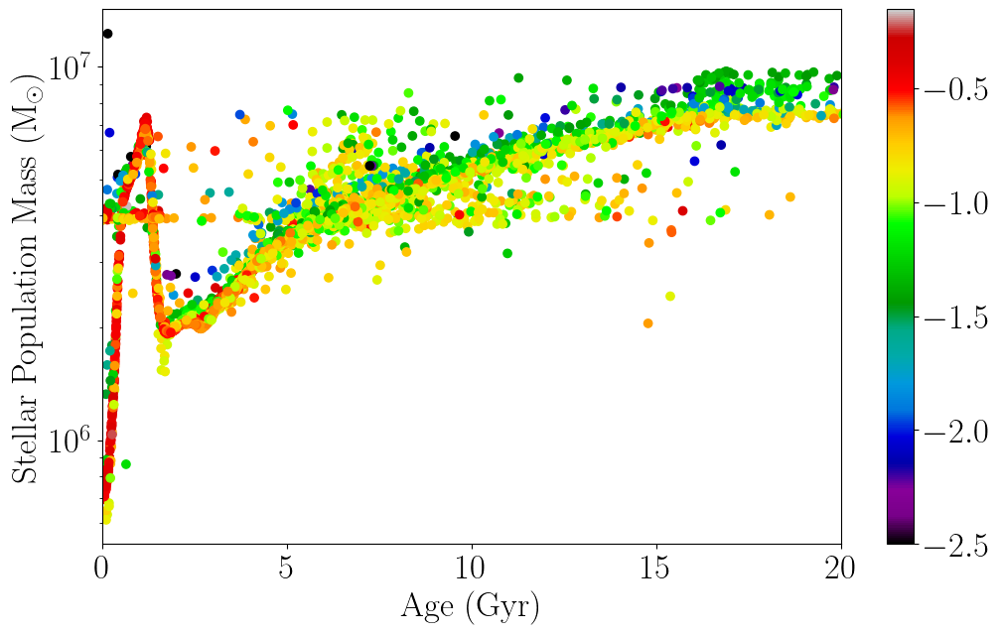

In [119]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],select_results['stellarmass'],c=lmcdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.xlim(0,20)
plt.yscale('log')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Stellar Population Mass (M$_\odot$)')
plt.savefig('age_stellarpopmass_scatter_sf2.png',bbox_inches='tight')
plt.show()

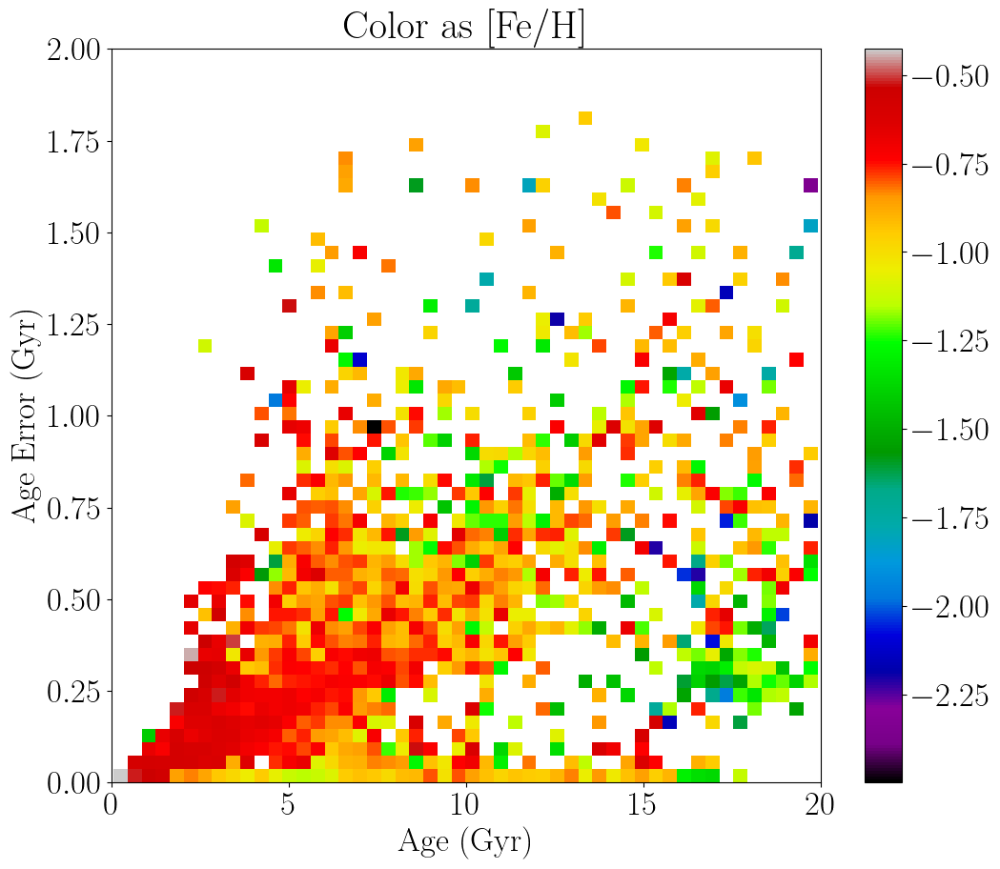

In [120]:
plt.figure(figsize=[12,10])
cut, = np.where((agetab['AGE']<=20)&(agetab['AGE_ERR']<=2)&
                (np.isfinite(agetab['AGE'])==True)&(np.isfinite(agetab['AGE_ERR'])==True))
ret = binned_statistic_2d(agetab['AGE'][cut],agetab['AGE_ERR'][cut],lmcdr17['FE_H'][cut],'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')
# plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c=lmcdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,2)
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')
plt.show()

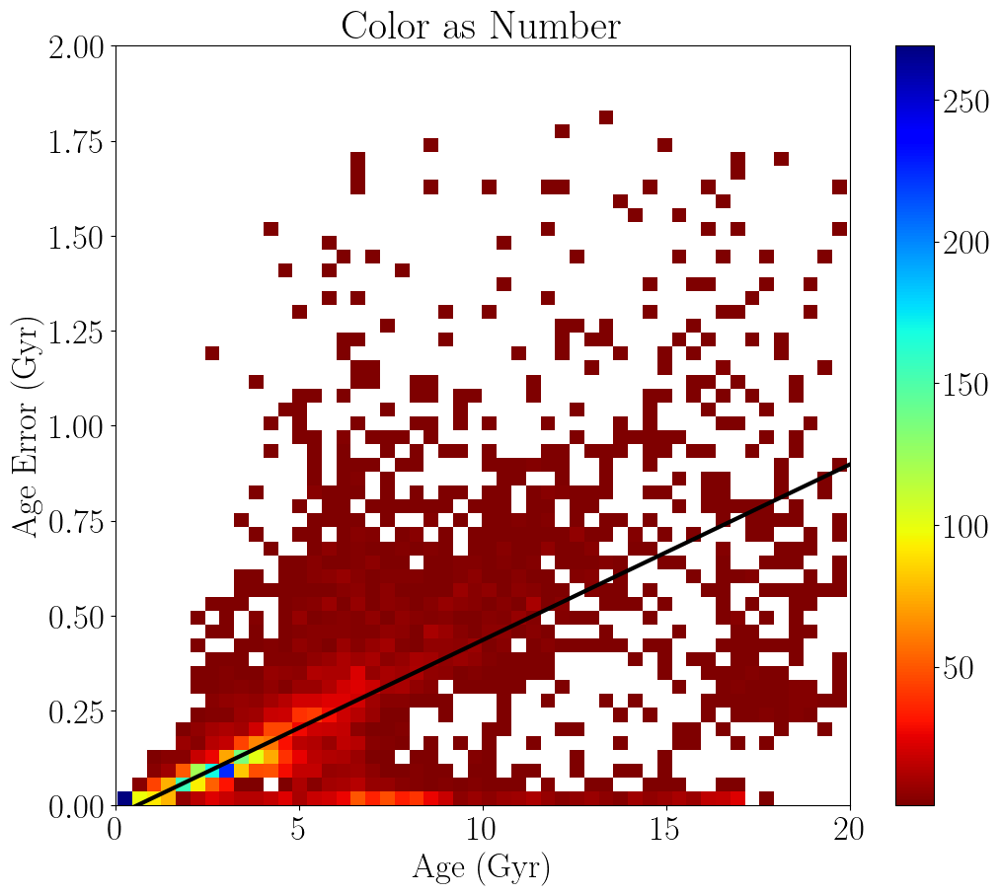

In [121]:
plt.figure(figsize=[12,10])
cut, = np.where((agetab['AGE']<=20)&(agetab['AGE_ERR']<=2)&
                (np.isfinite(agetab['AGE'])==True)&(np.isfinite(agetab['AGE_ERR'])==True))
ret = binned_statistic_2d(agetab['AGE'][cut],agetab['AGE_ERR'][cut],agetab['AGE'][cut],'count',bins=50)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='jet_r')
# plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c=lmcdr17['FE_H'],cmap='nipy_spectral')

p_age_err = np.poly1d(robust.polyfit(agetab['AGE'][cut],agetab['AGE_ERR'][cut],1))
plt.plot(np.linspace(0,20),p_age_err(np.linspace(0,20)),c='k',lw=3.0)

plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,2)
plt.title(r'Color as Number')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')
plt.show()

(array([36.73585895,  4.71981057,  4.79847408,  3.14654038,  2.12391476,
         2.59589581,  5.89976321, 10.38358326, 13.2154696 , 16.44067349]),
 array([1.82569101e-06, 9.99583088e-03, 1.99898361e-02, 2.99838412e-02,
        3.99778464e-02, 4.99718516e-02, 5.99658568e-02, 6.99598620e-02,
        7.99538672e-02, 8.99478724e-02, 9.99418775e-02]),
 <BarContainer object of 10 artists>)

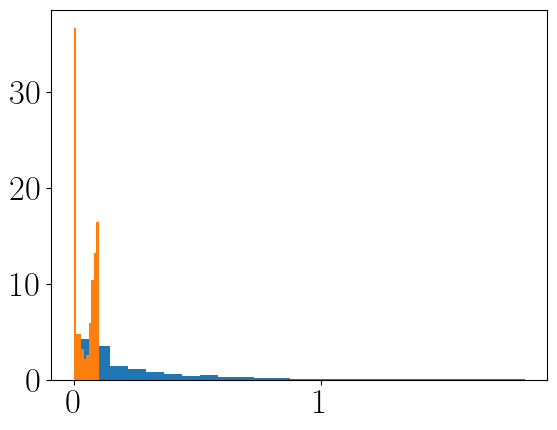

In [122]:
bad_err = np.where((agetab['AGE'][cut]>2.5)&(agetab['AGE_ERR'][cut]<0.1))
good_err = np.where((agetab['AGE'][cut]>2.5)&(agetab['AGE_ERR'][cut]<0.1))

plt.hist(agetab['AGE_ERR'][cut],bins=25,density=True)
plt.hist(agetab['AGE_ERR'][cut][bad_err],bins=10,density=True)

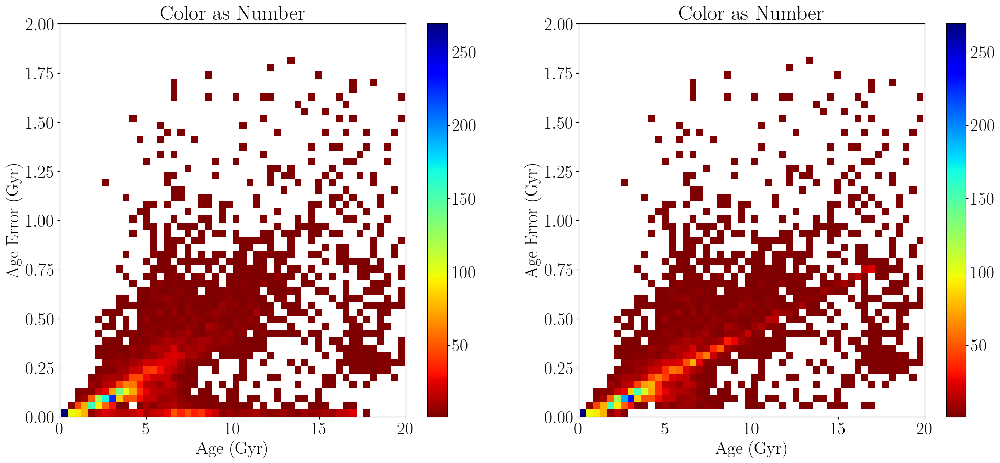

In [123]:
new_err = np.copy(agetab['AGE_ERR'])

for i in range(len(agetab)):
    if (agetab['AGE'][i]>2.5)&(agetab['AGE_ERR'][i]<0.05):
        new_err[i] = p_age_err(agetab['AGE'][i])


plt.figure(figsize=[24,10])
cut, = np.where((agetab['AGE']<=20)&(agetab['AGE_ERR']<=2)&
                (np.isfinite(agetab['AGE'])==True)&(np.isfinite(agetab['AGE_ERR'])==True))
plt.subplot(121)
ret = binned_statistic_2d(agetab['AGE'][cut],agetab['AGE_ERR'][cut],agetab['AGE'][cut],'count',bins=50)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='jet_r')
# plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c=lmcdr17['FE_H'],cmap='nipy_spectral')

p_age_err = np.poly1d(robust.polyfit(agetab['AGE'][cut],agetab['AGE_ERR'][cut],1))
# plt.plot(np.linspace(0,20),p_age_err(np.linspace(0,20)),c='k',lw=3.0)

plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,2)
plt.title(r'Color as Number')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')

plt.subplot(122)
cut2, = np.where((agetab['AGE']<=20)&(new_err<=2)&
                (np.isfinite(agetab['AGE'])==True)&(np.isfinite(new_err)==True))

ret = binned_statistic_2d(agetab['AGE'][cut2],new_err[cut2],agetab['AGE'][cut2],'count',bins=50)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='jet_r')
# plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c=lmcdr17['FE_H'],cmap='nipy_spectral')

# p_age_err = np.poly1d(robust.polyfit(agetab['AGE'][cut],agetab['AGE_ERR'][cut],1))
# plt.plot(np.linspace(0,20),p_age_err(np.linspace(0,20)),c='k',lw=3.0)

plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,2)
plt.title(r'Color as Number')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')
plt.show()

In [124]:
p_age_err(20)

0.8980833952914516

In [125]:
print(p_age_err)

 
0.04624 x - 0.02678


(array([1251., 1458.,  668.,  620.,  466.,  252.,  234.,  184.,  157.,
         136.,   65.,   50.,   40.,   28.,   20.,   22.,   20.,   17.,
          15.,    9.,   18.,    5.,    5.,    2.,    0.]),
 array([0.  , 0.08, 0.16, 0.24, 0.32, 0.4 , 0.48, 0.56, 0.64, 0.72, 0.8 ,
        0.88, 0.96, 1.04, 1.12, 1.2 , 1.28, 1.36, 1.44, 1.52, 1.6 , 1.68,
        1.76, 1.84, 1.92, 2.  ]),
 <BarContainer object of 25 artists>)

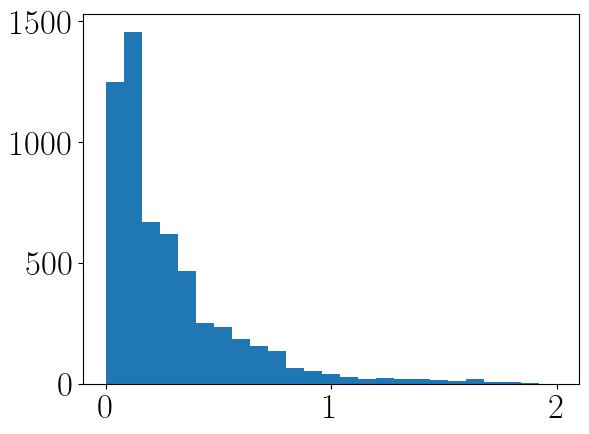

In [126]:
plt.hist(new_err,bins=25,range=(0,2))

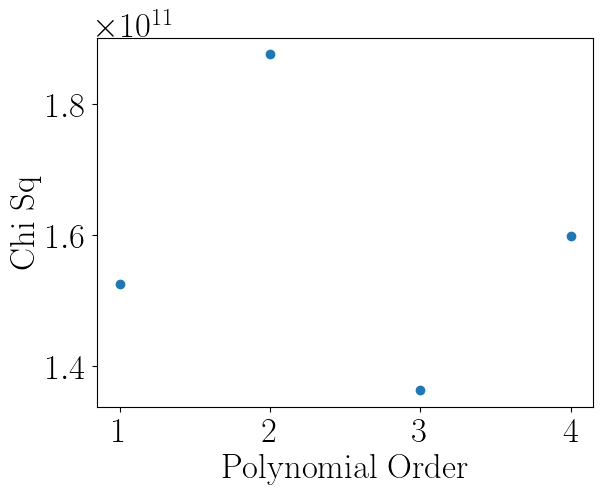

In [160]:
chi_sq = []

sidx = np.argsort(agetab['AGE'][agecut])
for i in range(5)[1:]:
    
    p = np.poly1d(robust.polyfit(agetab['AGE'][agecut][sidx],agetab['AGE_ERR'][agecut][sidx],i))
    
    chi_sq.append(sum(np.square(np.divide(agetab['AGE_ERR'][agecut][sidx]-p(agetab['AGE'][agecut][sidx]),agetab['AGE_ERR'][agecut][sidx]))))
chi_sq = np.array(chi_sq)
    
plt.scatter(range(5)[1:],chi_sq)
plt.xlabel(r'Polynomial Order')
plt.ylabel(r'Chi Sq')
# plt.savefig(r'chisq_age_radius_polyfit.png',bbox_inches='tight')
plt.show()

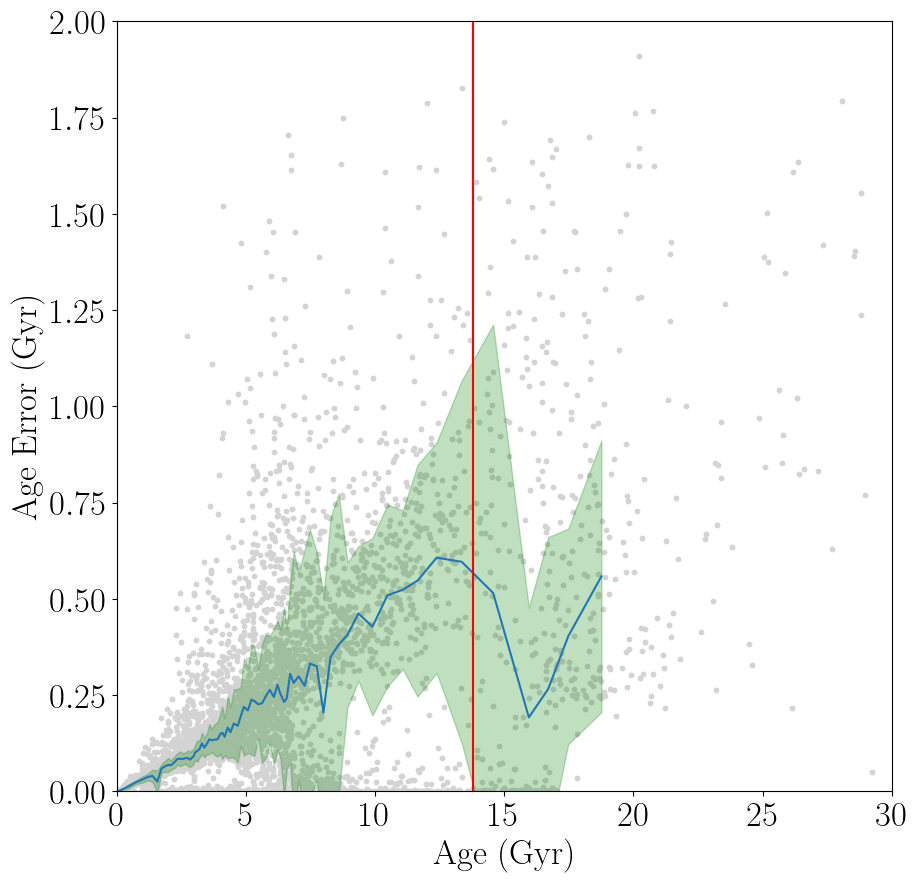

In [162]:
sidx = np.argsort(agetab['AGE'][agecut])

nbins = 75
chunks = np.array_split(sidx, len(sidx)/nbins)

binned_age_ = 999999.0*np.ones(len(chunks))
binned_age_mad_ = 999999.0*np.ones(len(chunks))
binned_age_err_ = 999999.0*np.ones(len(chunks))
binned_age_err_mad_ = 999999.0*np.ones(len(chunks))

for i in range(len(chunks)):

    binned_age_[i] = np.nanmedian(agetab['AGE'][agecut][chunks[i]])
    binned_age_mad_[i] = mad(agetab['AGE'][agecut][chunks[i]])
    binned_age_err_[i] = np.nanmedian(agetab['AGE_ERR'][agecut][chunks[i]])
    binned_age_err_mad_[i] = mad(agetab['AGE_ERR'][agecut][chunks[i]])
    
plt.figure(figsize=[10,10])
plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c='lightgrey',s=10)
plt.plot(binned_age_,binned_age_err_)
plt.fill_between(binned_age_,binned_age_err_+binned_age_err_mad_,binned_age_err_-binned_age_err_mad_,
                 alpha=0.25,color='green')
plt.axvline(13.787,c='r')
plt.xlim(0,30)
plt.ylim(0,2)

plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')
plt.show()

In [163]:
binned_age_

array([ 0.06168426,  0.11456448,  0.26475746,  0.43979115,  0.73848645,
        1.01593464,  1.19116868,  1.38338012,  1.56824919,  1.72835981,
        1.85935607,  1.98635315,  2.1045501 ,  2.24347387,  2.33704656,
        2.44669385,  2.56331281,  2.66033359,  2.75725692,  2.83526916,
        2.91048406,  2.96784118,  3.03175765,  3.11620281,  3.20163319,
        3.29342344,  3.38696641,  3.49479961,  3.581266  ,  3.67510642,
        3.770579  ,  3.90423925,  3.99781779,  4.08106424,  4.17470011,
        4.294404  ,  4.39977431,  4.52873552,  4.68168206,  4.79420222,
        4.91835053,  5.07494948,  5.20894275,  5.32484461,  5.47477565,
        5.62477332,  5.7747246 ,  5.91952822,  6.08023933,  6.21786164,
        6.33340198,  6.47466957,  6.57483758,  6.70899067,  6.84701623,
        7.03760307,  7.27127919,  7.47911546,  7.73905528,  7.99850093,
        8.27274781,  8.58685094,  8.93178012,  9.35264126,  9.89472557,
       10.47420766, 11.07130217, 11.64029055, 12.3802078 , 13.34

In [164]:
binned_age_err_

array([0.00184098, 0.00236141, 0.00702461, 0.01268856, 0.02385859,
       0.03176428, 0.03726435, 0.04035648, 0.02549039, 0.05947721,
       0.06499509, 0.06882849, 0.06834968, 0.07659899, 0.08413076,
       0.08484077, 0.08430175, 0.08658709, 0.0863988 , 0.0825893 ,
       0.08780283, 0.0905146 , 0.10184026, 0.10494439, 0.11012777,
       0.12466574, 0.11381859, 0.12466814, 0.13573826, 0.13267479,
       0.13423588, 0.13567939, 0.14874658, 0.15249846, 0.14186876,
       0.16602088, 0.1537491 , 0.17643208, 0.17057252, 0.19503157,
       0.21963251, 0.21035556, 0.23847254, 0.23487023, 0.22645348,
       0.22925971, 0.24813389, 0.26404476, 0.24513131, 0.27674155,
       0.25300652, 0.23254274, 0.24124022, 0.30534244, 0.28178278,
       0.29876253, 0.27431808, 0.33212711, 0.32524745, 0.20491889,
       0.3490232 , 0.38096148, 0.40693492, 0.46231574, 0.42783414,
       0.50911387, 0.523907  , 0.54747735, 0.60725019, 0.59649069,
       0.51549764, 0.19242611, 0.26629335, 0.40258649, 0.55865

In [165]:
cubic_star_age_err = np.poly1d(robust.polyfit(binned_age_[binned_age_<=13.787],binned_age_err_[binned_age_<=13.787],3))
cubic_star_age_err

poly1d([-0.00016958,  0.00397949,  0.02337042,  0.00147539])

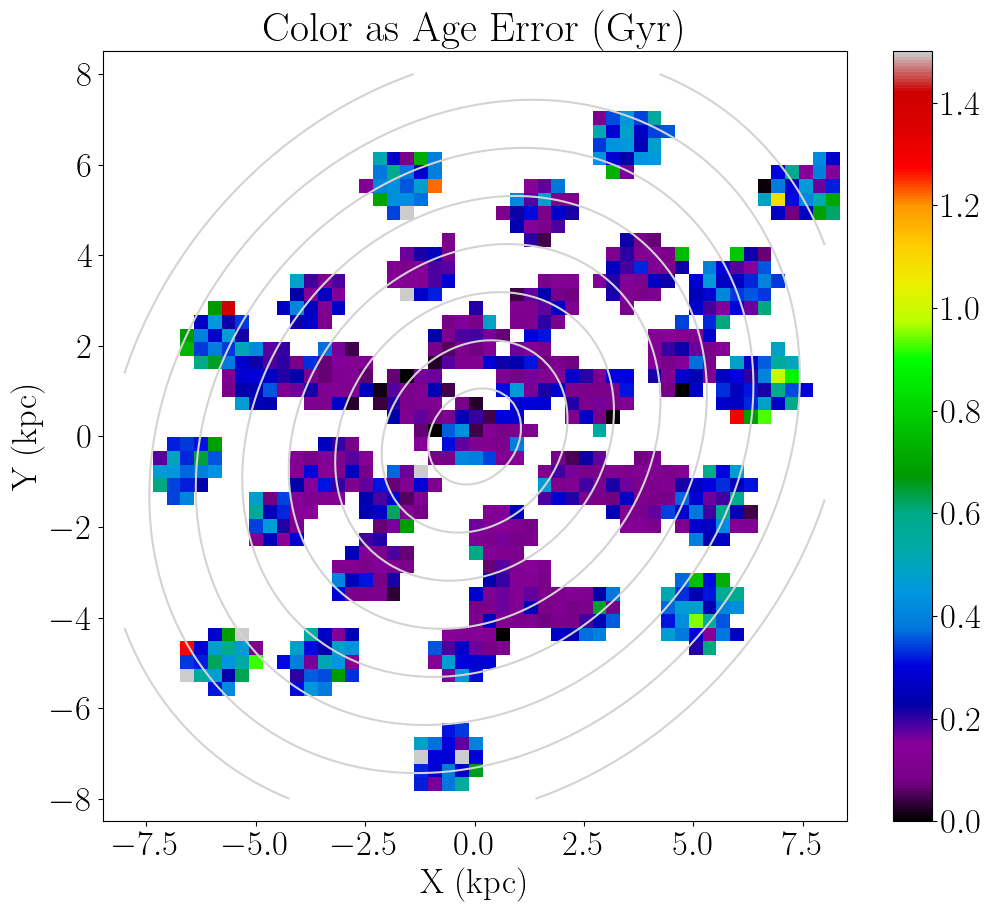

In [166]:
plt.figure(figsize=[12,10])

xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
CS = plt.contour(xx,yy,elliptical_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='lightgrey')

ret = binned_statistic_2d(lmcx,lmcy,new_err,'median',bins=50)
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=0,vmax=1.5)
plt.colorbar()

plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

plt.title(r'Color as Age Error (Gyr)')
plt.xlabel(r'X (kpc)')
plt.ylabel(r'Y (kpc)')
# plt.savefig('lmc_map_distance.png',dpi=300,bbox_inches='tight')
plt.show()

(-8.5, 8.5)

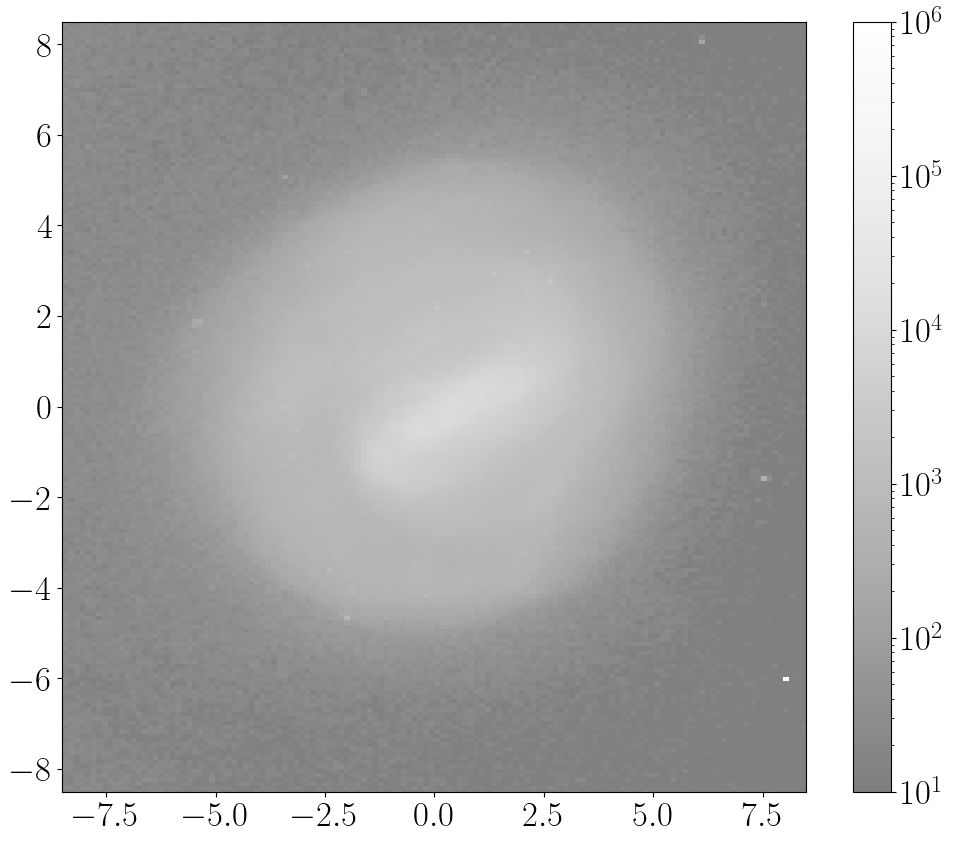

In [167]:
ret = binned_statistic_2d(gaiax,gaiay,gaiax,'count',bins=1000)
ret.statistic[ret.statistic==0] = np.nan

plt.figure(figsize=[12,10])
im  = plt.imshow(ret.statistic.T, origin='lower',
             extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
             aspect='auto',interpolation='nearest',cmap='Greys_r',alpha=0.5,norm=LogNorm(vmin=10**1,vmax=10**6))
plt.colorbar()
plt.xlim(-8.5,8.5)
plt.ylim(-8.5,8.5)

In [168]:
np.nanmax(lmcdr17['LMCRAD'])

11.097992

In [169]:
# fig, ax = plt.subplots(1,2,figsize=[24,10])

# xx,yy = np.meshgrid(np.linspace(-8,8,100),np.linspace(-8,8,100))
# CS = ax[0].contour(xx,yy,superellipse_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='k')
# #ax[0].clabel(CS,colors='k',fontsize=25,manual=locations)

# # fmt = {}
# # strs = ['1', '2', '3', '4', '5', '6', '7']
# # for l, s in zip(CS.levels, strs):
# #     fmt[l] = s
# # ax[0].clabel(CS, CS.levels[::2], inline=True, fmt=fmt, fontsize=10, manual=locations)

# CS = ax[1].contour(xx,yy,superellipse_radius(xx,yy),levels=[1,2,3,4,5,6,7,8],colors='k')
# #ax[1].clabel(CS,colors='k',fontsize=25,manual=locations)

# # for i in range(len(clabx)):
# #     ax[0].text(clabx[i]*(1+0.01),0.0,'{}'.format(i+1))

# plt.xlim(-8.5,8.5)
# plt.ylim(-8.5,8.5)

# # set bounds for the plot
# for i in range(1):
#     ax[i].set_xlim(-9,9)
#     ax[i].set_ylim(-9,9)
#     ax[i].set_xlabel(r'X (kpc)')
#     ax[i].set_ylabel(r'Y (kpc)')

#     ax[i].set_xticks([-8,-4.0,0,4.0,8])
#     ax[i].set_yticks([-8,-4.0,0,4.0,8])

# # convert 0.8 deg diameter to points and calculate the marker size
# r = 49.9*np.tan(np.radians(0.8/2)) #0.8
# r_ = ax[0].transData.transform([r,0])[0] - ax[0].transData.transform([0,0])[0]
# marker_size = np.pi * r_**2

# pl = ax[0].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=med_fld_age,edgecolors='k',cmap='copper_r',vmax=13.787)
# plt.colorbar(pl,ax=ax[0])
# pl = ax[1].scatter(cen_xy[:,0],cen_xy[:,1],s=marker_size,c=fld_wgt_avg,edgecolors='k',cmap='copper_r',vmax=13.787)
# plt.colorbar(pl,ax=ax[1])

# ax[0].set_title(r'Raw Median Field Age')
# ax[1].set_title(r'Corrected Median Field Age')

# ax[1].set_xlabel(r'X (kpc)')
# ax[1].set_ylabel(r'Y (kpc)')

# plt.tight_layout()
# plt.show()

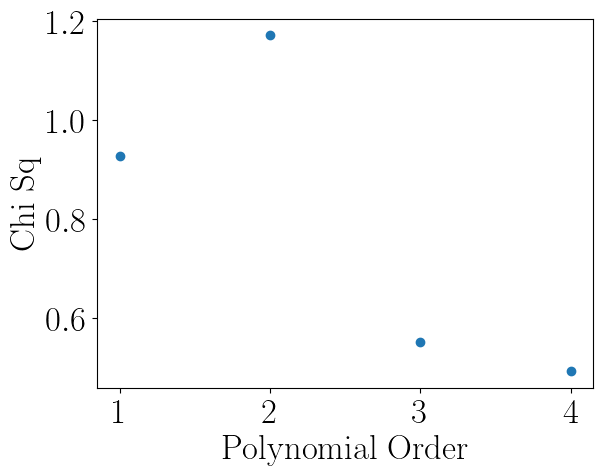

In [170]:
chi_sq = []

sidx = np.argsort(fld_radius)
for i in range(5)[1:]:
    
    p = np.poly1d(robust.polyfit(fld_radius[sidx],fld_wgt_avg[sidx],i))
    
    chi_sq.append(sum(np.square(np.divide(fld_wgt_avg[sidx]-p(fld_radius[sidx]),fld_wgt_avg[sidx])))) #/(len(fld_radius[:-1]-(i+1))))
    
chi_sq = np.array(chi_sq)
    
plt.scatter(range(5)[1:],chi_sq)
plt.xlabel(r'Polynomial Order')
plt.ylabel(r'Chi Sq')
# plt.savefig(r'chisq_age_radius_polyfit.png',bbox_inches='tight')
plt.show()

Raw:          4          3         2
-0.0221 x + 0.2865 x - 1.009 x + 0.9739 x + 3.778
Corr:           4          3         2
-0.03159 x + 0.4015 x - 1.443 x + 1.603 x + 5.452


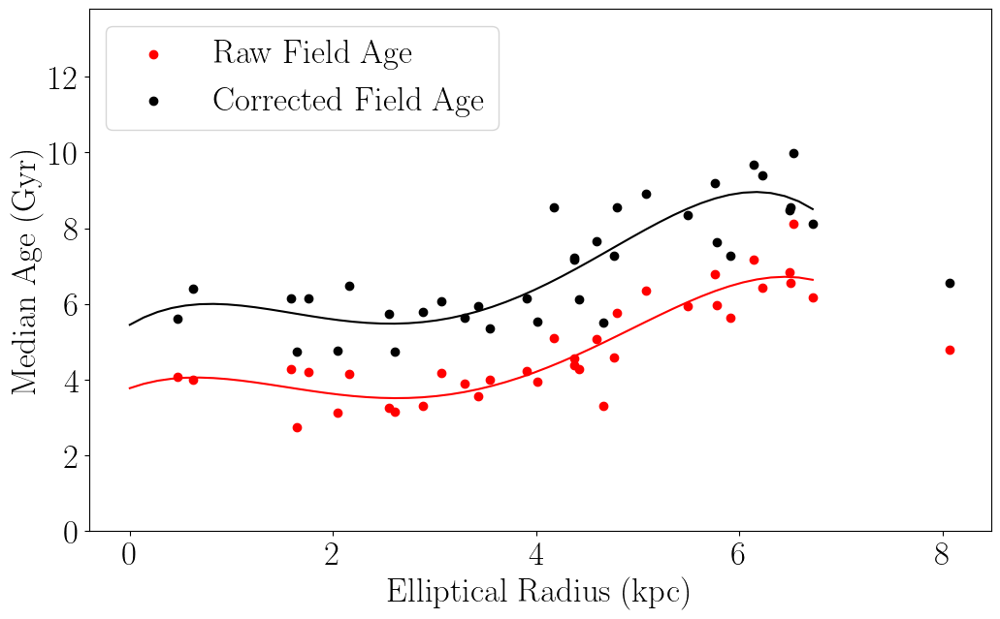

In [171]:
plt.figure(figsize=[12,7])
age_xs = np.linspace(0,max(fld_radius[fld_radius<8]))

plt.plot(age_xs,p_raw(age_xs),c='r')
plt.scatter(fld_radius,med_fld_age,c='r',label='Raw Field Age')

p_corr = np.poly1d(robust.polyfit(fld_radius[fld_radius<8],fld_wgt_avg[fld_radius<8],4))
plt.plot(age_xs,p_corr(age_xs),c='k')
plt.scatter(fld_radius,fld_wgt_avg,c='k',label='Corrected Field Age')

plt.legend(loc='upper left')

plt.ylim(0.,13.787)

plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Median Age (Gyr)')

print('Raw:', p_raw)
print('Corr:', p_corr)

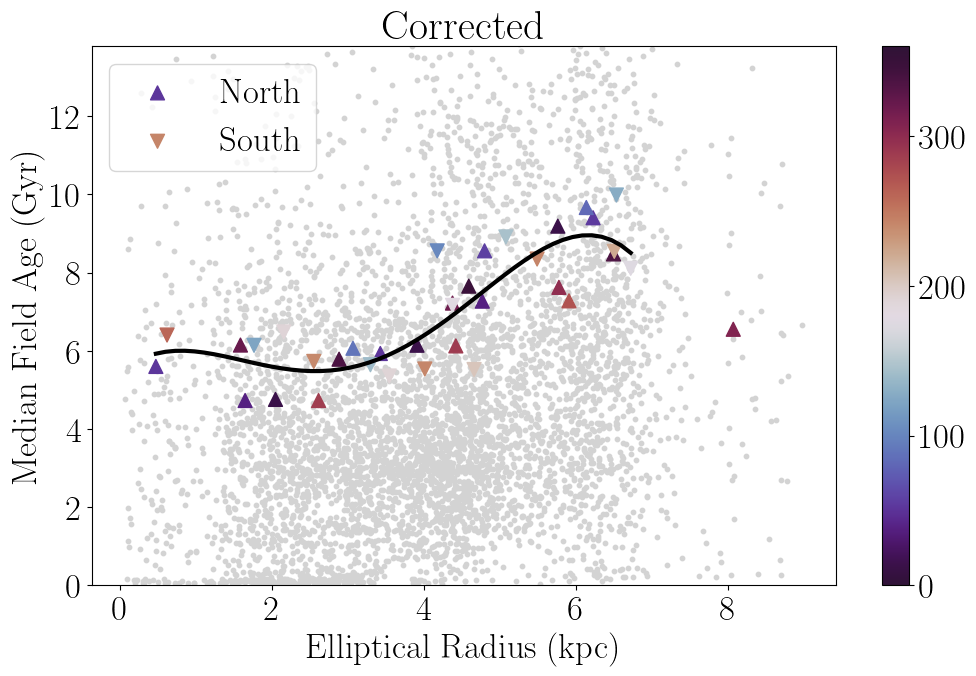

In [172]:
plt.figure(figsize=[12,7])
plt.scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
plt.scatter(fld_radius[north_fld],fld_wgt_avg[north_fld],marker='^',c=fld_pa[north_fld],s=100,label='North',cmap='twilight_shifted',vmin=0,vmax=360)
plt.scatter(fld_radius[south_fld],fld_wgt_avg[south_fld],marker='v',c=fld_pa[south_fld],s=100,label='South',cmap='twilight_shifted',vmin=0,vmax=360)
plt.colorbar()
plt.legend()
xs_rads = np.linspace(min(fld_radius[np.argsort(fld_radius)][:-1]),max(fld_radius[np.argsort(fld_radius)][:-1]))
plt.plot(xs_rads,p_corr(xs_rads),c='k',lw=3)
plt.ylim(0,13.787)
plt.title(r'Corrected')
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Median Field Age (Gyr)')
# plt.savefig('lmc_fld_age_radius_w_poly.png',bbox_inches='tight')
plt.show()

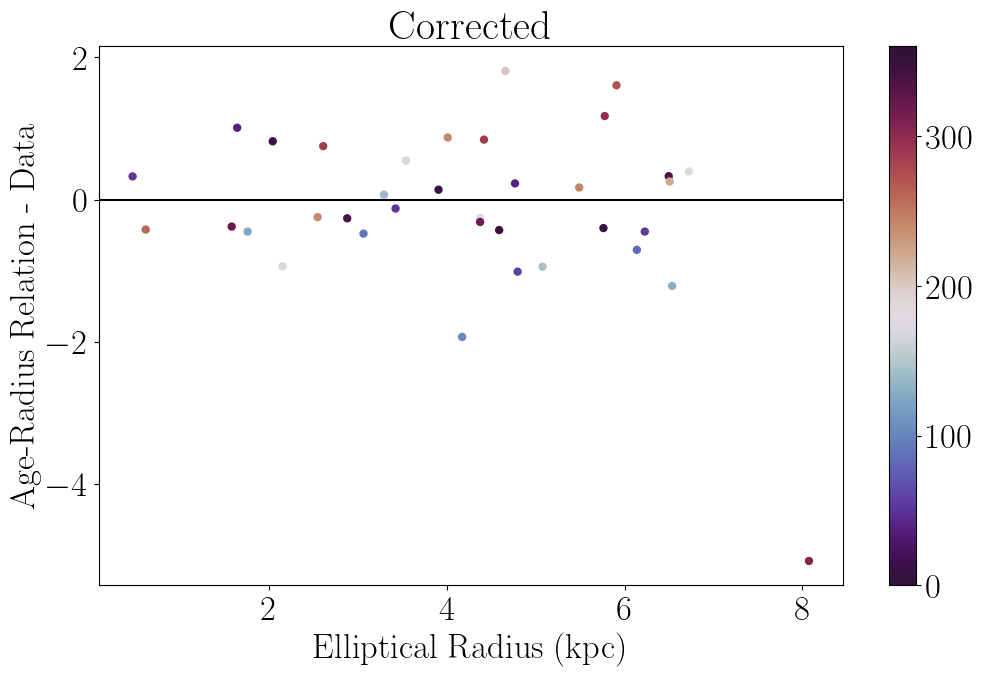

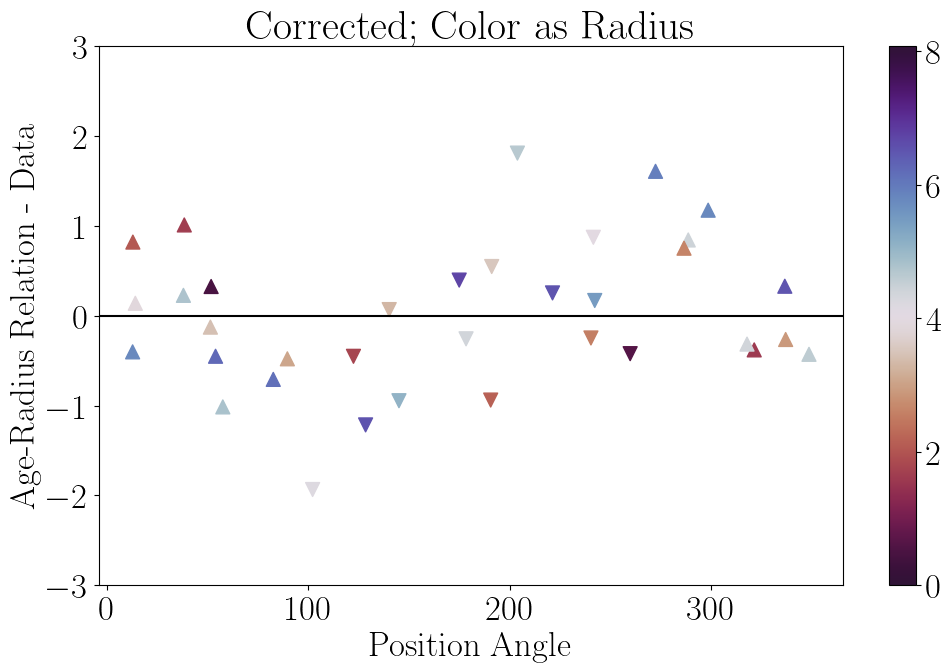

In [173]:
corr_res_fld_age = p_corr(fld_radius)-fld_wgt_avg

plt.figure(figsize=[12,7])
plt.scatter(fld_radius,corr_res_fld_age,c=fld_pa,marker='.',s=100,cmap='twilight_shifted',vmin=0,vmax=360)
plt.colorbar()
plt.axhline(0.0,c='k')

plt.title(r'Corrected')
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Age-Radius Relation - Data')
plt.show()

plt.figure(figsize=[12,7])
plt.scatter(fld_pa[north_fld],corr_res_fld_age[north_fld],c=fld_radius[north_fld],marker='^',s=100,cmap='twilight_shifted_r',vmin=0,vmax=max(fld_radius),label='North')
plt.scatter(fld_pa[south_fld],corr_res_fld_age[south_fld],c=fld_radius[south_fld],marker='v',s=100,cmap='twilight_shifted_r',vmin=0,vmax=max(fld_radius),label='South')
plt.colorbar()
# plt.legend()
plt.axhline(0.0,c='k')
plt.ylim(-3,3)
plt.title(r'Corrected; Color as Radius')
plt.xlabel(r'Position Angle')
plt.ylabel(r'Age-Radius Relation - Data')
plt.show()

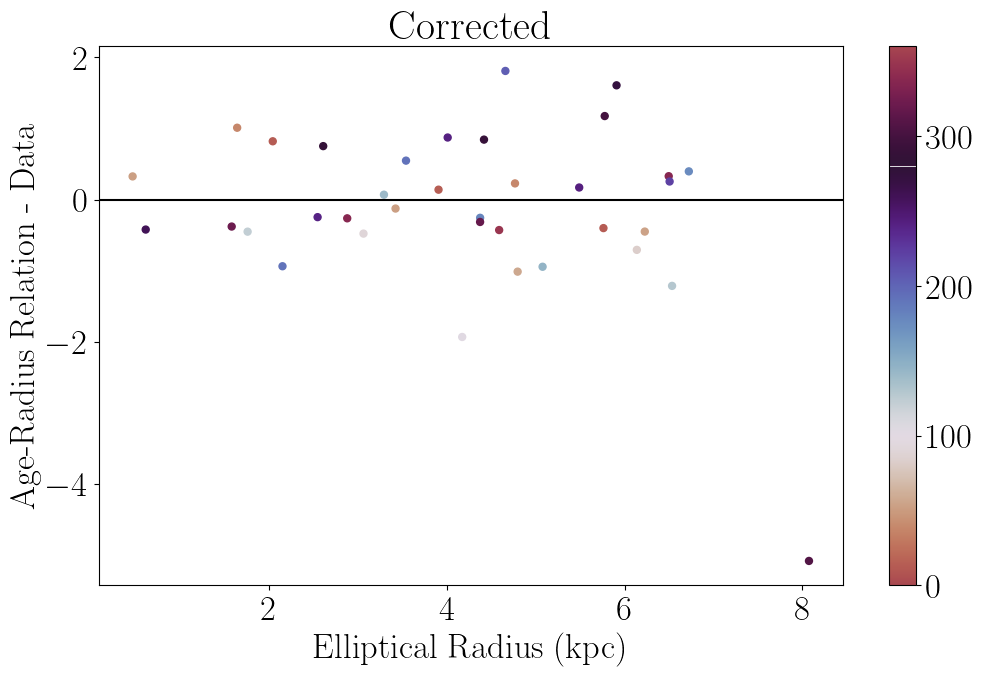

In [174]:
from matplotlib.colors import LinearSegmentedColormap

class roll_cmap(LinearSegmentedColormap):

    def __init__(self, cmap, shift):
        
        shift = shift/360.

        assert 0. < shift < 1.
        self.cmap = cmap
        self.N = cmap.N
        self.monochrome = self.cmap.monochrome
        self._x = np.linspace(0.0, 1.0, 255)
        self._y = np.roll(np.linspace(0.0, 1.0, 255),int(255.*shift))

    def __call__(self, xi, alpha=1.0, **kw):
        yi = np.interp(xi, self._x, self._y)
        return self.cmap(yi, alpha)
    
cmap = plt.cm.twilight_shifted_r
cmap_rolled = roll_cmap(cmap, shift=280)
    
corr_res_fld_age = p_corr(fld_radius)-fld_wgt_avg

plt.figure(figsize=[12,7])
plt.scatter(fld_radius,corr_res_fld_age,c=fld_pa,marker='.',s=100,cmap=cmap_rolled,vmin=0,vmax=360)
plt.colorbar()
plt.axhline(0.0,c='k')

plt.title(r'Corrected')
plt.xlabel(r'Elliptical Radius (kpc)')
plt.ylabel(r'Age-Radius Relation - Data')
plt.show()

In [175]:
# plt.figure(figsize=[24,14])
# plt.plot(lmcr[np.argsort(lmcr)][::-1],np.cumsum(lmcdr17['GAIAEDR3_PHOT_G_MEAN_MAG'][np.argsort(lmcr)][::-1]),c='tab:blue',label='G Elliptical')
# plt.plot(lmcr[np.argsort(lmcr)][::-1],np.cumsum(lmcdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][np.argsort(lmcr)][::-1]),c='tab:orange',label='BP Elliptical')
# plt.plot(lmcr[np.argsort(lmcr)][::-1],np.cumsum(lmcdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][np.argsort(lmcr)][::-1]),c='tab:green',label='RP Elliptical')

# plt.plot(lmcsr[np.argsort(lmcsr)][::-1],np.cumsum(lmcdr17['GAIAEDR3_PHOT_G_MEAN_MAG'][np.argsort(lmcsr)][::-1]),c='tab:blue',ls='--',label='G Superellipse')
# plt.plot(lmcsr[np.argsort(lmcsr)][::-1],np.cumsum(lmcdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][np.argsort(lmcsr)][::-1]),c='tab:orange',ls='--',label='BP Superellipse')
# plt.plot(lmcsr[np.argsort(lmcsr)][::-1],np.cumsum(lmcdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][np.argsort(lmcsr)][::-1]),c='tab:green',ls='--',label='RP Superellipse')

# plt.plot(np.sqrt(lmcx**2+lmcy**2)[np.argsort(np.sqrt(lmcx**2+lmcy**2))][::-1],
#          np.cumsum(lmcdr17['GAIAEDR3_PHOT_G_MEAN_MAG'][np.argsort(np.sqrt(lmcx**2+lmcy**2))][::-1]),c='tab:blue',ls=':',label='G Circular')
# plt.plot(np.sqrt(lmcx**2+lmcy**2)[np.argsort(np.sqrt(lmcx**2+lmcy**2))][::-1],
#          np.cumsum(lmcdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][np.argsort(np.sqrt(lmcx**2+lmcy**2))][::-1]),c='tab:orange',ls=':',label='BP Circular')
# plt.plot(np.sqrt(lmcx**2+lmcy**2)[np.argsort(np.sqrt(lmcx**2+lmcy**2))][::-1],
#          np.cumsum(lmcdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][np.argsort(np.sqrt(lmcx**2+lmcy**2))][::-1]),c='tab:green',ls=':',label='RP Circular')

# plt.legend()

# # plt.axhline(0.5*np.nanmax(np.cumsum(lmcdr17['GAIAEDR3_PHOT_G_MEAN_MAG'][np.argsort(lmcr)])))
# # plt.axvline(4.25)
# plt.xlabel(r'Radius (kpc)')
# plt.ylabel(r'Cummulative Brightness')
# plt.show()

In [176]:
# north

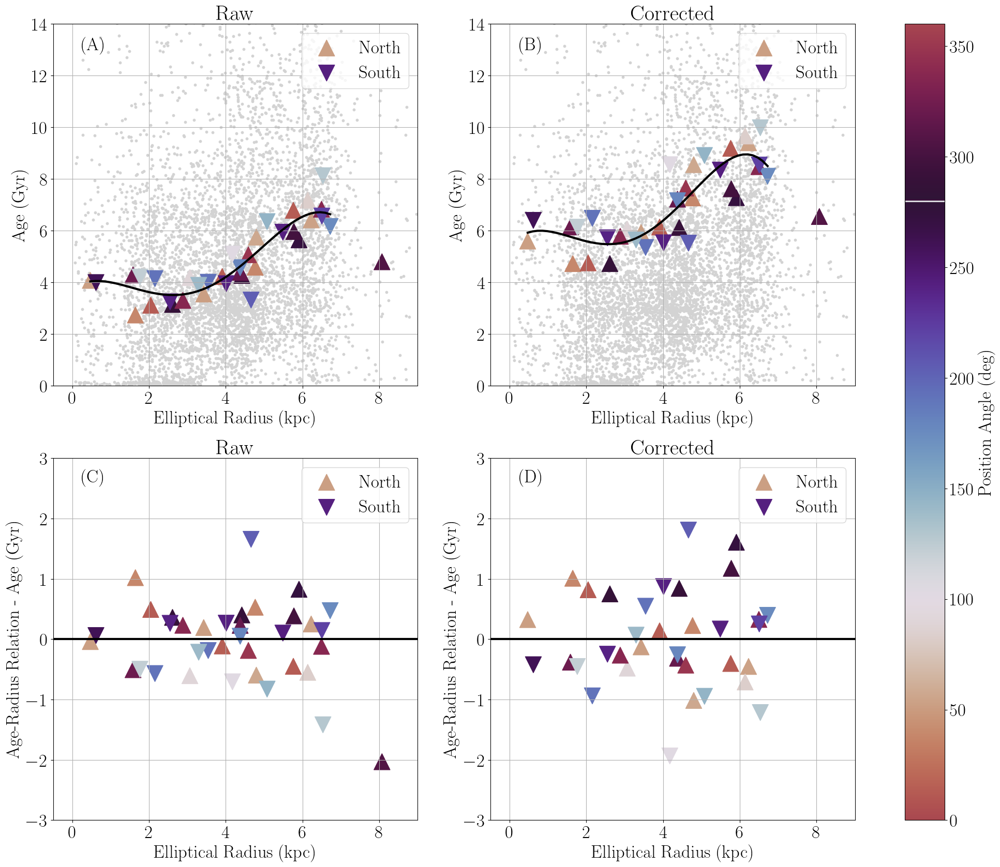

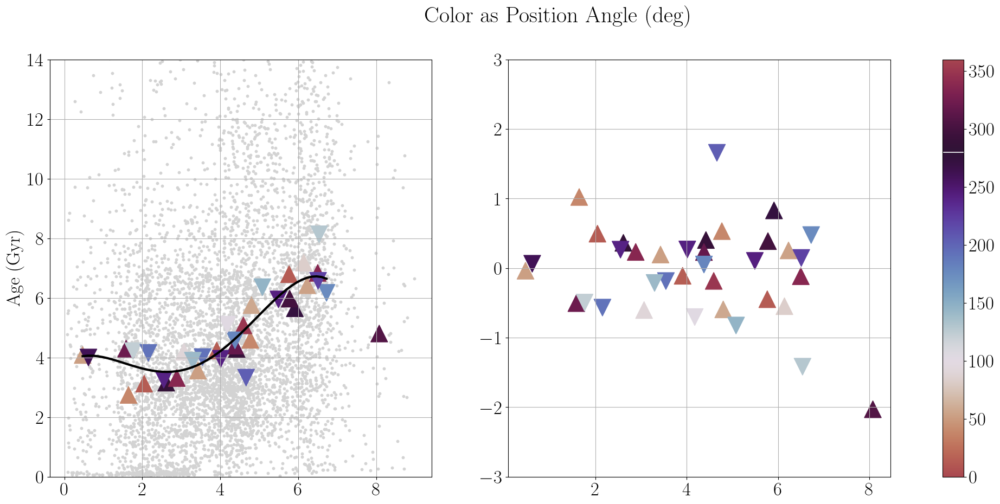

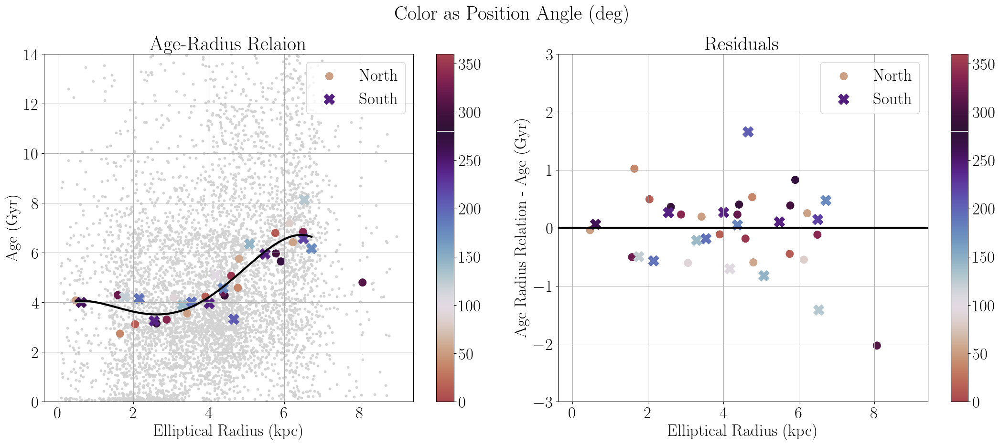

In [451]:
# radii = np.array([fld_raidus[north],])

quad_north_ys = np.array([med_fld_age[north_fld],fld_wgt_avg[north_fld],raw_res_fld_age[north_fld],
                          corr_res_fld_age[north_fld]])
quad_north_xs = np.array([fld_radius[north_fld],fld_radius[north_fld],
                          fld_radius[north_fld],fld_radius[north_fld]])
quad_north_pa = np.array([fld_pa[north_fld],fld_pa[north_fld],fld_pa[north_fld],fld_pa[north_fld]])

quad_south_ys = np.array([med_fld_age[south_fld],fld_wgt_avg[south_fld],raw_res_fld_age[south_fld],
                          corr_res_fld_age[south_fld]])
quad_south_xs = np.array([fld_radius[south_fld],fld_radius[south_fld],
                          fld_radius[south_fld],fld_radius[south_fld]])
quad_south_pa = np.array([fld_pa[south_fld],fld_pa[south_fld],fld_pa[south_fld],fld_pa[south_fld]])

labels = np.array(['A','B','C','D'])

fig,ax = plt.subplots(2,2,figsize=[25,20])
axs = ax.ravel() 

for i in range(len(ax.ravel().tolist())):
    axs[i].grid()
    
    # top plots
    if i < 2:
        axs[i].scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
        axs[i].set_ylim(0,14)#13.787)
        axs[i].set_ylabel(r'Age (Gyr)')
        axs[i].text(0.25,13,r'({})'.format(labels[i]))
        
    if i > 1:
        axs[i].set_ylim(-3,3)
        axs[i].axhline(0,c='k',lw=3.0)
        axs[i].set_ylabel(r'Age-Radius Relation - Age (Gyr)')
        axs[i].text(0.25,2.6,r'({})'.format(labels[i]))
        
    # left column
    if i in [0,2]:
        axs[i].set_title(r'Raw')
    
    # right column
    if i in [1,3]:
        axs[i].set_title(r'Corrected')
        
    axs[i].scatter(quad_north_xs[i],quad_north_ys[i],marker='^',
                          c=quad_north_pa[i],cmap=cmap_rolled,s=500,label='North',vmin=0,vmax=360)
    im = axs[i].scatter(quad_south_xs[i],quad_south_ys[i],marker='v',
                          c=quad_south_pa[i],cmap=cmap_rolled,s=500,label='South',vmin=0,vmax=360)
    
    axs[i].legend(loc='upper right')
    axs[i].set_xlabel(r'Elliptical Radius (kpc)')
    
    axs[i].set_xlim(-0.5,9)
    
axs[0].plot(xs_rads,p_raw(xs_rads),c='k',lw=3)
axs[1].plot(xs_rads,p_corr(xs_rads),c='k',lw=3)

# axs[2].scatter(lmcr,p_raw(lmcr)-agetab['AGE'],zorder=0,c='lightgrey',s=10)
# axs[3].scatter(lmcr,p_corr(lmcr)-agetab['AGE'],zorder=0,c='lightgrey',s=10)
    
plt.colorbar(im,ax=axs,label='Position Angle (deg)')
plt.savefig('lmc_age_radius_sf2.png',bbox_inches='tight')
plt.show()


#####
fig,ax = plt.subplots(1,2,figsize=[25,10])

ax[0].grid()
ax[0].scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
ax[0].set_ylim(0,14)#13.787)
ax[0].set_ylabel(r'Age (Gyr)')

ax[0].scatter(quad_north_xs[0],quad_north_ys[0],marker='^',
                          c=quad_north_pa[0],cmap=cmap_rolled,s=500,label='North',vmin=0,vmax=360)
im = ax[0].scatter(quad_south_xs[0],quad_south_ys[0],marker='v',
                          c=quad_south_pa[0],cmap=cmap_rolled,s=500,label='South',vmin=0,vmax=360)

ax[0].plot(xs_rads,p_raw(xs_rads),c='k',lw=3)

ax[1].grid()
ax[1].scatter(quad_north_xs[2],quad_north_ys[2],marker='^',
                          c=quad_north_pa[2],cmap=cmap_rolled,s=500,label='North',vmin=0,vmax=360)
im = ax[1].scatter(quad_south_xs[2],quad_south_ys[2],marker='v',
                          c=quad_south_pa[2],cmap=cmap_rolled,s=500,label='South',vmin=0,vmax=360)
ax[1].set_ylim(-3,3)

plt.colorbar(im,ax=ax)#,label='Position Angle (deg)')

plt.suptitle(r'Color as Position Angle (deg)')
plt.show()

#####
plt.figure(figsize=[22,10])
plt.subplot(121)
plt.grid()
plt.scatter(lmcr,agetab['AGE'],c='lightgray',s=10)
plt.ylim(0,14)#13.787)
plt.ylabel(r'Age (Gyr)')
plt.xlabel(r'Elliptical Radius (kpc)')

plt.scatter(quad_north_xs[0],quad_north_ys[0],marker='.',
                          c=quad_north_pa[0],cmap=cmap_rolled,s=500,label='North',vmin=0,vmax=360)
im = plt.scatter(quad_south_xs[0],quad_south_ys[0],marker='X',
                          c=quad_south_pa[0],cmap=cmap_rolled,s=250,label='South',vmin=0,vmax=360)

plt.legend()

plt.plot(xs_rads,p_raw(xs_rads),c='k',lw=3)
plt.title(r'Age-Radius Relaion')
plt.colorbar()

plt.subplot(122)
plt.scatter(lmcr,p_raw(lmcr)-agetab['AGE'],zorder=0,c='white',s=10)
plt.grid()
plt.axhline(0.0,lw=3.,c='k')
plt.scatter(quad_north_xs[2],quad_north_ys[2],marker='.',
                          c=quad_north_pa[2],cmap=cmap_rolled,s=500,label='North',vmin=0,vmax=360)
im = plt.scatter(quad_south_xs[2],quad_south_ys[2],marker='X',
                          c=quad_south_pa[2],cmap=cmap_rolled,s=250,label='South',vmin=0,vmax=360)
plt.legend()
plt.ylim(-3,3)
plt.title(r'Residuals')
plt.colorbar()#,label='Position Angle (deg)')
plt.ylabel(r'Age Radius Relation - Age (Gyr)')
plt.xlabel(r'Elliptical Radius (kpc)')

plt.suptitle(r'Color as Position Angle (deg)',y=0.95)
plt.tight_layout()
plt.savefig('age_rad_relation_wo_corrected.png',bbox_inches='tight')
plt.show()

In [178]:
print(p_raw)

         4          3         2
-0.0221 x + 0.2865 x - 1.009 x + 0.9739 x + 3.778


In [179]:
fld_radius[fld_radius<8],med_fld_age[fld_radius<8]
np.std(p_raw(fld_radius)-med_fld_age)

0.6558428331181473

In [180]:
print(p_corr)

          4          3         2
-0.03159 x + 0.4015 x - 1.443 x + 1.603 x + 5.452


In [181]:
fld_radius[fld_radius<8],med_fld_age[fld_radius<8]
np.std(p_corr(fld_radius)-corr_res_fld_age)

1.479647225442911

In [182]:
# plt.figure(figsize=[12,7])
# plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
# plt.xlim(0,20)
# plt.xlabel(r'Age (Gyr)')
# plt.ylabel(r'[Fe/H]')

In [183]:
feh_upper_carrera = np.array([0.5,-0.25,-0.75,-1.5]) 
feh_lower_carrera = np.array([-0.25,-0.75,-1.5,-3.5])

age_upper_carrera = np.array([2,6,10,13.787]) 
age_lower_carrera = np.array([0,2,6,10])

feh_carrera = np.ones(4)
feh_wid_carrera = np.ones(4)
age_carrera = np.ones(4)
age_wid_carrera = np.ones(4)

for i in range(4):
    feh_carrera[i] = np.mean([feh_upper_carrera[i],feh_lower_carrera[i]])
    feh_wid_carrera[i] = np.diff([feh_upper_carrera[i],feh_lower_carrera[i]])/2
    
    age_carrera[i] = np.mean([age_upper_carrera[i],age_lower_carrera[i]])
    age_wid_carrera[i] = np.diff([age_upper_carrera[i],age_lower_carrera[i]])/2

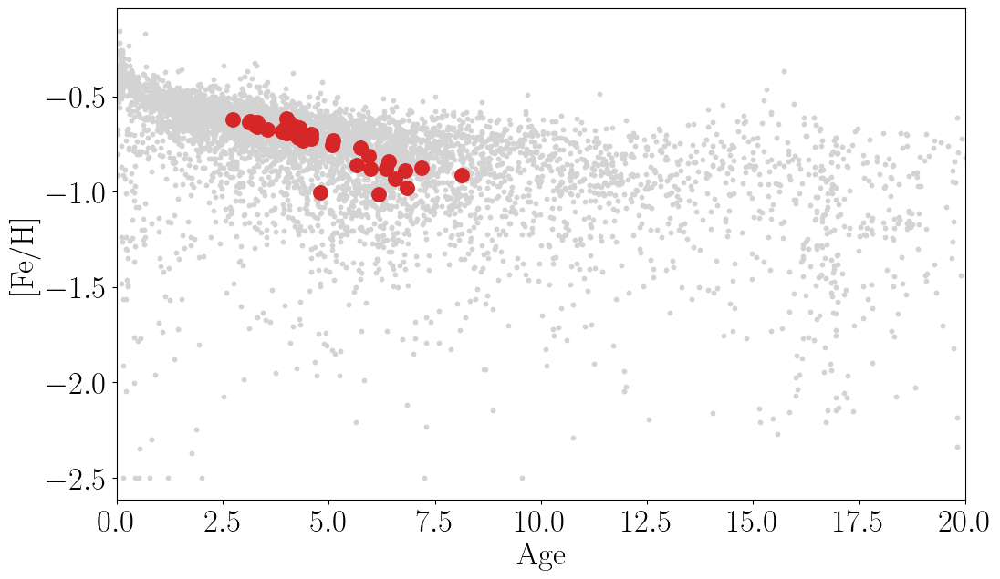

In [184]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgray',s=10)
plt.scatter(med_fld_age,fld_feh,c='tab:red',marker='.',s=500)
plt.xlim(0,20)
# xs_rads = np.linspace(min(fld_radius[np.argsort(fld_radius)][:-1]),max(fld_radius[np.argsort(fld_radius)][:-1]))
# plt.plot(xs_rads,p2(xs_rads),c='k',lw=3)
# plt.ylim(0,13)
plt.xlabel(r'Age')
plt.ylabel(r'[Fe/H]')
# plt.savefig('lmc_fld_age_radius_w_poly.png',bbox_inches='tight')
plt.show()


#### 
#### plot star make size mass 
#### maybe sq stellar mass
#### logage instead of linear age?
#### binned values in age or feh?
#### look at carrera paper

Text(0, 0.5, '[Fe/H]')

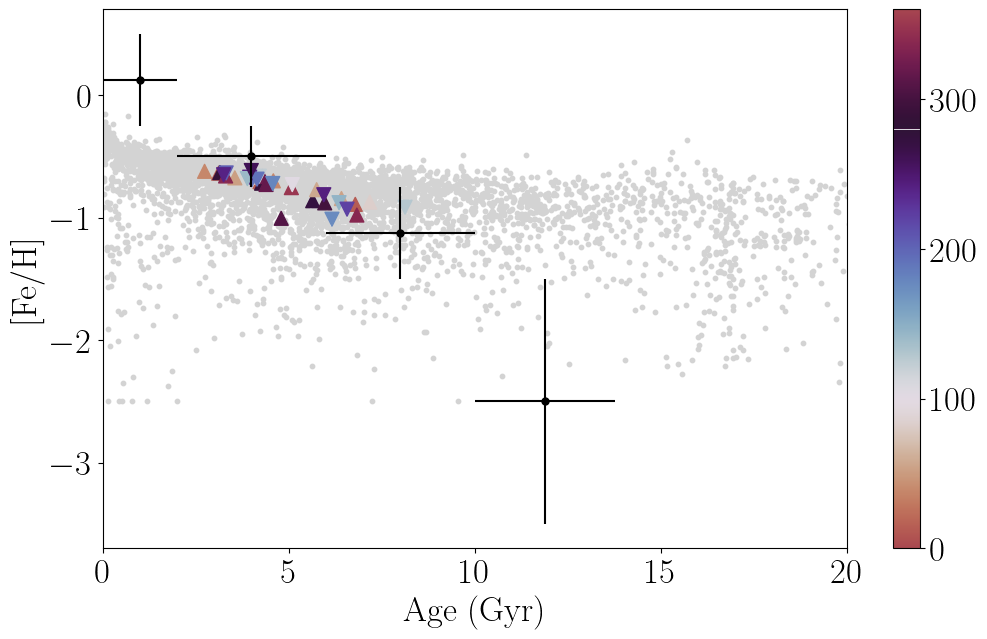

In [185]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(age_carrera,feh_carrera,s=25,c='k')
plt.scatter(med_fld_age[north_fld],fld_feh[north_fld],c=fld_pa[north_fld],marker='^',s=100,
            cmap=cmap_rolled,vmin=0,vmax=360)
plt.scatter(med_fld_age[south_fld],fld_feh[south_fld],c=fld_pa[south_fld],marker='v',s=100,
            cmap=cmap_rolled,vmin=0,vmax=360)
plt.errorbar(age_carrera,feh_carrera,xerr=age_wid_carrera,yerr=feh_wid_carrera,ls=' ',c='k')
plt.colorbar()
plt.xlim(0,20)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')

Text(0, 0.5, '[Fe/H]')

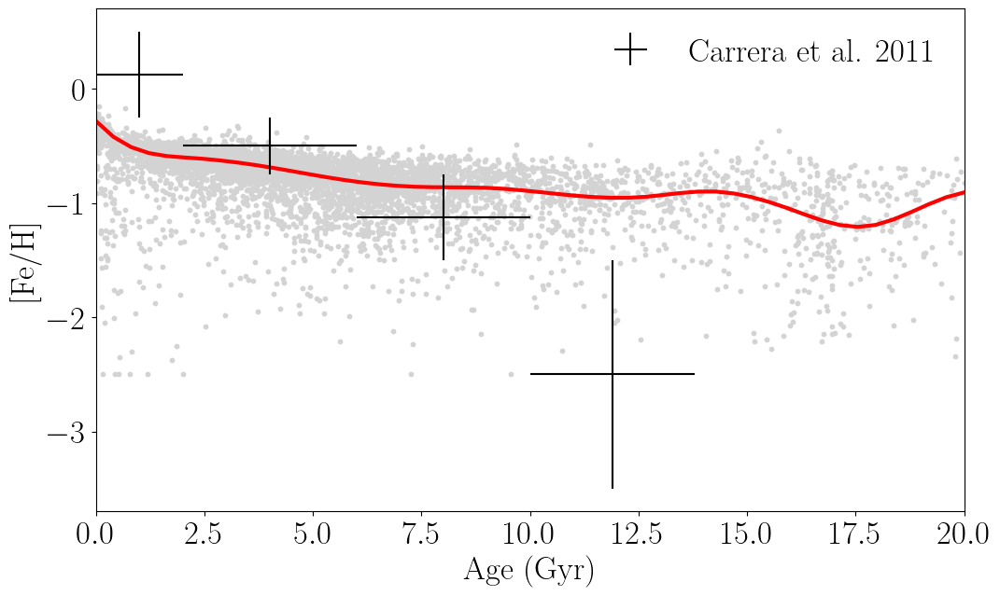

In [186]:
from scipy.stats import binned_statistic
# amr_spl = bspline(agetab['AGE'],lmcdr17['FE_H'])

amr_cut, = np.where((agetab['AGE']<=20.)&(np.isfinite(agetab['AGE'])==True)&(np.isfinite(lmcdr17['FE_H'])==True))

bin_stat,bin_edge,bin_num = binned_statistic(agetab['AGE'][amr_cut],lmcdr17['FE_H'][amr_cut],'median',bins=20)

amr_spl = bspline(bin_edge[:-1]+0.5*np.diff(bin_edge),bin_stat,extrapolate=True)

plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
# plt.scatter(age_carrera,feh_carrera,s=25,c='k')
plt.plot(np.linspace(0,20),amr_spl(np.linspace(0,20)),c='r',lw=3.)
plt.errorbar(age_carrera,feh_carrera,xerr=age_wid_carrera,yerr=feh_wid_carrera,ls=' ',c='k',
             label='Carrera et al. 2011')
plt.legend(frameon=False)
plt.xlim(0,20)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')

# plt.axvline(1)

In [187]:
amr_cut, = np.where((agetab['AGE']<=20.)&(np.isfinite(agetab['AGE'])==True)&(np.isfinite(lmcdr17['FE_H'])==True))

bin_stat,bin_edge,bin_num = binned_statistic(agetab['AGE'][amr_cut],lmcdr17['FE_H'][amr_cut],'median',bins=20)

bin_disp = np.ones(len(bin_stat))
for i in range(len(bin_disp)):
    wht_bin, = np.where(bin_num==np.unique(bin_num)[i])
    bin_disp[i] = mad(lmcdr17['FE_H'][amr_cut][wht_bin]) 

amr_spl = bspline(bin_edge[:-1]+0.5*np.diff(bin_edge),bin_stat,extrapolate=True)

# amr_spl(np.linspace(0,20))

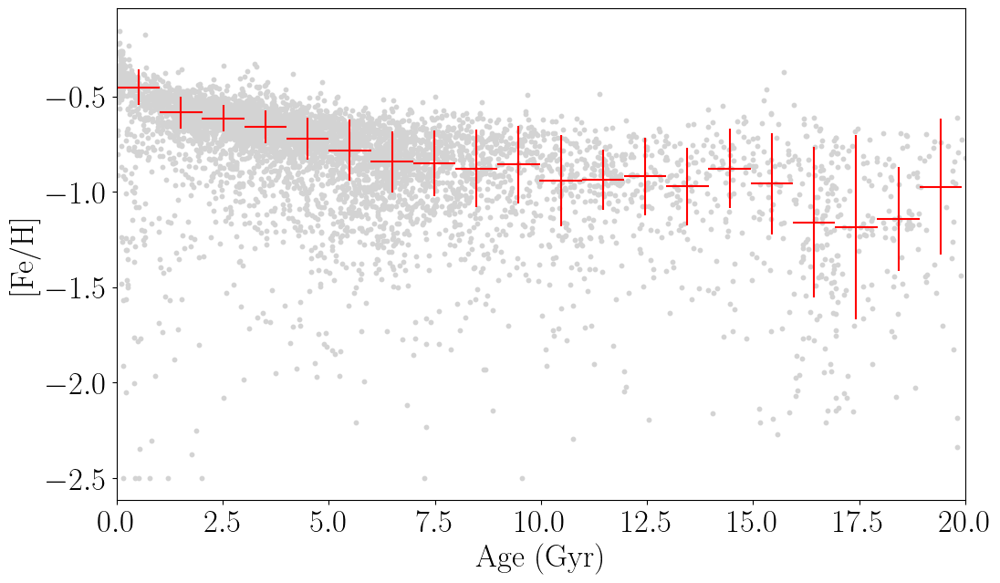

In [188]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
# plt.plot(np.linspace(0,20),amr_spl(np.linspace(0,20)),c='r',lw=3.)
plt.errorbar(bin_edge[:-1]+0.5*np.diff(bin_edge),bin_stat,xerr=0.5*np.ones(len(bin_stat)),yerr=bin_disp,ls=' ',c='r')
# plt.legend(frameon=False)
# plt.errorbar(age_carrera,feh_carrera,xerr=age_wid_carrera,yerr=feh_wid_carrera,ls=' ',c='k',
#              label='Carrera et al. 2011')
# plt.ylim(-3,0.5)
plt.xlim(0,20)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
# plt.savefig('lmc_amr.png',bbox_inches='tight')
plt.show()

In [189]:
# len()

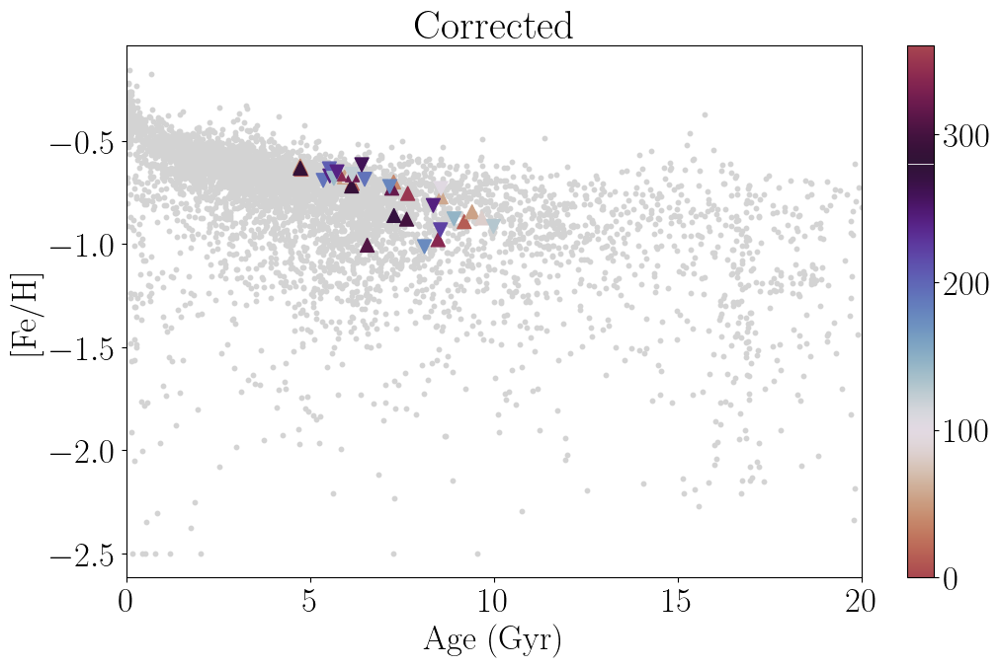

In [190]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
# plt.scatter(age_carrera,feh_carrera,s=25,c='k')
plt.scatter(fld_wgt_avg[north_fld],fld_feh[north_fld],c=fld_pa[north_fld],marker='^',s=100,
            cmap=cmap_rolled,vmin=0,vmax=360)
plt.scatter(fld_wgt_avg[south_fld],fld_feh[south_fld],c=fld_pa[south_fld],marker='v',s=100,
            cmap=cmap_rolled,vmin=0,vmax=360)
# plt.errorbar(age_carrera,feh_carrera,xerr=age_wid_carrera,yerr=feh_wid_carrera,ls=' ',c='k')
plt.colorbar()
plt.xlim(0,20)
plt.title('Corrected')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
# plt.savefig('lmc_amr_corr.png',bbox_inches='tight')
plt.show()

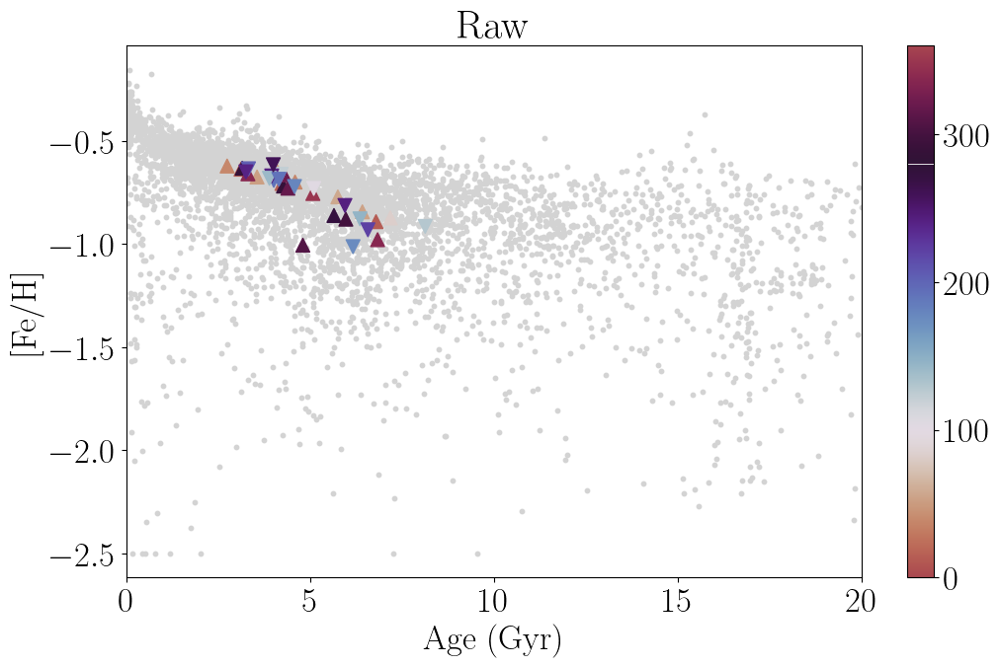

In [191]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
# plt.scatter(age_carrera,feh_carrera,s=25,c='k')
plt.scatter(med_fld_age[north_fld],fld_feh[north_fld],c=fld_pa[north_fld],marker='^',s=100,
            cmap=cmap_rolled,vmin=0,vmax=360)
plt.scatter(med_fld_age[south_fld],fld_feh[south_fld],c=fld_pa[south_fld],marker='v',s=100,
            cmap=cmap_rolled,vmin=0,vmax=360)
# plt.errorbar(age_carrera,feh_carrera,xerr=age_wid_carrera,yerr=feh_wid_carrera,ls=' ',c='k')
plt.colorbar()
plt.xlim(0,20)
plt.title('Raw')
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
# plt.savefig('lmc_amr_raw.png',bbox_inches='tight')
plt.show()

# sorted_binned AMR

In [192]:
import pandas as pd

'''@article{harris2009star,
  title={The star formation history of the large magellanic cloud},
  author={Harris, Jason and Zaritsky, Dennis},
  journal={The Astronomical Journal},
  volume={138},
  number={5},
  pages={1243},
  year={2009},
  publisher={IOP Publishing}
}'''

df = pd.read_csv('harris_zaritsky_09_lmc_clusters_table3.csv',skipfooter=6)
df

/var/folders/rc/1rzbdsbd3pb_0pd6mhcfkh2r0000gn/T/ipykernel_7956/3933023042.py:14: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  df = pd.read_csv('harris_zaritsky_09_lmc_clusters_table3.csv',skipfooter=6)


,Cluster,[Fe/H],sigma_[Fe/H],log(Age),sigma_log(Age),Reference,Notes
0,Reticulum,-1.66,0.12,10.13,0.05,Mackey & Gilmore (2004),a
1,BRHTb,-0.40,0.00,8.00,0.00,Piatti et al. (2003),bc
2,ESO121,-0.97,0.10,9.96,0.04,Mackey et al. (2006),sdotsdotsdot
3,R136,-0.40,0.00,7.00,0.00,Hunter et al. (1995),bc
4,OHSC33,-1.05,0.20,9.18,0.03,Bica et al. (1998),sdotsdotsdot
...,...,...,...,...,...,...,...
84,NGC 2257,-1.63,0.21,10.20,0.10,Dirsch et al. (2000),sdotsdotsdot
85,NGC 2213,-0.70,0.10,9.23,0.04,Kerber et al. (2007),e
86,NGC 2214,-0.20,0.20,8.00,0.00,Sagar & Richtler (1991),c
87,NGC 2249,-0.45,0.10,9.35,0.03,Kerber et al. (2007),sdotsdotsdot


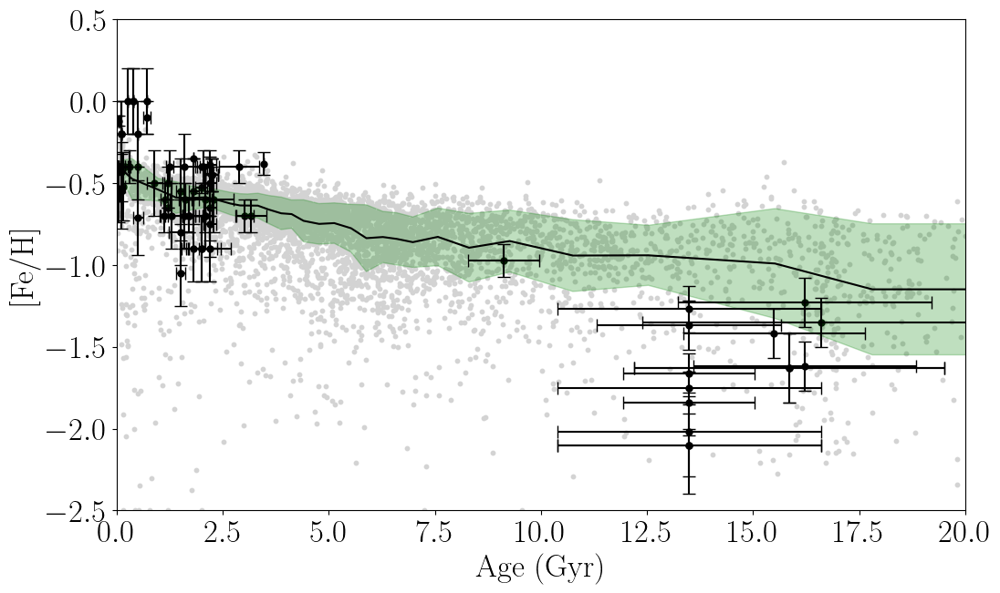

In [193]:
sidx = np.argsort(agetab['AGE'])

nbins = 200
chunks = np.array_split(sidx, len(sidx)/nbins)

binned_feh = 999999.0*np.ones(len(chunks))
binned_feh_mad = 999999.0*np.ones(len(chunks))
binned_age = 999999.0*np.ones(len(chunks))
binned_age_mad = 999999.0*np.ones(len(chunks))

for i in range(len(chunks)):

    binned_age[i] = np.nanmedian(agetab['AGE'][chunks[i]])
    binned_age_mad[i] = mad(agetab['AGE'][chunks[i]])
    binned_feh[i] = np.nanmedian(lmcdr17['FE_H'][chunks[i]])
    binned_feh_mad[i] = mad(lmcdr17['FE_H'][chunks[i]])
    
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']/10**9
plt.errorbar(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ',capsize=5)
plt.fill_between(binned_age,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.plot(binned_age,binned_feh,c='k')
plt.xlim(0,20)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.savefig('lmc_amr_numbin_clus.png',bbox_inches='tight')
plt.show()

In [452]:
help(bspline

Help on function bspline in module dlnpyutils.utils:

bspline(x, y, w=None, nquantiles=10, nord=3, knots=None, extrapolate=False)
    Fit a B-Spline to data.  This is a thin wrapper for scipy.interpolate.splrep
    and scipy.interpolate.BSpline.
    
    Parameters
    ----------
    x : numpy array
       Array of x-values to fit.
    y : numpy array
       Array of y-values to fit.
    w : numpy array, optional
       Array of weights for x/y.
    nquantiles : int, optional
       Number of quantiles to use to create the knots. Default is 10.
    nord : int, optional
       The degree of the spline fit.  Default is 3.
    knots : numpy array, optional
       The knot points for the BSpline.
    extrapolate : bool, optional
       Should the B-Spline be allowed to extrapolate.  Default is False.
    
    Returns
    -------
    
    spline : BSpline object
       BSpline object that can be used to interpolate
    
    
    Example
    -------
    
    spline = bspline(x,y,knots=knots,

array([0.05054188, 0.12396037, 0.06867417, 0.09679906, 0.0732109 ,
       0.06089045, 0.06301062, 0.06854073, 0.07163933, 0.0706905 ,
       0.07579802, 0.08610952, 0.09903783, 0.08653948, 0.12825254,
       0.12404936, 0.12353045, 0.14585103, 0.20416174, 0.15640713,
       0.15966144, 0.15419063, 0.1761109 , 0.20972144, 0.18914295,
       0.21951412, 0.18347941, 0.33556476, 0.40037671, 0.3346826 ])

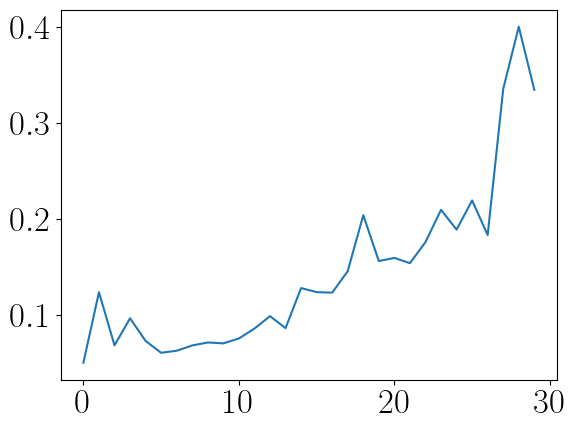

In [466]:
plt.plot(binned_feh_mad)
np.insert(np.copy(binned_feh_mad),0,np.array([binned_feh_mad[0]]))

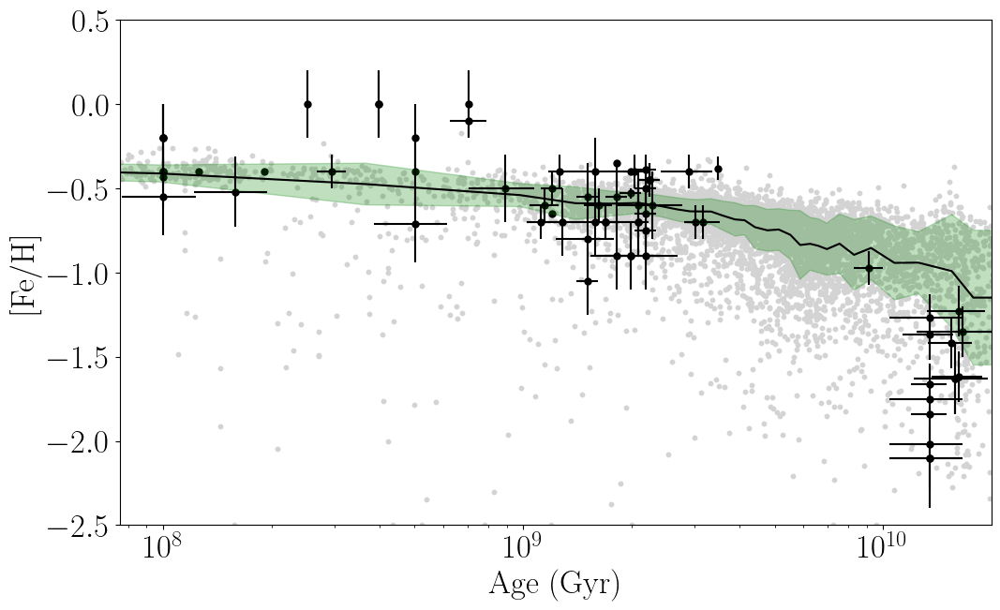

In [468]:
youngest, = np.where(agetab['AGE']==closest(agetab['AGE'],np.nanmin(binned_age*10**9)/10**9))
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE']*10**9,lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)'],df['[Fe/H]'],c='k',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']
plt.errorbar(10**df['log(Age)'],df['[Fe/H]'],c='k',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')#,capsize=5)
# plt.fill_between(binned_age*10**9,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')

plt.fill_between(np.insert(np.copy(binned_age*10**9),0,np.array([np.nanmin(agetab['AGE']*10**9)])),
                           np.insert(np.copy(binned_feh),0,np.array([lmcdr17['FE_H'][youngest]]))+np.insert(np.copy(binned_feh_mad),0,np.array([binned_feh_mad[0]])),
                           np.insert(np.copy(binned_feh),0,np.array([lmcdr17['FE_H'][youngest]]))-np.insert(np.copy(binned_feh_mad),0,np.array([binned_feh_mad[0]])),alpha=0.25,color='green')

plt.plot(np.insert(np.copy(binned_age*10**9),0,np.array([np.nanmin(agetab['AGE']*10**9)])),
         np.insert(np.copy(binned_feh),0,np.array([lmcdr17['FE_H'][youngest]])),c='k')

plt.xlim(10**7.88,10**10.301)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.xscale('log')
plt.savefig('lmc_amr_numbin_logscale_clus.png',bbox_inches='tight')
plt.show()

In [195]:
df.columns

Index(['Cluster', '[Fe/H]', 'sigma_[Fe/H]', 'log(Age)', 'sigma_log(Age)',
       'Reference', 'Notes'],
      dtype='object')

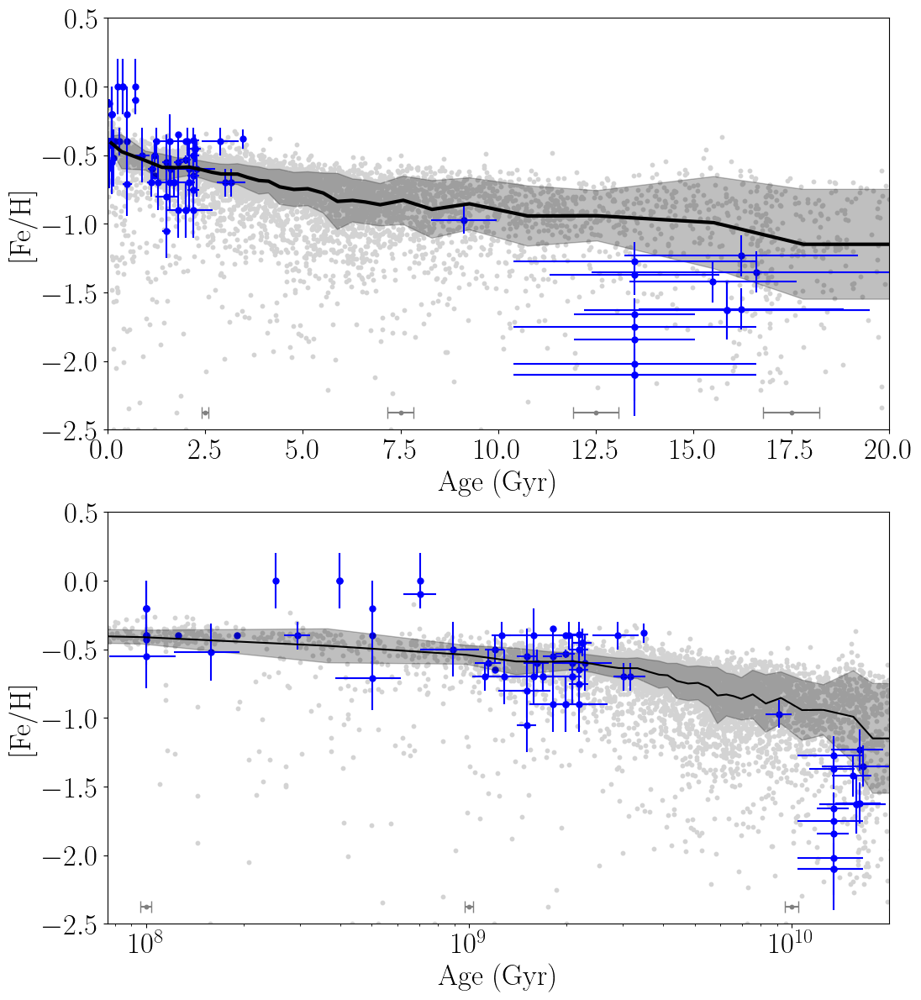

In [470]:
plt.figure(figsize=[12,14])

plt.subplot(211)
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)']/10**9,df['[Fe/H]'],c='blue',s=25,label='HZ09')
# plt.legend(frameon=False)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']/10**9
plt.errorbar(10**df['log(Age)']/10**9,df['[Fe/H]'],c='blue',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')
#,capsize=5)
plt.fill_between(binned_age,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='k')
plt.plot(binned_age,binned_feh,c='k',lw=3.0)
plt.xlim(0,20)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')

plt.scatter([2.5,7.5,12.5,17.5],[-2.375,-2.375,-2.375,-2.375],c='grey',s=10)
plt.errorbar([2.5,7.5,12.5,17.5],[-2.375,-2.375,-2.375,-2.375],
             xerr=cubic_star_age_err([2.5,7.5,12.5,17.5]),ls=' ',c='grey',lw=1.5,capsize=5)

plt.subplot(212)
plt.scatter(agetab['AGE']*10**9,lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)'],df['[Fe/H]'],c='blue',s=25)

hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']

plt.errorbar(10**df['log(Age)'],df['[Fe/H]'],c='blue',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')#,capsize=5)
# plt.fill_between(binned_age*10**9,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='k')
# plt.plot(binned_age*10**9,binned_feh,c='k',lw=3.0)

plt.fill_between(np.insert(np.copy(binned_age*10**9),0,np.array([np.nanmin(agetab['AGE']*10**9)])),
                           np.insert(np.copy(binned_feh),0,np.array([lmcdr17['FE_H'][youngest]]))+np.insert(np.copy(binned_feh_mad),0,np.array([binned_feh_mad[0]])),
                           np.insert(np.copy(binned_feh),0,np.array([lmcdr17['FE_H'][youngest]]))-np.insert(np.copy(binned_feh_mad),0,np.array([binned_feh_mad[0]])),
                 alpha=0.25,color='k')

plt.plot(np.insert(np.copy(binned_age*10**9),0,np.array([np.nanmin(agetab['AGE']*10**9)])),
         np.insert(np.copy(binned_feh),0,np.array([lmcdr17['FE_H'][youngest]])),c='k')

plt.xlim(10**7.88,10**10.301)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.xscale('log')

# charact = cubic_star_age_err([2.5,7.5,12.5,17.5])
# asymmetric_error = np.array(list(zip(lower_error, upper_error))).T


plt.scatter(np.array([10**8/10**9,1,10**10/10**9])*10**9,[-2.375,-2.375,-2.375],c='grey',s=10)
plt.errorbar(np.array([10**8/10**9,1,10**10/10**9])*10**9,[-2.375,-2.375,-2.375],
             xerr=cubic_star_age_err([10**8/10**9,1,10**10/10**9])*10**9,ls=' ',c='grey',lw=1.5,capsize=5)

# cubic_star_age_err([10**8/10**9,1,10**10/10**9])*10**9

plt.savefig('lmc_amr_numbin_bothscale_clus.png',bbox_inches='tight')
plt.show()

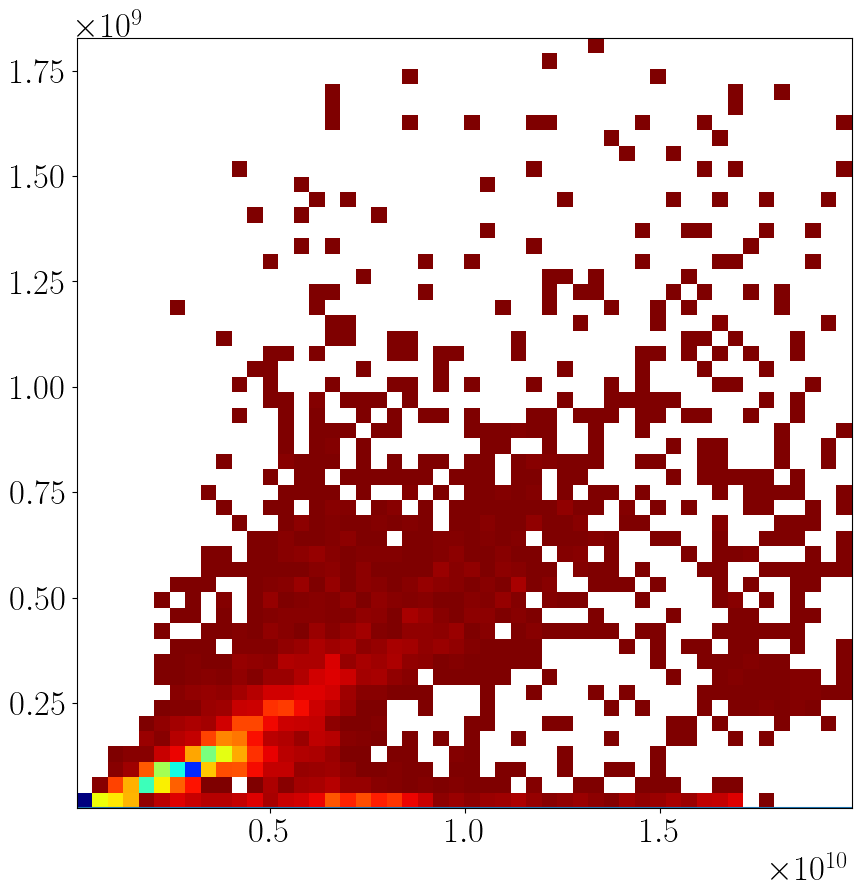

In [197]:
plt.figure(figsize=[10,10])
# plt.scatter(agetab['AGE'][age_cut]*10**9,agetab['AGE_ERR'][age_cut]*10**9)
ret = binned_statistic_2d(agetab['AGE'][cut2]*10**9,agetab['AGE_ERR'][cut2]*10**9,agetab['AGE'][cut2],'count',bins=50)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='jet_r')
# plt.xlim(10**7,10**10)
# plt.ylim(10**7,10**10)
# plt.xscale('log')
# plt.yscale('log')
plt.axhline(10**6.1)

In [198]:
cubic_star_age_err([10**8/10**9,1,10**10/10**9])*10**9

array([3.85205863e+06, 2.86557162e+07, 4.63546089e+08])

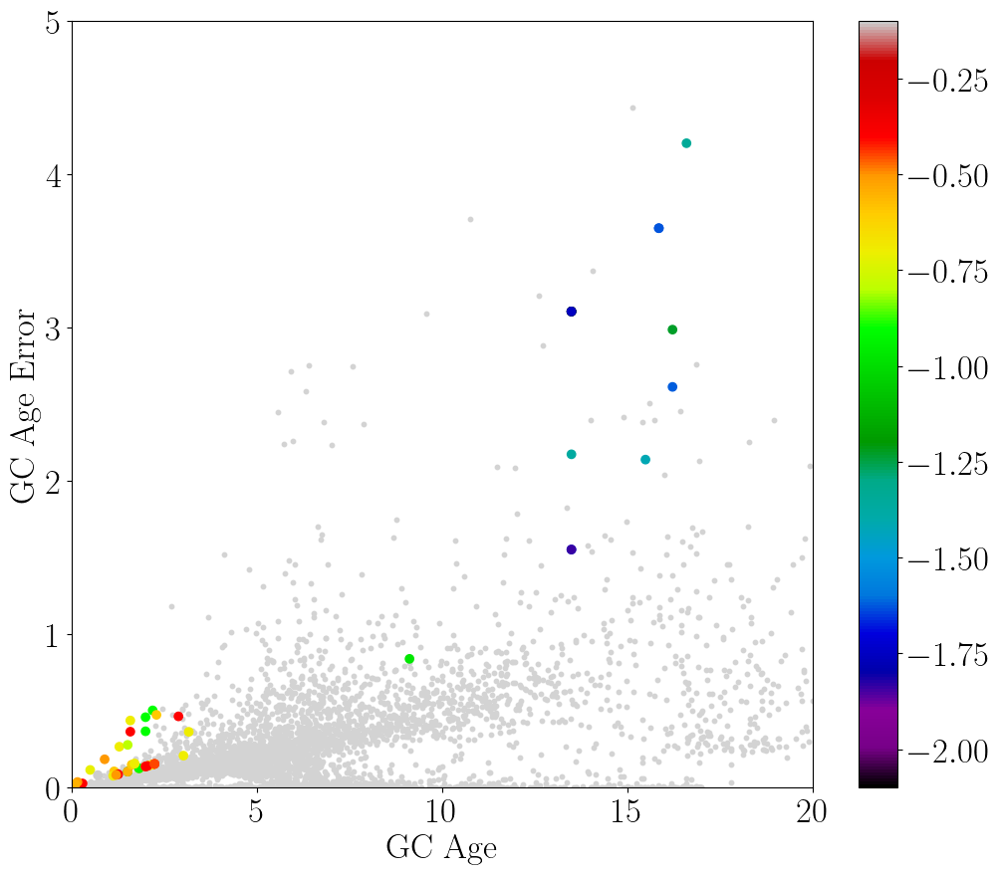

In [199]:
hz09err_good, = np.where(df['sigma_log(Age)']!=0.0)

plt.figure(figsize=[12,10])
plt.scatter(agetab['AGE'],agetab['AGE_ERR'],s=10,c='lightgrey')
plt.scatter(10**df['log(Age)'][hz09err_good]/10**9,(10**df['log(Age)'][hz09err_good])*np.log(10)*df['sigma_log(Age)'][hz09err_good]/10**9,
            c=df['[Fe/H]'][hz09err_good],cmap='nipy_spectral')
plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,5)
plt.xlabel(r'GC Age')
plt.ylabel(r'GC Age Error')
plt.show()

In [200]:
for i in ((10**df['log(Age)'][hz09err_good])*np.log(10)*df['sigma_log(Age)'][hz09err_good]/10**9):
    print(i)

1.5530509122289125
0.8399930253399637
0.10455310703948004
0.14432346377263955
1.5530509122289125
0.005130452810659304
0.005109092014528188
0.12570048212231436
0.15112521906992055
0.2669673792406382
0.14432346377263955
0.36493514389486975
0.15112521906992055
0.5037507302330685
0.15112521906992055
0.00802857316568715
0.1846963011837346
0.15464537763114336
0.45942612630601404
0.43792217267384365
0.36407067001059007
0.36754090104481124
0.2788082854386134
0.10455310703948004
0.15112521906992055
0.12570048212231436
0.4747425936556794
0.13782783789180422
0.00577013126474541
0.14103826065589095
2.1397692350935893
0.10574885653303413
3.106101824457825
0.11540262529490795
0.08150527048854458
2.6140490276921313
3.106101824457825
0.13782783789180422
0.01154026252949082
0.0009166756363305202
0.027181641486514068
0.07750628900819778
2.1742712771204777
3.106101824457825
3.106101824457825
0.0024451581146563376
0.005349423087733984
0.005349423087733984
4.203474080953205
2.9874846030767213
0.00370120997

1 53.486312014964184
2 8.596198929985269
3 5.345857508289765
4 7.404119063949971
5 7.213862460009554


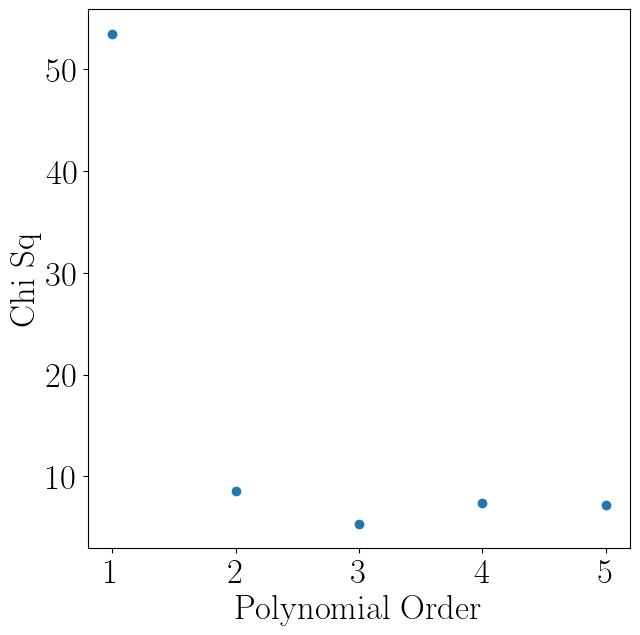

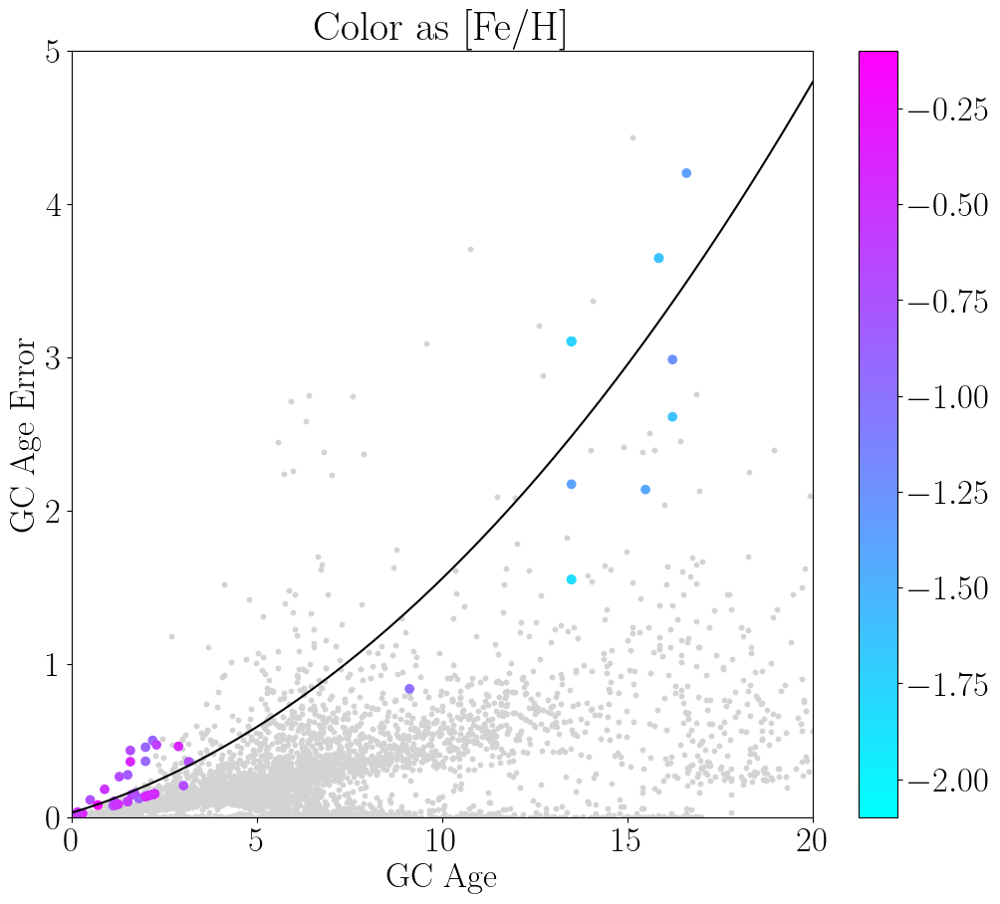

In [201]:
chi_sq = []

sidx = np.argsort(10**df['log(Age)'][hz09err_good]/10**9)

age_to_fit = np.asarray(10**df['log(Age)'][hz09err_good]/10**9)[sidx]
err_to_fit = np.asarray((10**df['log(Age)'][hz09err_good])*np.log(10)*df['sigma_log(Age)'][hz09err_good]/10**9)[sidx]

for i in range(6)[1:]:
    
    p = np.poly1d(robust.polyfit(age_to_fit,err_to_fit,i))
    
    chi_sq.append(sum(np.divide(np.square(err_to_fit-p(age_to_fit)),err_to_fit))) #/(len(fld_radius[:-1]-(i+1))))
    
    print(i,chi_sq[-1])
    
chi_sq = np.array(chi_sq)

plt.figure(figsize=[7,7])
plt.scatter(np.arange(len(chi_sq))+1,chi_sq)
plt.xlabel(r'Polynomial Order')
plt.ylabel(r'Chi Sq')
# plt.savefig(r'chisq_age_radius_polyfit.png',bbox_inches='tight')
plt.show()

age_err_poly = np.poly1d(np.polyfit(age_to_fit,err_to_fit,3))

hz09err_good, = np.where(df['sigma_log(Age)']!=0.0)

plt.figure(figsize=[12,10])
plt.scatter(agetab['AGE'],agetab['AGE_ERR'],s=10,c='lightgrey')
plt.scatter(10**df['log(Age)'][hz09err_good]/10**9,
            (10**df['log(Age)'][hz09err_good])*np.log(10)*df['sigma_log(Age)'][hz09err_good]/10**9,
            c=df['[Fe/H]'][hz09err_good],cmap='cool')
plt.plot(np.linspace(0,20),age_err_poly(np.linspace(0,20)),c='k')
plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,5)
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'GC Age')
plt.ylabel(r'GC Age Error')
plt.savefig(r'age_err_w_clus.png',bbox_inches='tight')
plt.show()

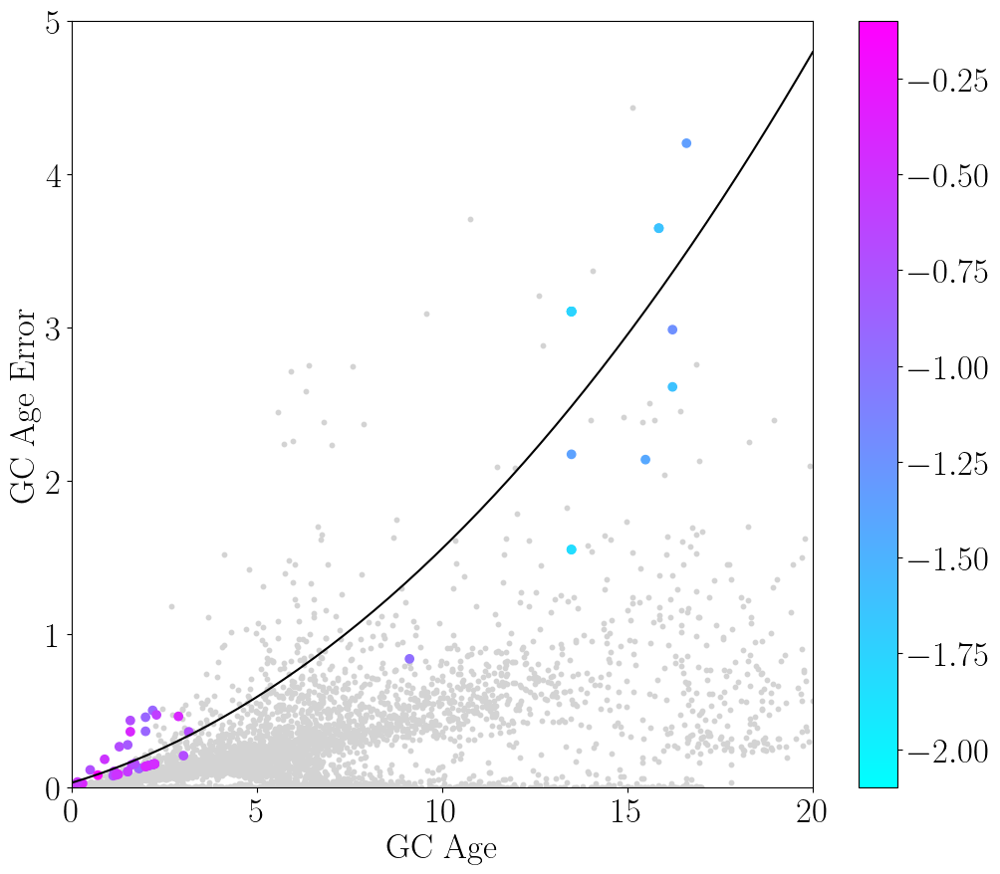

7.229422425439141

In [202]:
def exp_error_model(x,a,b):
    return a*np.exp(b*x)

def cubic_error_model(x,a,b,c,d):
    return a*x**3+b*x**2+c*x+d

from scipy.optimize import curve_fit

popt, pcov = curve_fit(cubic_error_model,age_to_fit,err_to_fit)

plt.figure(figsize=[12,10])
plt.scatter(agetab['AGE'],agetab['AGE_ERR'],s=10,c='lightgrey')
plt.scatter(10**df['log(Age)'][hz09err_good]/10**9,
            (10**df['log(Age)'][hz09err_good])*np.log(10)*df['sigma_log(Age)'][hz09err_good]/10**9,
            c=df['[Fe/H]'][hz09err_good],cmap='cool')
plt.plot(np.linspace(0,20),cubic_error_model(np.linspace(0,20),*popt),c='k')
plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,5)
plt.xlabel(r'GC Age')
plt.ylabel(r'GC Age Error')
plt.show()

np.sum(np.divide(np.square(cubic_error_model(age_to_fit,*popt)-err_to_fit),err_to_fit))

In [203]:
inter_err = age_err_poly(agetab['AGE'])

(array([ 3.,  0.,  1.,  1.,  4.,  0.,  1.,  2.,  2.,  0.,  1.,  5.,  0.,
         3.,  9., 11., 18.,  1.,  0.,  3.]),
 array([-2.1, -2. , -1.9, -1.8, -1.7, -1.6, -1.5, -1.4, -1.3, -1.2, -1.1,
        -1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1]),
 [<matplotlib.patches.Polygon at 0x7f7a9aa4f700>])

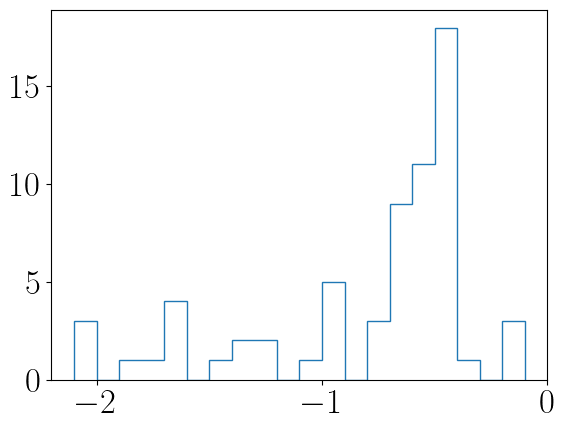

In [204]:
plt.hist(df['[Fe/H]'][hz09err_good],bins=20,histtype='step')

(array([4.370e+02, 2.480e+03, 1.612e+03, 1.101e+03, 4.170e+02, 5.500e+01,
        2.000e+01, 5.000e+00, 1.000e+00, 2.000e+00]),
 array([0.00851522, 0.01158263, 0.01465004, 0.01771744, 0.02078485,
        0.02385226, 0.02691966, 0.02998707, 0.03305447, 0.03612188,
        0.03918929], dtype=float32),
 <BarContainer object of 10 artists>)

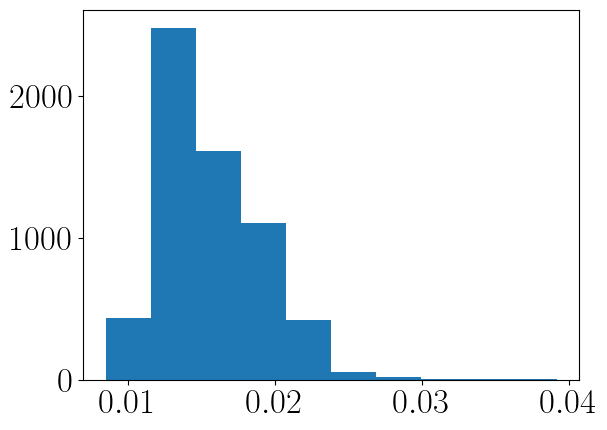

In [205]:
plt.hist(lmcdr17['FE_H_ERR'])

In [206]:
for i in df['sigma_log(Age)']:
    print(i)

0.05
0.0
0.04
0.0
0.03
0.03
0.05
0.0
0.0
0.25
0.14
0.0
0.03
0.03
0.0
0.09
0.03
0.1
0.03
0.0
0.1
0.03
0.22
0.09
0.03
0.0
0.0
0.1
0.12
0.0
0.05
0.08
0.08
0.0
0.03
0.03
0.03
0.09
0.03
0.05
0.03
0.06
0.04
0.1
0.1
0.05
0.07
0.0
0.0
0.0
0.1
0.03
0.1
0.1
0.04
0.0
0.0
0.0
0.0
0.0
0.03
0.07
0.1
0.1
0.15
0.15
0.0
0.15
0.11
0.08
0.14
0.1
0.07
0.0
0.1
0.03
0.03
0.0
0.04
0.03
0.1
0.04
0.0
0.03
0.1
0.04
0.0
0.03
0.1


In [207]:
north = Table.read('region_north_SFH_2.txt',format='ascii')
south = Table.read('region_south_SFH_2.txt',format='ascii')

# plt.plot((north['Age_max']+north['Age_min'])/2.,north['SFR'],label='North')

In [208]:
north.columns

<TableColumns names=('Age_min','Age_max','SFR','err_SFR','SFR_times_area','err_SFR_times_area','Z','err_Z')>

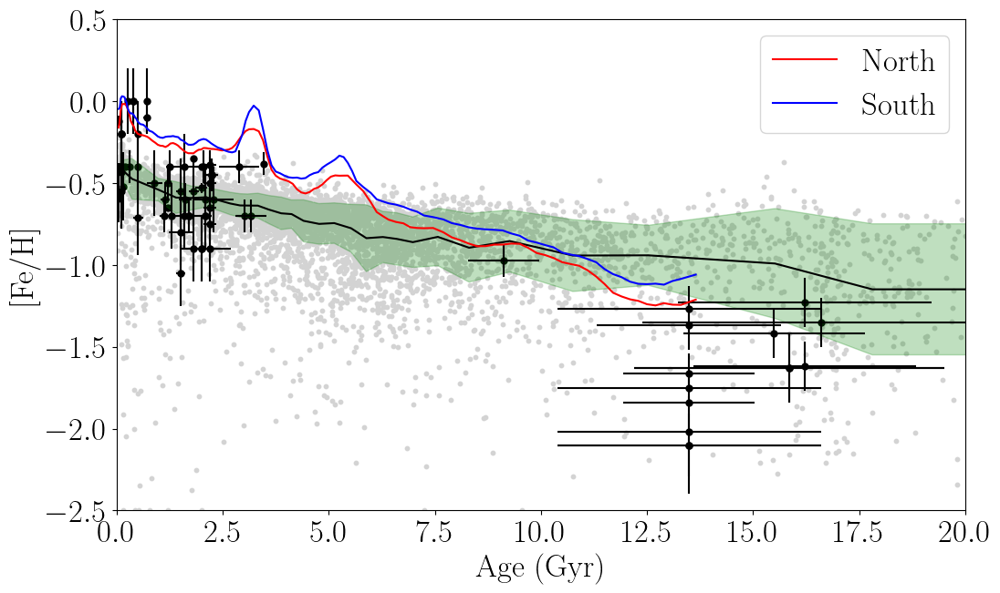

In [209]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']/10**9
plt.errorbar(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')#,capsize=5)
plt.fill_between(binned_age,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.plot(binned_age,binned_feh,c='k')

north_err = north['err_Z']/(np.log(10)*north['Z'])
south_err = south['err_Z']/(np.log(10)*south['Z'])

plt.plot((north['Age_max']+north['Age_min'])/2.,np.log10(north['Z']/0.0139),c='r',label='North')
# plt.fill_between((north['Age_max']+north['Age_min'])/2.,np.log10(north['Z']/0.0139)+north_err,np.log10(north['Z']/0.0139)-north_err,alpha=0.25,color='red')
plt.plot((south['Age_max']+south['Age_min'])/2.,np.log10(south['Z']/0.0139),c='b',label='South')
# plt.fill_between((south['Age_max']+south['Age_min'])/2.,np.log10(south['Z']/0.0139)+south_err,np.log10(south['Z']/0.0139)-south_err,alpha=0.25,color='blue')
plt.legend()

plt.xlim(0,20)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.savefig('lmc_amr_numbin_smash_noband.png',bbox_inches='tight')
plt.show()

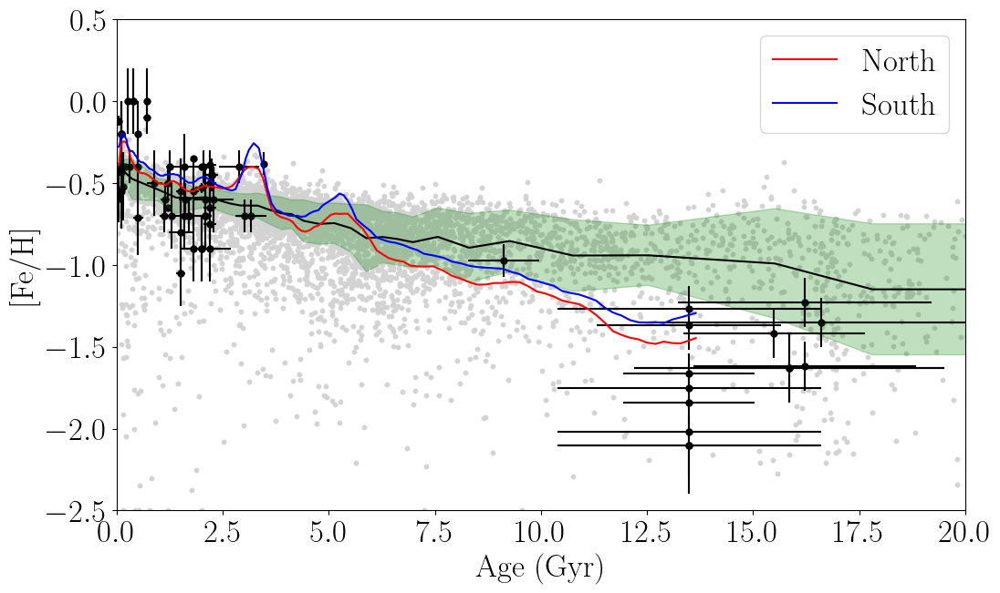

In [210]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']/10**9
plt.errorbar(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')#,capsize=5)
plt.fill_between(binned_age,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.plot(binned_age,binned_feh,c='k')

north_err = north['err_Z']/(np.log(10)*north['Z'])
south_err = south['err_Z']/(np.log(10)*south['Z'])

plt.plot((north['Age_max']+north['Age_min'])/2.,np.log10(north['Z']/(1.0-0.0245-north['Z'])) - np.log10(0.0245),c='r',label='North')
# plt.fill_between((north['Age_max']+north['Age_min'])/2.,np.log10(north['Z']/0.0139)+north_err,np.log10(north['Z']/0.0139)-north_err,alpha=0.25,color='red')
plt.plot((south['Age_max']+south['Age_min'])/2.,np.log10(south['Z']/(1.0-0.0245-south['Z'])) - np.log10(0.0245),c='b',label='South')
# plt.fill_between((south['Age_max']+south['Age_min'])/2.,np.log10(south['Z']/0.0139)+south_err,np.log10(south['Z']/0.0139)-south_err,alpha=0.25,color='blue')
plt.legend()

plt.xlim(0,20)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.savefig('lmc_amr_numbin_smash_noband.png',bbox_inches='tight')
plt.show()

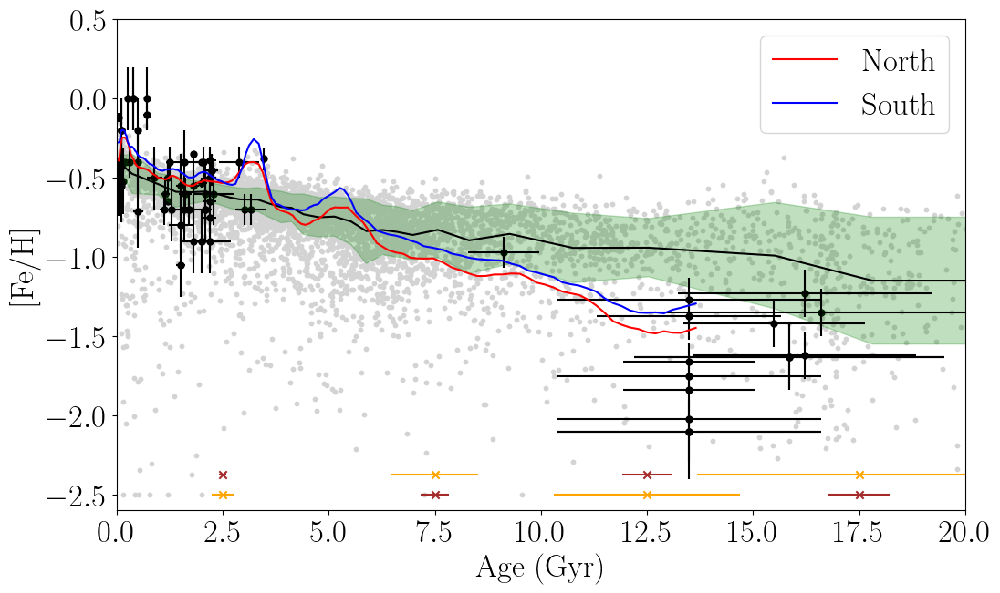

In [211]:
# inter_err = age_err_poly(agetab['AGE'])

plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']/10**9
plt.errorbar(10**df['log(Age)']/10**9,df['[Fe/H]'],c='k',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')
plt.fill_between(binned_age,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.plot(binned_age,binned_feh,c='k')

north_err = north['err_Z']/(np.log(10)*north['Z'])
south_err = south['err_Z']/(np.log(10)*south['Z'])

plt.plot((north['Age_max']+north['Age_min'])/2.,np.log10(north['Z']/(1.0-0.0245-north['Z'])) - np.log10(0.0245),
         c='r',label='North')
# plt.fill_between((north['Age_max']+north['Age_min'])/2.,np.log10(north['Z']/0.0139)+north_err,np.log10(north['Z']/0.0139)-north_err,alpha=0.25,color='red')
plt.plot((south['Age_max']+south['Age_min'])/2.,np.log10(south['Z']/(1.0-0.0245-south['Z'])) - np.log10(0.0245),
         c='b',label='South')
# plt.fill_between((south['Age_max']+south['Age_min'])/2.,np.log10(south['Z']/0.0139)+south_err,np.log10(south['Z']/0.0139)-south_err,alpha=0.25,color='blue')
plt.legend()

plt.scatter([2.5,7.5,12.5,17.5],[-2.5,-2.375,-2.5,-2.375],marker='x',c='orange')
plt.errorbar([2.5,7.5,12.5,17.5],[-2.5,-2.375,-2.5,-2.375],xerr=age_err_poly([2.5,7.5,12.5,17.5]),ls=' ',c='orange',lw=1.5)

plt.scatter([2.5,7.5,12.5,17.5],[-2.375,-2.5,-2.375,-2.5],marker='x',c='brown')
plt.errorbar([2.5,7.5,12.5,17.5],[-2.375,-2.5,-2.375,-2.5],xerr=cubic_star_age_err([2.5,7.5,12.5,17.5]),ls=' ',c='brown',lw=1.5)

plt.xlim(0,20)
plt.ylim(-2.6,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.savefig('amr_w_clus_sfh_err.png',bbox_inches='tight')
plt.show()

In [212]:
age_err_poly([2.5,7.5,12.5,17.5])

array([0.26170064, 1.02299478, 2.20206364, 3.8187984 ])

In [213]:
cubic_star_age_err([2.5,7.5,12.5,17.5])

array([0.08212351, 0.3290572 , 0.58418523, 0.72032093])

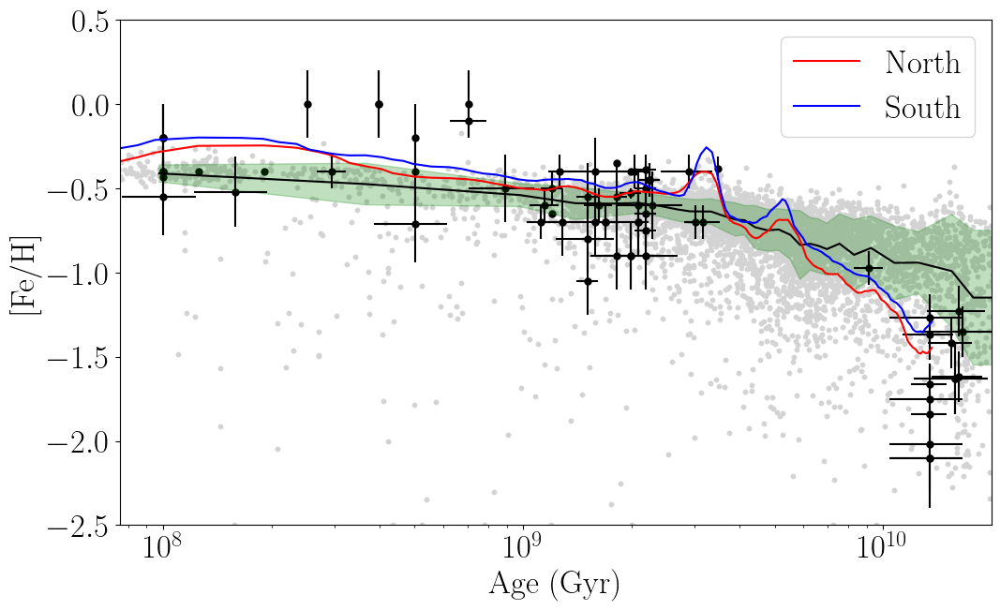

In [214]:
plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE']*10**9,lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)'],df['[Fe/H]'],c='k',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']
plt.errorbar(10**df['log(Age)'],df['[Fe/H]'],c='k',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')#,capsize=5)
plt.fill_between(binned_age*10**9,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.plot(binned_age*10**9,binned_feh,c='k')

plt.plot(((north['Age_max']+north['Age_min'])/2.)*10**9,np.log10(north['Z']/(1.0-0.0245-north['Z'])) - np.log10(0.0245),c='r',label='North')
# plt.fill_between(((north['Age_max']+north['Age_min'])/2.)*10**9,np.log10(north['Z']/0.0139)+north_err,np.log10(north['Z']/0.0139)-north_err,alpha=0.25,color='red')
plt.plot(((south['Age_max']+south['Age_min'])/2.)*10**9,np.log10(south['Z']/(1.0-0.0245-south['Z'])) - np.log10(0.0245),c='b',label='South')
# plt.fill_between(((south['Age_max']+south['Age_min'])/2.)*10**9,np.log10(south['Z']/0.0139)+south_err,np.log10(south['Z']/0.0139)-south_err,alpha=0.25,color='blue')
plt.legend()

plt.xlim(10**7.88,10**10.301)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.xscale('log')
# plt.savefig('lmc_amr_numbin_logscale_smash_noband.png',bbox_inches='tight')
plt.show()

In [215]:
10**((north['Age_max']+north['Age_min'])/2.)

1.109174815262401
1.1614486138404765
1.1885022274370185
1.216186000646368
1.2445146117715284
1.333521432163324
1.462177174456718
1.5488166189124815
1.62181009735893
...
1258925411794.1663


In [216]:
massive.columns

NameError: name 'massive' is not defined

# Other Clusters

In [217]:
import pandas as pd

'''@article{mackey2003surface,
  title={Surface brightness profiles and structural parameters for 53 rich stellar clusters in the Large Magellanic Cloud},
  author={Mackey⋆, AD and Gilmore, GF},
  journal={Monthly Notices of the Royal Astronomical Society},
  volume={338},
  number={1},
  pages={85--119},
  year={2003},
  publisher={Blackwell Science Ltd Oxford, UK}
}'''

#Rm 1805 and 1818

df2 = pd.read_csv('Mackey_Gilmore_2003.csv')#,names=['NAME','ALT_NAME','RA','DEC','R_OPT','R_ROT','LOG_AGE','LOG_AGE_UPPER','LOG_AGE_LOWER','AGE_REF','METALLICITY','METALLICITY_UPPER','METALLICITY_LOWER','METALLICITY_REF'])
df2

,NAME,ALT_NAME,RA,DEC,R_OPT,R_ROT,LOG_AGE,LOG_AGE_UPPER,LOG_AGE_LOWER,AGE_REF,METALLICITY,METALLICITY_UPPER,METALLICITY_LOWER,METALLICITY_REF
0,'NGC1466',"'SL1, LW1'",'03h44m33s','-71d40m18s',7.89,8.38,10.10,0.01,0.01,'5',-2.17,0.20,0.20,'12'
1,'NGC1651',"'SL7, LW12'",'04h37m32s','-70d35m06s',3.77,4.29,9.30,0.08,0.10,'5',-0.37,0.20,0.20,'12'
2,'NGC1711','SL55','04h50m37s','-69d59m06s',2.64,3.17,7.70,0.05,0.05,'2',-0.57,0.17,0.17,'2'
3,'NGC1718','SL65','04h52m25s','-67d03m06s',3.69,4.00,9.30,0.30,0.30,'4',-0.42,0.00,0.00,'x'
4,'NGC1754','SL91','04h54m17s','-70d26m30s',2.43,2.96,10.19,0.06,0.07,'11',-1.54,0.20,0.20,'12'
5,'NGC1777',"'SL121, LW96'",'04h55m48s','-74d17m00s',5.10,5.44,9.08,0.12,0.18,5',-0.35,0.20,0.20,'12'
6,'NGC1786','SL149','04h59m06s','-67d44m42s',2.70,3.02,10.18,0.01,0.01,'5',-1.87,0.20,0.20,'12'
7,'NGC1831',"'SL227, LW133'",'05h06m16s','-64d55m06s',4.82,4.85,8.50,0.30,0.30,'4',0.01,0.20,0.20,'12'
8,'NGC1835','SL215','05h05m05s','-69d24m12s',1.40,1.90,10.22,0.07,0.08,'11',-1.79,0.20,0.20,'12'
9,'NGC1841','xxxxx','04h45m23s','-83d59m48s',14.55,14.78,10.09,0.01,0.01,'5',-2.11,0.10,0.10,'15'


In [218]:
(2.897771955*10**-3)/300*10**6

9.659239849999999

In [219]:
df2['LOG_AGE_UPPER'][0]

0.01

In [220]:
# asymmetric_error = np.array(list(zip(lower_error, upper_error))).T

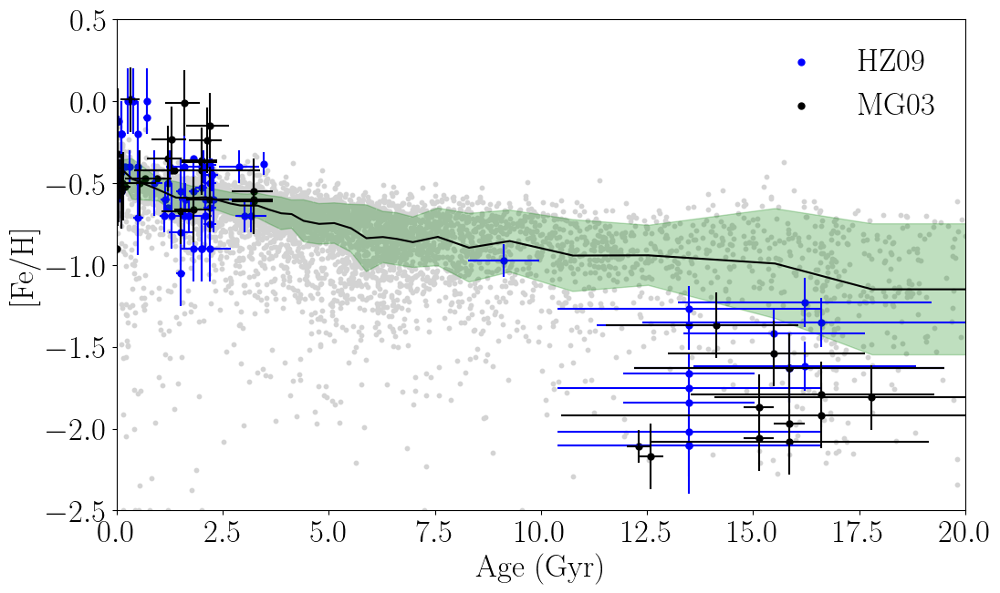

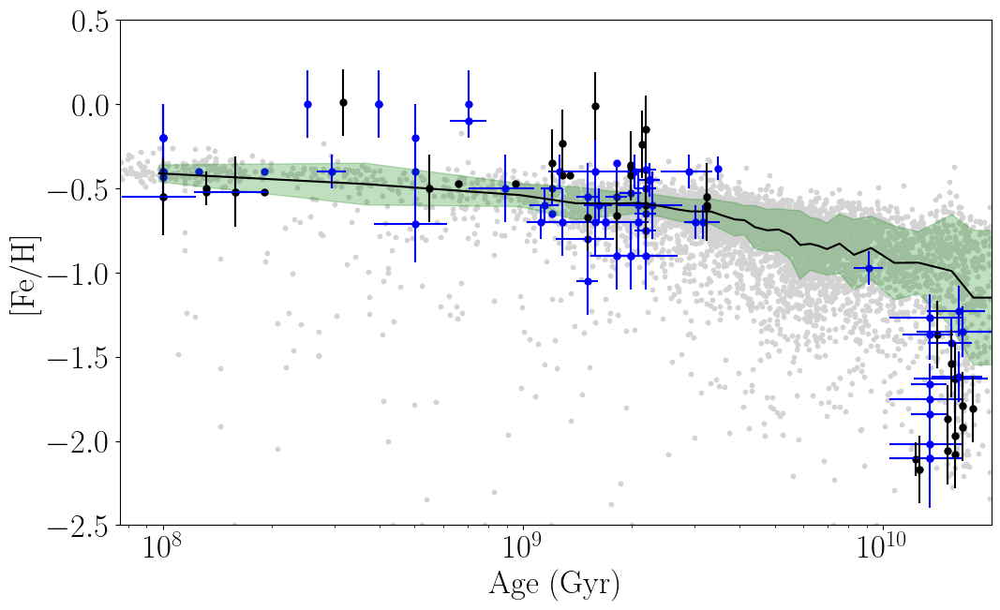

In [221]:
mg03_err_lo = (10**df2['LOG_AGE'])*np.log(10)*df2['LOG_AGE_LOWER']/10**9
mg03_err_hi = (10**df2['LOG_AGE'])*np.log(10)*df2['LOG_AGE_UPPER']/10**9

asym_age_err = np.array(list(zip(mg03_err_lo, mg03_err_hi))).T
asym_feh_err = np.array(list(zip(df2['METALLICITY_LOWER'], df2['METALLICITY_UPPER']))).T

hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']/10**9

plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE'],lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)']/10**9,df['[Fe/H]'],c='b',s=25,label='HZ09')
plt.errorbar(10**df['log(Age)']/10**9,df['[Fe/H]'],c='b',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')
plt.scatter(10**df2['LOG_AGE']/10**9,df2['METALLICITY'],c='k',s=25,label='MG03')
plt.legend(frameon=False)
plt.errorbar(10**df2['LOG_AGE']/10**9,df2['METALLICITY'],c='k',yerr=asym_feh_err,xerr=asym_age_err,ls=' ')
plt.fill_between(binned_age,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.plot(binned_age,binned_feh,c='k')
plt.xlim(0,20)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
# plt.savefig('lmc_amr_numbin_clus.png',bbox_inches='tight')
plt.show()

plt.figure(figsize=[12,7])
plt.scatter(agetab['AGE']*10**9,lmcdr17['FE_H'],c='lightgrey',s=10)
plt.scatter(10**df['log(Age)'],df['[Fe/H]'],c='b',s=25)
hz09_err = (10**df['log(Age)'])*np.log(10)*df['sigma_log(Age)']
plt.errorbar(10**df['log(Age)'],df['[Fe/H]'],c='b',yerr=df['sigma_[Fe/H]'],xerr=hz09_err,ls=' ')#,capsize=5)
plt.fill_between(binned_age*10**9,binned_feh+binned_feh_mad,binned_feh-binned_feh_mad,alpha=0.25,color='green')
plt.scatter(10**df2['LOG_AGE'],df2['METALLICITY'],c='k',s=25,label='MG03')
plt.errorbar(10**df2['LOG_AGE'],df2['METALLICITY'],c='k',yerr=asym_feh_err,xerr=asym_age_err,ls=' ')
plt.plot(binned_age*10**9,binned_feh,c='k')
plt.xlim(10**7.88,10**10.301)
plt.ylim(-2.5,0.5)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'[Fe/H]')
plt.xscale('log')

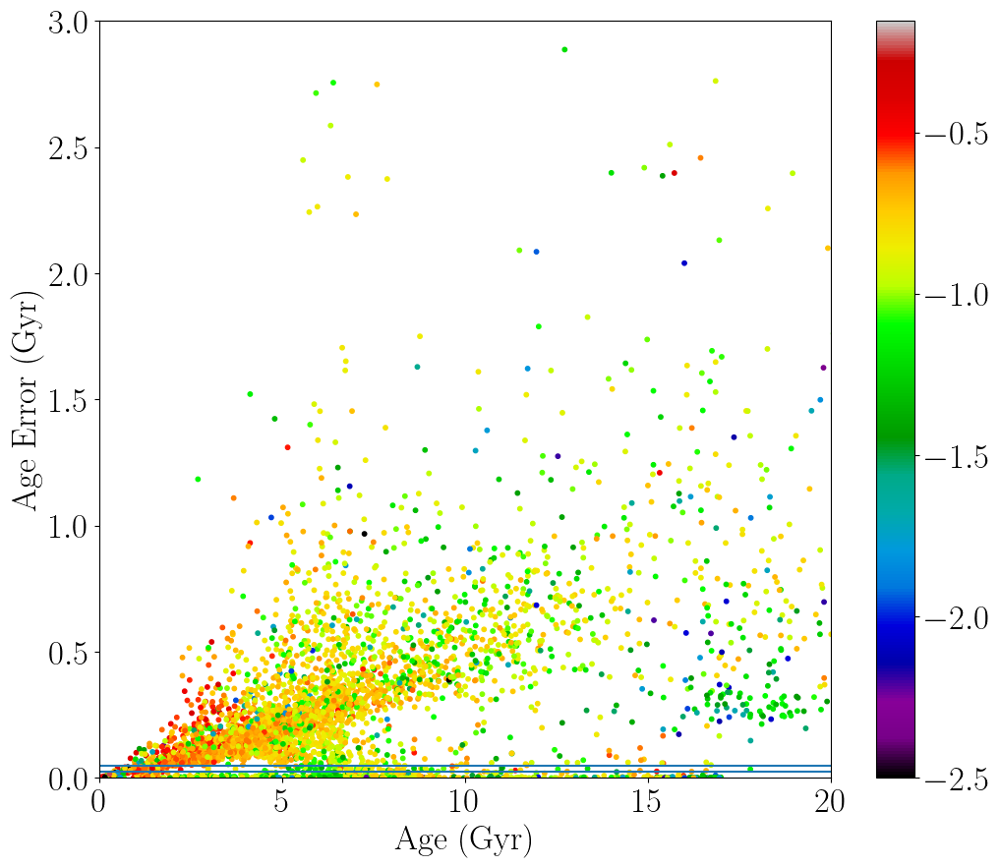

In [222]:
plt.figure(figsize=[12,10])
plt.scatter(agetab['AGE'],agetab['AGE_ERR'],c=lmcdr17['FE_H'],cmap='nipy_spectral',s=10)
plt.colorbar()
plt.xlim(0,20)
plt.ylim(0,3)
plt.axhline(0.025)
plt.axhline(0.05)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')
plt.show()


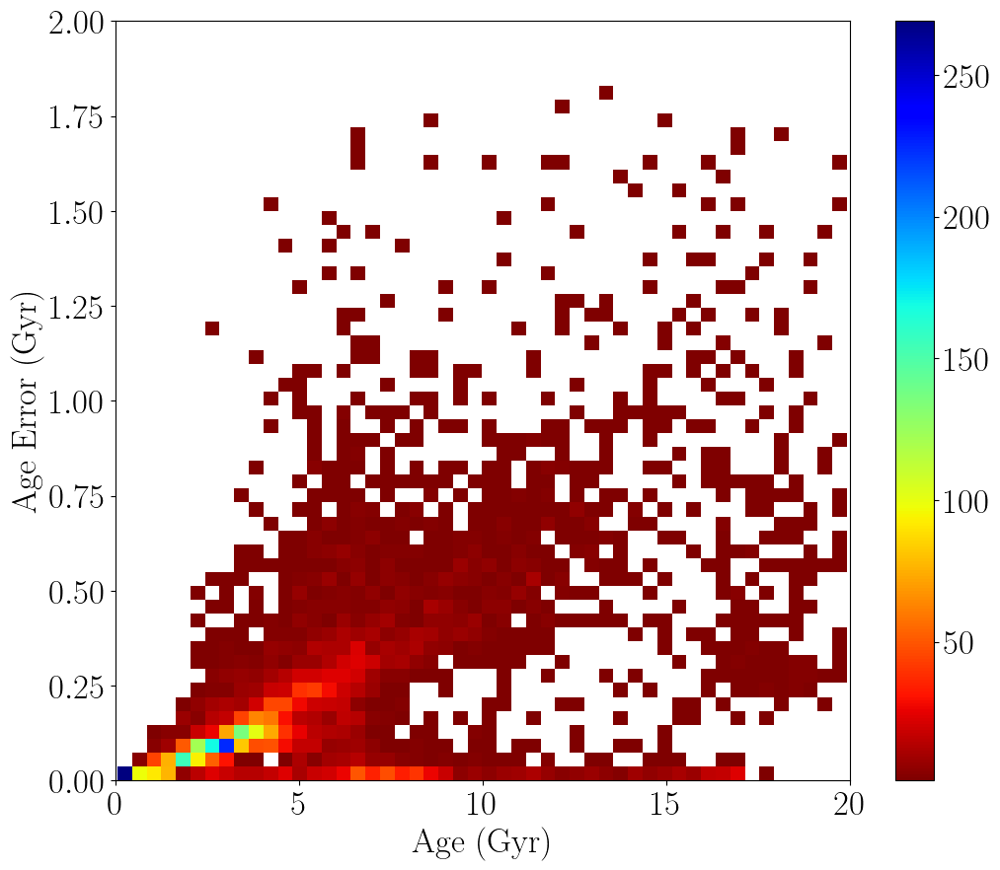

In [223]:
plt.figure(figsize=[12,10])
agecut = np.where((agetab['AGE']<=20.)&(agetab['AGE_ERR']<=2.))
ret = binned_statistic_2d(agetab['AGE'][agecut],agetab['AGE_ERR'][agecut],agetab['AGE'][agecut],'count',bins=50)
ret.statistic[ret.statistic==0] = np.nan
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='jet_r')
plt.colorbar()

# binn

plt.xlim(0,20)
plt.ylim(0,2)
plt.xlabel(r'Age (Gyr)')
plt.ylabel(r'Age Error (Gyr)')
plt.show()


(array([3490., 1016.,  502.,  311.,  142.,   79.,   46.,   28.,   21.,
          10.]),
 array([1.82569101e-06, 1.82671063e-01, 3.65340299e-01, 5.48009536e-01,
        7.30678773e-01, 9.13348010e-01, 1.09601725e+00, 1.27868648e+00,
        1.46135572e+00, 1.64402496e+00, 1.82669419e+00]),
 <BarContainer object of 10 artists>)

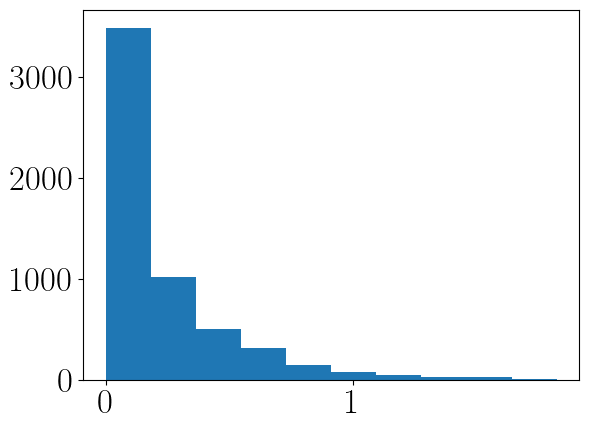

In [224]:
plt.hist(agetab['AGE_ERR'][agecut])